<a href="https://colab.research.google.com/github/raghavendranhp/Financial_Risk_Detection/blob/main/Finance_Risk_Detection.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

<div id="custom-header" style="padding: 15px; color: white; margin: 0; font-size: 28px; font-family: 'Times New Roman', Times, serif; text-align: center; display: fill; border-radius: 15px; background-color: #6D214F; overflow: hidden; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);">
    <b> 🔮 Predictive Analytics for Loan Default Risk Management: A Data-Driven Approach</b>
</div>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


<div style="border-radius: 10px; border: 2px solid black; padding: 15px; background-color: white; font-family: 'Times New Roman', Times, serif; font-size: 110%; text-align: left;">

<h3 align="left"><font color="#6D214F">📝 Project Description:</font></h3>   

<p>ABC Consumer Finance Company, a leading institution in the lending industry, faces substantial challenges in assessing creditworthiness, particularly for applicants with limited or no credit history. Loan defaults present significant financial risks to ABC, necessitating accurate risk assessment to safeguard its financial stability. To address this challenge, ABC intends to embark on a data-driven approach leveraging Exploratory Data Analysis (EDA) and machine learning techniques.</p>

<p>The primary objective of this project is to conduct risk analysis for loan default prediction by analyzing historical loan application data. By scrutinizing various factors and patterns within the data, ABC seeks to identify key indicators that signal a client's likelihood of defaulting on their loan payments. This analysis will not only enable ABC to minimize financial losses resulting from defaults but also ensure that creditworthy applicants are not unfairly rejected.</p>

<h3 align="left"><font color="#6D214F"> Purpose:</font></h3>

<p>The project is designed with the following objectives in mind:</p>

<ul>
  <li><b>Identifying Risk Factors:</b> Discovering patterns and factors within loan application data that indicate clients' difficulty in repaying loans.</li>
  <li><b>Predictive Modeling:</b> Developing machine learning models to predict loan default based on demographic, financial, and credit-related variables.</li>
  <li><b>Informing Decision-Making:</b> Utilizing insights gained from the analysis to inform portfolio management, risk assessment, and lending practices.</li>
  <li><b>Optimization Strategies:</b> Developing strategies to minimize financial losses due to loan defaults and optimize lending decisions.</li>
</ul>

<h3 align="left"><font color="#6D214F"> Proposed Approach:</font></h3>

<ol>
  <li><b>Data Collection and Preparation:</b> Gather historical loan application data, including client information, previous application records, and data dictionaries. Clean and preprocess the data to ensure its quality and suitability for analysis.</li>
  <li><b>Exploratory Data Analysis (EDA):</b> Conduct comprehensive EDA to understand the characteristics of loan applicants, their financial status, credit history, and loan application decisions. Explore demographic distributions, income levels, debt ratios, credit histories, loan types, and approval rates.</li>
  <li><b>Feature Engineering:</b> Create new features or transform existing ones to enhance the predictive power of machine learning models. This may involve calculating income to debt ratios, deriving new variables, and handling missing or categorical data appropriately.</li>
  <li><b>Machine Learning Model Development:</b> Build and train machine learning models to predict the likelihood of loan default based on client features. Experiment with various algorithms such as logistic regression, random forest, gradient boosting, and neural networks to find the most accurate model.</li>
  <li><b>Model Interpretation and Insights Generation:</b> Interpret the trained machine learning models to understand the relative importance of different features in predicting loan default. Extract actionable insights to inform portfolio management and lending practices.</li>
  <li><b>Executive Dashboard Development:</b> Create an executive dashboard to visualize key insights on loan default prediction. This dashboard will provide stakeholders with an intuitive interface to monitor portfolio performance, assess risk factors, and track the effectiveness of mitigation strategies.</li>
</ol>

<h3 align="left"><font color="#6D214F"> Conclusion:</font></h3>

<p>Through this project, ABC aims to enhance its risk management capabilities by leveraging data-driven approaches to predict and mitigate loan defaults. By identifying key risk factors and developing targeted strategies to address them, ABC can optimize its lending decisions, minimize financial losses, and maintain a healthy loan portfolio.</p>

</div>

<div id="custom-header" style="padding: 0px; color: white; margin: 0; font-size: 22px; font-family: 'Times New Roman', Times, serif; text-align: center; display: fill; border-radius: 10px; background-color: #6D214F; overflow: hidden; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);">
    <b>  Importing Libraries </b>
</div>

In [2]:
#Import necessary libraries
import pandas as pd
import numpy as np
from pprint import PrettyPrinter
from datetime import datetime, time

#Data visualization libraries
import seaborn as sns
sns.set()
import plotly.express as px
import matplotlib.pyplot as plt
import matplotlib.style as style
import itertools
%matplotlib inline

#Ignore FutureWarnings to avoid clutter in the output
import warnings
warnings.filterwarnings("ignore", category=FutureWarning)

#Initialize PrettyPrinter for neat printing
pp = PrettyPrinter(indent=2)

In [3]:
#Set the maximum number of displayed columns for Pandas DataFrames to 'None' (display all columns)
pd.set_option('display.max_columns', None)

#Set the maximum number of displayed rows for Pandas DataFrames to 200
pd.set_option('display.max_rows', 200)

#Set the maximum column width to 'None' (display complete content)
pd.set_option('display.max_colwidth', None)

#Set the maximum width of the display in characters
pd.set_option('display.width', 1000)

#Enable the display of DataFrames with expanded representation
#This means if the DataFrame has too many columns to fit horizontally within the display,
#it will display it across multiple lines instead of compressing it into fewer lines.
pd.set_option('display.expand_frame_repr', True)


<div id="custom-header" style="padding: 0px; color: white; margin: 0; font-size: 22px; font-family: 'Times New Roman', Times, serif; text-align: center; display: fill; border-radius: 10px; background-color: #6D214F; overflow: hidden; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);">
    <b>  Loading Dataset </b>
</div>

In [4]:
df_column_description_org=pd.read_excel(r"/content/drive/MyDrive/Dataset/Financial Risk Analysis/columns_description.xlsx")
df_app_data_org=pd.read_csv(r"/content/drive/MyDrive/Dataset/Financial Risk Analysis/application_data.csv")
df_pre_app_org=pd.read_csv(r"/content/drive/MyDrive/Dataset/Financial Risk Analysis/previous_application.csv")

In [5]:
#Make a copy of the original DataFrame to work with
df_app_data=df_app_data_org.copy()
df_pre_app=df_pre_app_org.copy()
df_column_description=df_column_description_org.copy()

<div style="border-radius:10px;border:#254E58 solid;padding: 15px;background-color:white;font-size:110%;text-align:left">

- The DataFrame 'df' is now a copy of the original DataFrame, allowing us to perform operations on it without modifying the original data.
- Any changes made to 'df' will not impact 'df_original.'
- At this point, we have the flexibility to explore and analyze the DataFrame 'df' further, conduct data preprocessing, or use it for modeling purposes.
- If changes are made to 'df' and there's a need to revert to the original data, it's possible to refer back to 'df_origial.'


<div id="custom-header" style="padding: 0px; color: white; margin: 0; font-size: 22px; font-family: 'Times New Roman', Times, serif; text-align: center; display: fill; border-radius: 10px; background-color: #6D214F; overflow: hidden; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);">
    <b>  Data Pre-Processing </b>
</div>

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS,bold; color: #0A3399; padding: 10px; line-height:1;border-radius:2px; margin-bottom: 0em; text-align: center; font-size: 22px;border-style: solid;border-color: dark green;"> Initial Inspection of Data</div>

In [6]:
print('Current Application Shape:',df_app_data.shape)
print('Previous Application Shape:',df_pre_app.shape)

Current Application Shape: (307511, 122)
Previous Application Shape: (1670214, 37)


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> Current Application Data Details</span>

In [7]:
df_app_data.info(verbose=True,show_counts=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 307511 entries, 0 to 307510
Data columns (total 122 columns):
 #    Column                        Non-Null Count   Dtype  
---   ------                        --------------   -----  
 0    SK_ID_CURR                    307511 non-null  int64  
 1    TARGET                        307511 non-null  int64  
 2    NAME_CONTRACT_TYPE            307511 non-null  object 
 3    CODE_GENDER                   307511 non-null  object 
 4    FLAG_OWN_CAR                  307511 non-null  object 
 5    FLAG_OWN_REALTY               307511 non-null  object 
 6    CNT_CHILDREN                  307511 non-null  int64  
 7    AMT_INCOME_TOTAL              307511 non-null  float64
 8    AMT_CREDIT                    307511 non-null  float64
 9    AMT_ANNUITY                   307499 non-null  float64
 10   AMT_GOODS_PRICE               307233 non-null  float64
 11   NAME_TYPE_SUITE               306219 non-null  object 
 12   NAME_INCOME_TYPE            

In [8]:
df_app_data.head()

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,FONDKAPREMONT_MODE,HOUSETYPE_MODE,TOTALAREA_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
0,100002,1,Cash loans,M,N,Y,0,202500.0,406597.5,24700.5,351000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.018801,-9461,-637,-3648.0,-2120,NaN,1,1,0,1,1,0,Laborers,1.0,2,2,WEDNESDAY,10,0,0,0,0,0,0,Business Entity Type 3,0.083037,0.262949,0.139376,0.0247,0.0369,0.9722,0.6192,0.0143,0.00,0.0690,0.0833,0.1250,0.0369,0.0202,0.0190,0.0000,0.0000,0.0252,0.0383,0.9722,0.6341,0.0144,0.0000,0.0690,0.0833,0.1250,0.0377,0.022,0.0198,0.0,0.0,0.0250,0.0369,0.9722,0.6243,0.0144,0.00,0.0690,0.0833,0.1250,0.0375,0.0205,0.0193,0.0000,0.00,reg oper account,block of flats,0.0149,"Stone, brick",No,2.0,2.0,2.0,2.0,-1134.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,1.0
1,100003,0,Cash loans,F,N,N,0,270000.0,1293502.5,35698.5,1129500.0,Family,State servant,Higher education,Married,House / apartment,0.003541,-16765,-1188,-1186.0,-291,NaN,1,1,0,1,1,0,Core staff,2.0,1,1,MONDAY,11,0,0,0,0,0,0,School,0.311267,0.622246,NaN,0.0959,0.0529,0.9851,0.7960,0.0605,0.08,0.0345,0.2917,0.3333,0.0130,0.0773,0.0549,0.0039,0.0098,0.0924,0.0538,0.9851,0.8040,0.0497,0.0806,0.0345,0.2917,0.3333,0.0128,0.079,0.0554,0.0,0.0,0.0968,0.0529,0.9851,0.7987,0.0608,0.08,0.0345,0.2917,0.3333,0.0132,0.0787,0.0558,0.0039,0.01,reg oper account,block of flats,0.0714,Block,No,1.0,0.0,1.0,0.0,-828.0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0.0,0.0,0.0,0.0,0.0,0.0
2,100004,0,Revolving loans,M,Y,Y,0,67500.0,135000.0,6750.0,135000.0,Unaccompanied,Working,Secondary / secondary special,Single / not married,House / apartment,0.010032,-19046,-225,-4260.0,-2531,26.0,1,1,1,1,1,0,Laborers,1.0,2,2,MONDAY,9,0,0,0,0,0,0,Government,NaN,0.555912,0.729567,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,

In [9]:
df_app_data.describe()

,SK_ID_CURR,TARGET,CNT_CHILDREN,AMT_INCOME_TOTAL,AMT_CREDIT,AMT_ANNUITY,AMT_GOODS_PRICE,REGION_POPULATION_RELATIVE,DAYS_BIRTH,DAYS_EMPLOYED,DAYS_REGISTRATION,DAYS_ID_PUBLISH,OWN_CAR_AGE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,CNT_FAM_MEMBERS,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,HOUR_APPR_PROCESS_START,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,EXT_SOURCE_1,EXT_SOURCE_2,EXT_SOURCE_3,APARTMENTS_AVG,BASEMENTAREA_AVG,YEARS_BEGINEXPLUATATION_AVG,YEARS_BUILD_AVG,COMMONAREA_AVG,ELEVATORS_AVG,ENTRANCES_AVG,FLOORSMAX_AVG,FLOORSMIN_AVG,LANDAREA_AVG,LIVINGAPARTMENTS_AVG,LIVINGAREA_AVG,NONLIVINGAPARTMENTS_AVG,NONLIVINGAREA_AVG,APARTMENTS_MODE,BASEMENTAREA_MODE,YEARS_BEGINEXPLUATATION_MODE,YEARS_BUILD_MODE,COMMONAREA_MODE,ELEVATORS_MODE,ENTRANCES_MODE,FLOORSMAX_MODE,FLOORSMIN_MODE,LANDAREA_MODE,LIVINGAPARTMENTS_MODE,LIVINGAREA_MODE,NONLIVINGAPARTMENTS_MODE,NONLIVINGAREA_MODE,APARTMENTS_MEDI,BASEMENTAREA_MEDI,YEARS_BEGINEXPLUATATION_MEDI,YEARS_BUILD_MEDI,COMMONAREA_MEDI,ELEVATORS_MEDI,ENTRANCES_MEDI,FLOORSMAX_MEDI,FLOORSMIN_MEDI,LANDAREA_MEDI,LIVINGAPARTMENTS_MEDI,LIVINGAREA_MEDI,NONLIVINGAPARTMENTS_MEDI,NONLIVINGAREA_MEDI,TOTALAREA_MODE,OBS_30_CNT_SOCIAL_CIRCLE,DEF_30_CNT_SOCIAL_CIRCLE,OBS_60_CNT_SOCIAL_CIRCLE,DEF_60_CNT_SOCIAL_CIRCLE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR
count,307511.000000,307511.000000,307511.000000,3.075110e+05,3.075110e+05,307499.000000,3.072330e+05,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,104582.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307509.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,134133.000000,3.068510e+05,246546.000000,151450.00000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,151450.000000,127568.000000,157504.000000,103023.000000,92646.000000,143620.000000,152683.000000,154491.000000,98869.000000,124921.000000,97312.000000,153161.000000,93997.000000,137829.000000,159080.000000,306490.000000,306490.000000,306490.000000,306490.000000,307510.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.00000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,307511.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000,265992.000000
mean,278180.518577,0.080729,0.417052,1.687979e+05,5.990260e+05,27108.573909,5.383962e+05,0.020868,-16036.995067,63815.045904,-4986.120328,-2994.202373,12.061091,0.999997,0.819889,0.199368,0.998133,0.281066,0.056720,2.152665,2.052463,2.031521,12.063419,0.015144,0.050769,0.040659,0.078173,0.230454,0.179555,0.502130,5.143927e-01,0.510853,0.11744,0.088442,0.977735,0.752471,0.044621,0.078942,0.149725,0.226282,0.231894,0.066333,0.100775,0.107399,0.008809,0.028358,0.114231,0.087543,0.977065,0.759637,0.042553,0.074490,0.145193,0.222315,0.228058,0.064958,0.105645,0.105975,0.008076,0.027022,0.117850,0.087955,0.97

In [10]:
#Display descriptive statistics for categorical (object) columns in the DataFrame
df_app_data.describe(include="O")

,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,OCCUPATION_TYPE,WEEKDAY_APPR_PROCESS_START,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE
count,307511,307511,307511,307511,306219,307511,307511,307511,307511,211120,307511,307511,97216,153214,151170,161756
unique,2,3,2,2,7,8,5,6,6,18,7,58,4,3,7,2
top,Cash loans,F,N,Y,Unaccompanied,Working,Secondary / secondary special,Married,House / apartment,Laborers,TUESDAY,Business Entity Type 3,reg oper account,block of flats,Panel,No
freq,278232,202448,202924,213312,248526,158774,218391,196432,272868,55186,53901,67992,73830,150503,66040,159428


In [11]:
#Get the names of categorical columns in the DataFrame
categorical_columns_cur=df_app_data.select_dtypes(include='O').columns
#Get the names of numerical columns in the DataFrame
numerical_columns_cur=df_app_data.select_dtypes(include='number').columns

In [12]:
#Iterate over each categorical column in the DataFrame
for i in categorical_columns_cur:
    #Print the unique values of the current categorical column
    print('Unique values of', i, set(df_app_data[i]))
    #Print the count of each unique value in the current categorical column
    print(df_app_data[i].value_counts())
    #Print a separator line for better readability
    print('-' * 50)

Unique values of NAME_CONTRACT_TYPE {'Revolving loans', 'Cash loans'}
Cash loans         278232
Revolving loans     29279
Name: NAME_CONTRACT_TYPE, dtype: int64
--------------------------------------------------
Unique values of CODE_GENDER {'F', 'M', 'XNA'}
F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64
--------------------------------------------------
Unique values of FLAG_OWN_CAR {'N', 'Y'}
N    202924
Y    104587
Name: FLAG_OWN_CAR, dtype: int64
--------------------------------------------------
Unique values of FLAG_OWN_REALTY {'N', 'Y'}
Y    213312
N     94199
Name: FLAG_OWN_REALTY, dtype: int64
--------------------------------------------------
Unique values of NAME_TYPE_SUITE {'Unaccompanied', 'Group of people', 'Spouse, partner', 'Family', 'Other_B', 'Other_A', 'Children', nan}
Unaccompanied      248526
Family              40149
Spouse, partner     11370
Children             3267
Other_B              1770
Other_A               866
Group of people   

In [13]:
df_app_data.isnull().sum()

SK_ID_CURR                           0
TARGET                               0
NAME_CONTRACT_TYPE                   0
CODE_GENDER                          0
FLAG_OWN_CAR                         0
FLAG_OWN_REALTY                      0
CNT_CHILDREN                         0
AMT_INCOME_TOTAL                     0
AMT_CREDIT                           0
AMT_ANNUITY                         12
AMT_GOODS_PRICE                    278
NAME_TYPE_SUITE                   1292
NAME_INCOME_TYPE                     0
NAME_EDUCATION_TYPE                  0
NAME_FAMILY_STATUS                   0
NAME_HOUSING_TYPE                    0
REGION_POPULATION_RELATIVE           0
DAYS_BIRTH                           0
DAYS_EMPLOYED                        0
DAYS_REGISTRATION                    0
DAYS_ID_PUBLISH                      0
OWN_CAR_AGE                     202929
FLAG_MOBIL                           0
FLAG_EMP_PHONE                       0
FLAG_WORK_PHONE                      0
FLAG_CONT_MOBILE         

## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> Previous Application Data Details</span>

In [14]:
df_pre_app.shape

(1670214, 37)

In [15]:
df_pre_app.info(verbose=True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1670214 entries, 0 to 1670213
Data columns (total 37 columns):
 #   Column                       Non-Null Count    Dtype  
---  ------                       --------------    -----  
 0   SK_ID_PREV                   1670214 non-null  int64  
 1   SK_ID_CURR                   1670214 non-null  int64  
 2   NAME_CONTRACT_TYPE           1670214 non-null  object 
 3   AMT_ANNUITY                  1297979 non-null  float64
 4   AMT_APPLICATION              1670214 non-null  float64
 5   AMT_CREDIT                   1670213 non-null  float64
 6   AMT_DOWN_PAYMENT             774370 non-null   float64
 7   AMT_GOODS_PRICE              1284699 non-null  float64
 8   WEEKDAY_APPR_PROCESS_START   1670214 non-null  object 
 9   HOUR_APPR_PROCESS_START      1670214 non-null  int64  
 10  FLAG_LAST_APPL_PER_CONTRACT  1670214 non-null  object 
 11  NFLAG_LAST_APPL_IN_DAY       1670214 non-null  int64  
 12  RATE_DOWN_PAYMENT            774370 non-nu

In [16]:
df_pre_app.head()

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
0,2030495,271877,Consumer loans,1730.430,17145.0,17145.0,0.0,17145.0,SATURDAY,15,Y,1,0.0,0.182832,0.867336,XAP,Approved,-73,Cash through the bank,XAP,NaN,Repeater,Mobile,POS,XNA,Country-wide,35,Connectivity,12.0,middle,POS mobile with interest,365243.0,-42.0,300.0,-42.0,-37.0,0.0
1,2802425,108129,Cash loans,25188.615,607500.0,679671.0,NaN,607500.0,THURSDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-164,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,-1,XNA,36.0,low_action,Cash X-Sell: low,365243.0,-134.0,916.0,365243.0,365243.0,1.0
2,2523466,122040,Cash loans,15060.735,112500.0,136444.5,NaN,112500.0,TUESDAY,11,Y,1,NaN,NaN,NaN,XNA,Approved,-301,Cash through the bank,XAP,"Spouse, partner",Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,high,Cash X-Sell: high,365243.0,-271.0,59.0,365243.0,365243.0,1.0
3,2819243,176158,Cash loans,47041.335,450000.0,470790.0,NaN,450000.0,MONDAY,7,Y,1,NaN,NaN,NaN,XNA,Approved,-512,Cash through the bank,XAP,NaN,Repeater,XNA,Cash,x-sell,Credit and cash offices,-1,XNA,12.0,middle,Cash X-Sell: middle,365243.0,-482.0,-152.0,-182.0,-177.0,1.0
4,1784265,202054,Cash loans,31924.395,337500.0,404055.0,NaN,337500.0,THURSDAY,9,Y,1,NaN,NaN,NaN,Repairs,Refused,-781,Cash through the bank,HC,NaN,Repeater,XNA,Cash,walk-in,Credit and cash offices,-1,XNA,24.0,high,Cash Street: high,NaN,NaN,NaN,NaN,NaN,NaN


In [17]:
df_pre_app.describe()

,SK_ID_PREV,SK_ID_CURR,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,HOUR_APPR_PROCESS_START,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,DAYS_DECISION,SELLERPLACE_AREA,CNT_PAYMENT,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
count,1.670214e+06,1.670214e+06,1.297979e+06,1.670214e+06,1.670213e+06,7.743700e+05,1.284699e+06,1.670214e+06,1.670214e+06,774370.000000,5951.000000,5951.000000,1.670214e+06,1.670214e+06,1.297984e+06,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000,997149.000000
mean,1.923089e+06,2.783572e+05,1.595512e+04,1.752339e+05,1.961140e+05,6.697402e+03,2.278473e+05,1.248418e+01,9.964675e-01,0.079637,0.188357,0.773503,-8.806797e+02,3.139511e+02,1.605408e+01,342209.855039,13826.269337,33767.774054,76582.403064,81992.343838,0.332570
std,5.325980e+05,1.028148e+05,1.478214e+04,2.927798e+05,3.185746e+05,2.092150e+04,3.153966e+05,3.334028e+00,5.932963e-02,0.107823,0.087671,0.100879,7.790997e+02,7.127443e+03,1.456729e+01,88916.115833,72444.869708,106857.034789,149647.415123,153303.516729,0.471134
min,1.000001e+06,1.000010e+05,0.000000e+00,0.000000e+00,0.000000e+00,-9.000000e-01,0.000000e+00,0.000000e+00,0.000000e+00,-0.000015,0.034781,0.373150,-2.922000e+03,-1.000000e+00,0.000000e+00,-2922.000000,-2892.000000,-2801.000000,-2889.000000,-2874.000000,0.000000
25%,1.461857e+06,1.893290e+05,6.321780e+03,1.872000e+04,2.416050e+04,0.000000e+00,5.084100e+04,1.000000e+01,1.000000e+00,0.000000,0.160716,0.715645,-1.300000e+03,-1.000000e+00,6.000000e+00,365243.000000,-1628.000000,-1242.000000,-1314.000000,-1270.000000,0.000000
50%,1.923110e+06,2.787145e+05,1.125000e+04,7.104600e+04,8.054100e+04,1.638000e+03,1.123200e+05,1.200000e+01,1.000000e+00,0.051605,0.189122,0.835095,-5.810000e+02,3.000000e+00,1.200000e+01,365243.000000,-831.000000,-361.000000,-537.000000,-499.000000,0.000000
75%,2.384280e+06,3.675140e+05,2.065842e+04,1.803600e+05,2.164185e+05,7.740000e+03,2.340000e+05,1.500000e+01,1.000000e+00,0.108909,0.193330,0.852537,-2.800000e+02,8.200000e+01,2.400000e+01,365243.000000,-411.000000,129.000000,-74.000000,-44.000000,1.000000
max,2.845382e+06,4.562550e+05,4.180581e+05,6.905160e+06,6.905160e+06,3.060045e+06,6.905160e+06,2.300000e+01,1.000000e+00,1.000000,1.000000,1.000000,-1.000000e+00,4.000000e+06,8.400000e+01,365243.000000,365243.000000,365243.000000,365243.000000,365243.000000,1.000000


In [18]:
#Display descriptive statistics for categorical (object) columns in the DataFrame
df_pre_app.describe(include="O")

,NAME_CONTRACT_TYPE,WEEKDAY_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,NAME_SELLER_INDUSTRY,NAME_YIELD_GROUP,PRODUCT_COMBINATION
count,1670214,1670214,1670214,1670214,1670214,1670214,1670214,849809,1670214,1670214,1670214,1670214,1670214,1670214,1670214,1669868
unique,4,7,2,25,4,4,9,7,4,28,5,3,8,11,5,17
top,Cash loans,TUESDAY,Y,XAP,Approved,Cash through the bank,XAP,Unaccompanied,Repeater,XNA,POS,XNA,Credit and cash offices,XNA,XNA,Cash
freq,747553,255118,1661739,922661,1036781,1033552,1353093,508970,1231261,950809,691011,1063666,719968,855720,517215,285990


In [19]:
#Get the names of categorical columns in the DataFrame
categorical_columns_pre=df_pre_app.select_dtypes(include='O').columns
#Get the names of numerical columns in the DataFrame
numerical_columns_pre=df_pre_app.select_dtypes(include='number').columns

In [20]:
#Iterate over each categorical column in the DataFrame
for i in categorical_columns_pre:
    #Print the unique values of the current categorical column
    print('Unique values of', i, set(df_pre_app[i]))
    #Print the count of each unique value in the current categorical column
    print(df_pre_app[i].value_counts())
    #Print a separator line for better readability
    print('-' * 50)

Unique values of NAME_CONTRACT_TYPE {'Consumer loans', 'Revolving loans', 'Cash loans', 'XNA'}
Cash loans         747553
Consumer loans     729151
Revolving loans    193164
XNA                   346
Name: NAME_CONTRACT_TYPE, dtype: int64
--------------------------------------------------
Unique values of WEEKDAY_APPR_PROCESS_START {'WEDNESDAY', 'THURSDAY', 'MONDAY', 'TUESDAY', 'SATURDAY', 'SUNDAY', 'FRIDAY'}
TUESDAY      255118
WEDNESDAY    255010
MONDAY       253557
FRIDAY       252048
THURSDAY     249099
SATURDAY     240631
SUNDAY       164751
Name: WEEKDAY_APPR_PROCESS_START, dtype: int64
--------------------------------------------------
Unique values of FLAG_LAST_APPL_PER_CONTRACT {'N', 'Y'}
Y    1661739
N       8475
Name: FLAG_LAST_APPL_PER_CONTRACT, dtype: int64
--------------------------------------------------
Unique values of NAME_CASH_LOAN_PURPOSE {'Buying a used car', 'Education', 'Gasification / water supply', 'Money for a third person', 'Wedding / gift / holiday', 'Paymen

In [21]:
df_pre_app.isnull().sum()

SK_ID_PREV                           0
SK_ID_CURR                           0
NAME_CONTRACT_TYPE                   0
AMT_ANNUITY                     372235
AMT_APPLICATION                      0
AMT_CREDIT                           1
AMT_DOWN_PAYMENT                895844
AMT_GOODS_PRICE                 385515
WEEKDAY_APPR_PROCESS_START           0
HOUR_APPR_PROCESS_START              0
FLAG_LAST_APPL_PER_CONTRACT          0
NFLAG_LAST_APPL_IN_DAY               0
RATE_DOWN_PAYMENT               895844
RATE_INTEREST_PRIMARY          1664263
RATE_INTEREST_PRIVILEGED       1664263
NAME_CASH_LOAN_PURPOSE               0
NAME_CONTRACT_STATUS                 0
DAYS_DECISION                        0
NAME_PAYMENT_TYPE                    0
CODE_REJECT_REASON                   0
NAME_TYPE_SUITE                 820405
NAME_CLIENT_TYPE                     0
NAME_GOODS_CATEGORY                  0
NAME_PORTFOLIO                       0
NAME_PRODUCT_TYPE                    0
CHANNEL_TYPE             

### Approach For Numerical Categories:
1. **Checking Null Values**: Checking for missing values in the selected column.
2. **Check Percentile Values**: Assessing the percentiles of selected column to understand the distribution.
3. **Impute Null Values**: If there are missing values, impute them using an appropriate strategy.
4. **Checking Data Distribution Values**: Analyzing the distribution of selected column to determine its skewness and spread.
5. **Checking Outliers**: Identifying outliers in the selected column.
6. **Handling Outliers**: Implementing methods to address outliers in the selected column.
7. **Binning Data**: Categorizing the selected column into bins based on predefined criteria or statistical measures.

## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> Defining functions for pre-processing</span>

In [22]:
def log_transform(data, column):
    return np.log(data[column])

def square_transform(data, column):
    return data[column] ** 2

def square_root_transform(data, column):
    return np.sqrt(data[column])

def remove_outliers(data, column, low_qr=0.01, up_qr=0.99):
    upper_limit = data[column].quantile(up_qr)
    lower_limit = data[column].quantile(low_qr)
    return data[(data[column] >= lower_limit) & (data[column] <= upper_limit)]


def print_quartiles_min_max(data, column):
    quartiles = data[column].quantile([0.10, 0.25, 0.5, 0.75, 0.90])
    print(f"Minimum value: {data[column].min()}")
    print(f"10th percentile: {quartiles[0.10]}")
    print(f"25th percentile (Q1): {quartiles[0.25]}")
    print(f"50th percentile (Median - Q2): {quartiles[0.5]}")
    print(f"75th percentile (Q3): {quartiles[0.75]}")
    print(f"90th percentile: {quartiles[0.90]}")
    print(f"Maximum value: {data[column].max()}")


def cap_floor_outliers_by_value(data, column, lower_limit=None, upper_limit=None):
    if lower_limit is not None:
        data[column] = data[column].clip(lower=lower_limit)
    if upper_limit is not None:
        data[column] = data[column].clip(upper=upper_limit)
    return data[column]

def cap_floor_outliers_by_quantile(data, column, lower_quantile=None, upper_quantile=None):
    lower_limit = None
    upper_limit = None

    if lower_quantile is not None:
        lower_limit = data[column].quantile(lower_quantile)
    if upper_quantile is not None:
        upper_limit = data[column].quantile(upper_quantile)

    if lower_limit is not None:
        data[column] = data[column].clip(lower=lower_limit)
    if upper_limit is not None:
        data[column] = data[column].clip(upper=upper_limit)

    return data[column]


In [23]:
def plot_hist_box(data, column, figsize=(10, 5)):
    plt.figure(figsize=figsize)

    # Plot histogram
    plt.subplot(1, 2, 1)  # Subplot with 1 row, 2 columns, and index 1 (left)
    sns.histplot(data[column], bins=20, kde=True, color='skyblue')
    plt.title(f'Histogram of {column}')
    plt.xlabel(column)
    plt.ylabel('Frequency')

    # Plot box plot
    plt.subplot(1, 2, 2)  # Subplot with 1 row, 2 columns, and index 2 (right)
    sns.boxplot(x=data[column], color='lightgreen')
    plt.title(f'Box Plot of {column}')
    plt.xlabel(column)

    # Adjust layout
    plt.tight_layout()

    # Show plot
    plt.show()

In [24]:
def equal_distribution_binning(column, num_bins=None, labels=None, bin_edges=None):
    """
    Bins a numerical column into equal-sized bins based on equal distribution.

    Parameters:
    column (pandas.Series): The numerical column to be binned.
    num_bins (int, optional): The number of bins to create. If provided, this will override bin_edges.
    labels (list, optional): Labels for the bins. If None, bin edges will be used as labels.
    bin_edges (list, optional): Pre-defined bin edges. If provided, num_bins will be ignored.

    Returns:
    pandas.Series: A new column with bin labels.
    """
    if bin_edges is None:
        if num_bins is None:
            raise ValueError("Either 'num_bins' or 'bin_edges' must be provided.")
        bin_edges = [column.min()] + [column.min() + i*(column.max() - column.min())/num_bins for i in range(1, num_bins)] + [column.max()]

    # Create a new column with bin labels
    if labels is None:
        # Generate labels based on bin edges if none provided
        column_category = pd.cut(column, bins=bin_edges, include_lowest=True)
        labels = [f"Bin {i+1}" for i in range(len(bin_edges) - 1)]
    else:
        column_category = pd.cut(column, bins=bin_edges, labels=labels, include_lowest=True)

    # Iterate through bin labels and print corresponding ranges
    for label, edge in zip(labels, zip(bin_edges[:-1], bin_edges[1:])):
        if label == labels[0]:
            print(f"{label}: Below {edge[1]}")
        elif label == labels[-1]:
            print(f"{label}: {edge[0]} and above")
        else:
            print(f"{label}: {edge[0]} - {edge[1]}")

    # Display Value counts
    print(column_category.value_counts())

    return column_category


In [25]:
def frequency_distribution_binning(column, num_bins=None, labels=None, bin_edges=None):
    """
    Bins a numerical column into bins of approximately equal frequency.

    Parameters:
    column (pandas.Series): The numerical column to be binned.
    num_bins (int, optional): The number of bins to create. If provided, this will override bin_edges.
    labels (list, optional): Labels for the bins. If None, bin edges will be used as labels.
    bin_edges (list, optional): Pre-defined bin edges. If provided, num_bins will be ignored.

    Returns:
    pandas.Series: A new column with bin labels.
    """
    if bin_edges is None:
        if num_bins is None:
            raise ValueError("Either 'num_bins' or 'bin_edges' must be provided.")
        bin_edges = pd.qcut(column, q=num_bins, labels=False, duplicates='drop')
        unique_bins = sorted(bin_edges.unique())
        bin_edges = [column.min()] + [column.quantile((i+1)/num_bins) for i in range(num_bins-1)] + [column.max()]
        bin_edges = list(dict.fromkeys(bin_edges))
    # Create a new column with bin labels
    if labels is None:
        column_category = pd.cut(column, bins=bin_edges, include_lowest=True)
        labels = [f"Bin {i+1}" for i in range(len(bin_edges) - 1)]
    else:
        column_category = pd.cut(column, bins=bin_edges, labels=labels, include_lowest=True)

    # Iterate through bin labels and print corresponding ranges
    for i, (lower, upper) in enumerate(zip(bin_edges[:-1], bin_edges[1:])):
        bin_name = labels[i] if labels else f"Bin {i}"
        if i == 0:
            print(f"{bin_name}: Below {upper}")
        elif i == len(bin_edges) - 2:
            print(f"{bin_name}: {lower} and above")
        else:
            print(f"{bin_name}: {lower} - {upper}")

    # Display Value counts
    print(column_category.value_counts())

    return column_category


## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:0;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 20px;border-style: solid;border-color: dark green;"> Target Details</div>

### Target Variable:
1. **TARGET**: Binary indicator of client defaulting on loan

In [26]:
print('Null Count:',df_app_data['TARGET'].isnull().sum())

Null Count: 0


## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:0;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 20px;border-style: solid;border-color: dark green;"> Financial Details</div>

### Financial Details:

1. **AMT_INCOME_TOTAL**: Total income of the applicant
2. **AMT_CREDIT**: Total credit amount
3. **AMT_ANNUITY**: Annuity amount
4. **AMT_GOODS_PRICE**: Goods price for which the loan was ap

    The above features are considered for Pre-process.istency.


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> AMT_INCOME_TOTAL</span>

In [27]:
print('Null Count:',df_app_data['AMT_INCOME_TOTAL'].isnull().sum())
print_quartiles_min_max(df_app_data, column='AMT_INCOME_TOTAL')

Null Count: 0
Minimum value: 25650.0
10th percentile: 81000.0
25th percentile (Q1): 112500.0
50th percentile (Median - Q2): 147150.0
75th percentile (Q3): 202500.0
90th percentile: 270000.0
Maximum value: 117000000.0


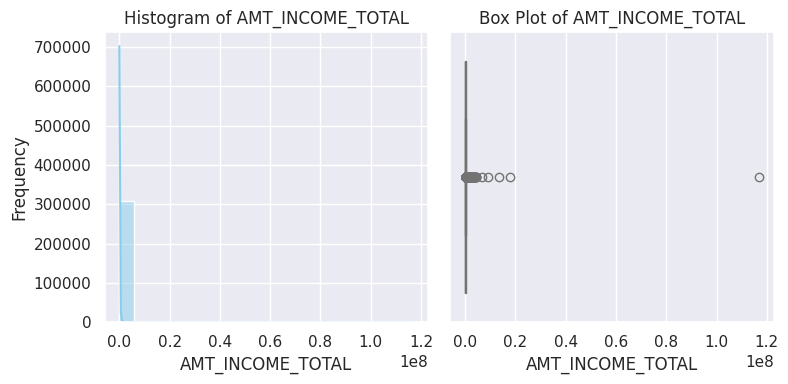

In [28]:
plot_hist_box(df_app_data, 'AMT_INCOME_TOTAL', figsize=(8, 4))

In [29]:
df_app_data['AMT_INCOME_TOTAL'].quantile([0.95])

0.95    337500.0
Name: AMT_INCOME_TOTAL, dtype: float64

In [30]:
cap_floor_outliers_by_value(df_app_data, 'AMT_INCOME_TOTAL', lower_limit=None, upper_limit=350000)

0         202500.0
1         270000.0
2          67500.0
3         135000.0
4         121500.0
            ...   
307506    157500.0
307507     72000.0
307508    153000.0
307509    171000.0
307510    157500.0
Name: AMT_INCOME_TOTAL, Length: 307511, dtype: float64

In [31]:
df_app_data['INCOME_GROUP']=equal_distribution_binning(df_app_data['AMT_INCOME_TOTAL'], 7,
                                                       labels=['Very Low', 'Low', 'Medium-Low', 'Medium', 'Medium-High', 'High', 'Very High'])

Very Low: Below 71985.71428571429
Low: 71985.71428571429 - 118321.42857142857
Medium-Low: 118321.42857142857 - 164657.14285714287
Medium: 164657.14285714287 - 210992.85714285713
Medium-High: 210992.85714285713 - 257328.57142857142
High: 257328.57142857142 - 303664.28571428574
Very High: 303664.28571428574 and above
Medium-Low     81745
Low            81709
Medium         51795
Medium-High    32027
Very High      22527
Very Low       21502
High           16206
Name: AMT_INCOME_TOTAL, dtype: int64


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> AMT_CREDIT</span>

In [32]:
print('Null Count:',df_app_data['AMT_CREDIT'].isnull().sum())
print_quartiles_min_max(df_app_data, column='AMT_CREDIT')

Null Count: 0
Minimum value: 45000.0
10th percentile: 180000.0
25th percentile (Q1): 270000.0
50th percentile (Median - Q2): 513531.0
75th percentile (Q3): 808650.0
90th percentile: 1133748.0
Maximum value: 4050000.0


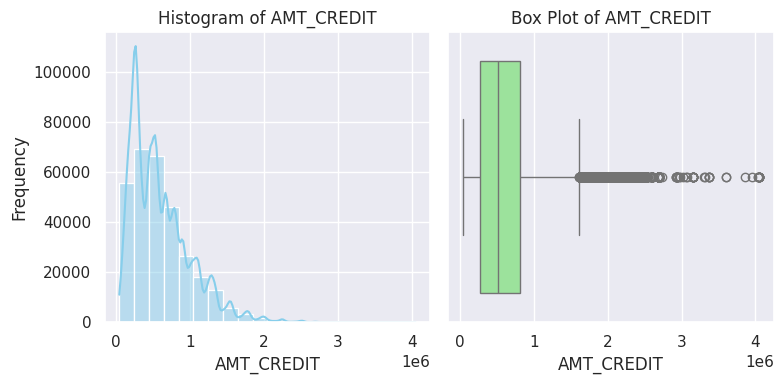

In [33]:
plot_hist_box(df_app_data, 'AMT_CREDIT', figsize=(8, 4))

In [34]:
print(df_app_data['AMT_CREDIT'].quantile([0.05]))
df_app_data['AMT_CREDIT'].quantile([.99])

0.05    135000.0
Name: AMT_CREDIT, dtype: float64


0.99    1854000.0
Name: AMT_CREDIT, dtype: float64

In [35]:
cap_floor_outliers_by_value(df_app_data, 'AMT_CREDIT', lower_limit=100000, upper_limit=2500000)

0          406597.5
1         1293502.5
2          135000.0
3          312682.5
4          513000.0
            ...    
307506     254700.0
307507     269550.0
307508     677664.0
307509     370107.0
307510     675000.0
Name: AMT_CREDIT, Length: 307511, dtype: float64

In [36]:
df_app_data['AMT_CREDIT_GROUP']=frequency_distribution_binning(df_app_data['AMT_CREDIT'], 10,
                                                       labels=None)

Bin 1: Below 180000.0
Bin 2: 180000.0 - 254700.0
Bin 3: 254700.0 - 306306.0
Bin 4: 306306.0 - 432000.0
Bin 5: 432000.0 - 513531.0
Bin 6: 513531.0 - 604152.0
Bin 7: 604152.0 - 755190.0
Bin 8: 755190.0 - 900000.0
Bin 9: 900000.0 - 1133748.0
Bin 10: 1133748.0 and above
(604152.0, 755190.0]      34066
(99999.999, 180000.0]     33204
(180000.0, 254700.0]      31721
(432000.0, 513531.0]      30826
(513531.0, 604152.0]      30726
(306306.0, 432000.0]      30707
(1133748.0, 2500000.0]    30593
(755190.0, 900000.0]      29958
(900000.0, 1133748.0]     28319
(254700.0, 306306.0]      27391
Name: AMT_CREDIT, dtype: int64


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> AMT_ANNUITY</span>

In [37]:
print('Null Count:',df_app_data['AMT_ANNUITY'].isnull().sum())
print_quartiles_min_max(df_app_data, column='AMT_ANNUITY')

Null Count: 12
Minimum value: 1615.5
10th percentile: 11074.5
25th percentile (Q1): 16524.0
50th percentile (Median - Q2): 24903.0
75th percentile (Q3): 34596.0
90th percentile: 45954.0
Maximum value: 258025.5


In [38]:
df_app_data['AMT_ANNUITY'].fillna(df_app_data['AMT_CREDIT'] / 12, inplace=True)

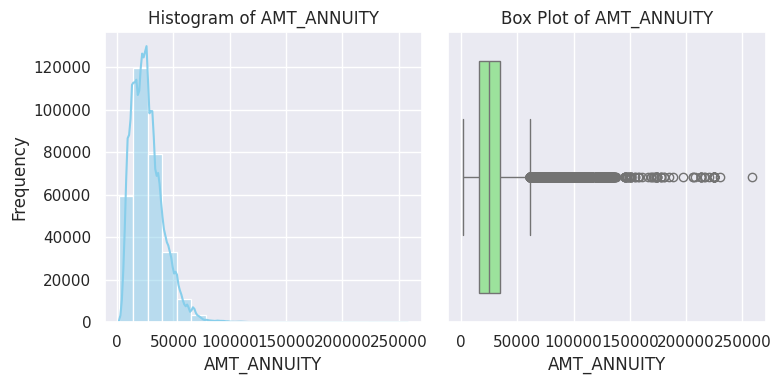

In [39]:
plot_hist_box(df_app_data, 'AMT_ANNUITY', figsize=(8, 4))

In [40]:
print(df_app_data['AMT_ANNUITY'].quantile([0.05]))
df_app_data['AMT_ANNUITY'].quantile([.99])

0.05    9000.0
Name: AMT_ANNUITY, dtype: float64


0.99    70006.5
Name: AMT_ANNUITY, dtype: float64

In [41]:
cap_floor_outliers_by_value(df_app_data, 'AMT_ANNUITY', lower_limit=None, upper_limit=70000)

0         24700.5
1         35698.5
2          6750.0
3         29686.5
4         21865.5
           ...   
307506    27558.0
307507    12001.5
307508    29979.0
307509    20205.0
307510    49117.5
Name: AMT_ANNUITY, Length: 307511, dtype: float64

In [42]:
df_app_data['AMT_ANNUITY_GROUP']=equal_distribution_binning(df_app_data['AMT_ANNUITY'], 7,
                                                       labels=['Very Low', 'Low', 'Medium-Low', 'Medium', 'Medium-High', 'High', 'Very High'])

Very Low: Below 11384.714285714286
Low: 11384.714285714286 - 21153.928571428572
Medium-Low: 21153.928571428572 - 30923.14285714286
Medium: 30923.14285714286 - 40692.357142857145
Medium-High: 40692.357142857145 - 50461.57142857143
High: 50461.57142857143 - 60230.78571428572
Very High: 60230.78571428572 and above
Medium-Low     89513
Low            83044
Medium         54878
Very Low       33548
Medium-High    26014
High           12558
Very High       7956
Name: AMT_ANNUITY, dtype: int64


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> AMT_GOODS_PRICE</span>

In [43]:
print('Null Count:',df_app_data['AMT_GOODS_PRICE'].isnull().sum())
print_quartiles_min_max(df_app_data, column='AMT_GOODS_PRICE')

Null Count: 278
Minimum value: 40500.0
10th percentile: 180000.0
25th percentile (Q1): 238500.0
50th percentile (Median - Q2): 450000.0
75th percentile (Q3): 679500.0
90th percentile: 1093500.0
Maximum value: 4050000.0


In [44]:
df_app_data['AMT_GOODS_PRICE'].fillna(df_app_data['AMT_CREDIT'], inplace=True)

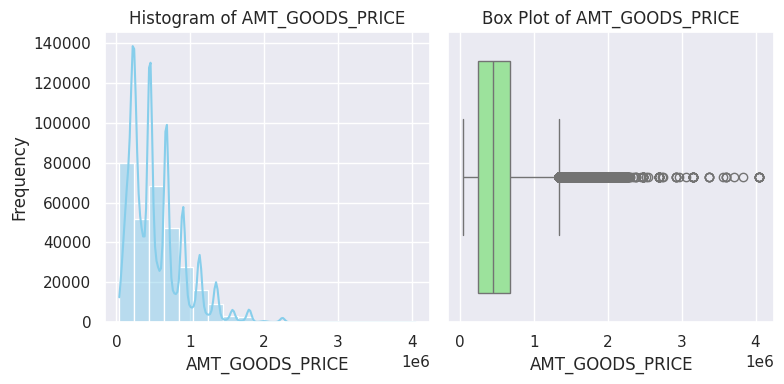

In [45]:
plot_hist_box(df_app_data, 'AMT_GOODS_PRICE', figsize=(8, 4))

In [46]:
print(df_app_data['AMT_GOODS_PRICE'].quantile([0.05]))
df_app_data['AMT_GOODS_PRICE'].quantile([.95])

0.05    135000.0
Name: AMT_GOODS_PRICE, dtype: float64


0.95    1305000.0
Name: AMT_GOODS_PRICE, dtype: float64

In [47]:
cap_floor_outliers_by_value(df_app_data, 'AMT_GOODS_PRICE', lower_limit=None, upper_limit=1500000)

0          351000.0
1         1129500.0
2          135000.0
3          297000.0
4          513000.0
            ...    
307506     225000.0
307507     225000.0
307508     585000.0
307509     319500.0
307510     675000.0
Name: AMT_GOODS_PRICE, Length: 307511, dtype: float64

In [48]:
df_app_data['AMT_GOODS_PRICE_GROUP']=frequency_distribution_binning(df_app_data['AMT_GOODS_PRICE'], 10,
                                                       labels=None)

Bin 1: Below 180000.0
Bin 2: 180000.0 - 225000.0
Bin 3: 225000.0 - 270000.0
Bin 4: 270000.0 - 373500.0
Bin 5: 373500.0 - 450000.0
Bin 6: 450000.0 - 522000.0
Bin 7: 522000.0 - 675000.0
Bin 8: 675000.0 - 814500.0
Bin 9: 814500.0 - 1093500.0
Bin 10: 1093500.0 and above
(522000.0, 675000.0]      42429
(40499.999, 180000.0]     39586
(373500.0, 450000.0]      35072
(180000.0, 225000.0]      32017
(814500.0, 1093500.0]     30748
(1093500.0, 1500000.0]    30689
(225000.0, 270000.0]      28053
(450000.0, 522000.0]      26477
(270000.0, 373500.0]      23505
(675000.0, 814500.0]      18935
Name: AMT_GOODS_PRICE, dtype: int64


In [49]:
#After Binning Drop Numeric Columns
df_app_data.drop(columns=['AMT_GOODS_PRICE','AMT_ANNUITY','AMT_CREDIT','AMT_INCOME_TOTAL'],inplace=True)

<div style="border-radius:10px;border:#254E58 solid;padding: 15px;background-color:white;font-size:110%;text-align:left">

- The Finacial Details column are pre-processed


## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:0;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 20px;border-style: solid;border-color: dark green;"> Work Details</div>

### Work Details:
1. **DAYS_EMPLOYED**: Number of days before application the person started current employment
2. **NAME_INCOME_TYPE**: Income type of applicant
3. **NAME_EDUCATION_TYPE**: Education level of applicant
4. **OCCUPATION_TYPE**: Occupation of applicant
5. **ORGANIZATION_TYPE**: Type of organization where applicant works

## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> DAYS_EMPLOYED</span>

In [50]:
print('Null Count:',df_app_data['DAYS_EMPLOYED'].isnull().sum())
print_quartiles_min_max(df_app_data, column='DAYS_EMPLOYED')

Null Count: 0
Minimum value: -17912
10th percentile: -4881.0
25th percentile (Q1): -2760.0
50th percentile (Median - Q2): -1213.0
75th percentile (Q3): -289.0
90th percentile: 365243.0
Maximum value: 365243


In [51]:
count_max_value = (df_app_data['DAYS_EMPLOYED'] == 365243).sum()
print('Count of values with 365243:', count_max_value)

Count of values with 365243: 55374


In [52]:
count_value_0= (df_app_data['DAYS_EMPLOYED'] ==  0).sum()
print('Count of values with 0:', count_max_value)

Count of values with 0: 55374


In [53]:
#df_app_data['DAYS_EMPLOYED'].fillna(0, inplace=True)

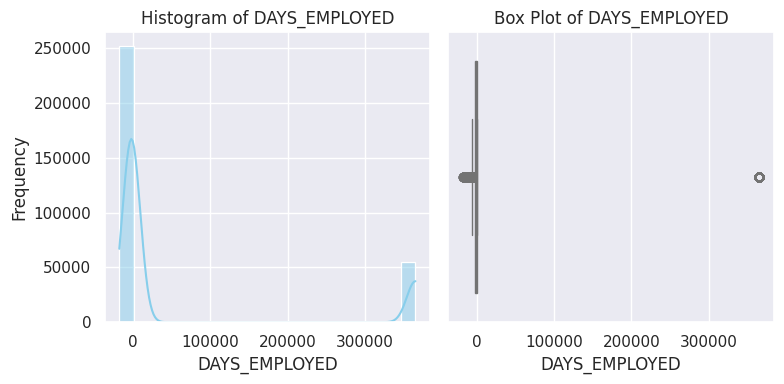

In [54]:
plot_hist_box(df_app_data, 'DAYS_EMPLOYED', figsize=(8, 4))

In [55]:
print(df_app_data['DAYS_EMPLOYED'].quantile([0.05]))
df_app_data['DAYS_EMPLOYED'].quantile([.819])

0.05   -6742.5
Name: DAYS_EMPLOYED, dtype: float64


0.819   -57.31
Name: DAYS_EMPLOYED, dtype: float64

In [56]:
cap_floor_outliers_by_value(df_app_data, 'DAYS_EMPLOYED', lower_limit=None, upper_limit=0)

0         -637
1        -1188
2         -225
3        -3039
4        -3038
          ... 
307506    -236
307507       0
307508   -7921
307509   -4786
307510   -1262
Name: DAYS_EMPLOYED, Length: 307511, dtype: int64

In [57]:
df_app_data['YEARS_EMPLOYED'] = (df_app_data['DAYS_EMPLOYED'] / -365).astype(int)

In [58]:
print('Null Count:',df_app_data['YEARS_EMPLOYED'].isnull().sum())
print_quartiles_min_max(df_app_data, column='YEARS_EMPLOYED')

Null Count: 0
Minimum value: 0
10th percentile: 0.0
25th percentile (Q1): 0.0
50th percentile (Median - Q2): 3.0
75th percentile (Q3): 7.0
90th percentile: 13.0
Maximum value: 49


In [59]:
df_app_data['YEARS_EMPLOYED_GROUP']=frequency_distribution_binning(df_app_data['YEARS_EMPLOYED'], 6,
                                                                   ['<1', '1-5', '5-10', '10-20', '20-30', '30+'],
                                                       [-np.inf, 1, 5, 10, 20, 30, np.inf])

<1: Below 1
1-5: 1 - 5
5-10: 5 - 10
10-20: 10 - 20
20-30: 20 - 30
30+: 30 and above
<1       115119
1-5       92793
5-10      55983
10-20     32658
20-30      8409
30+        2549
Name: YEARS_EMPLOYED, dtype: int64


In [60]:
df_app_data.drop(columns=['YEARS_EMPLOYED','DAYS_EMPLOYED'],inplace=True)

## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> NAME_INCOME_TYPE</span>

In [61]:
print('Null Count:',df_app_data['NAME_INCOME_TYPE'].isnull().sum())

Null Count: 0


In [62]:
df_app_data['NAME_INCOME_TYPE'].value_counts()

Working                 158774
Commercial associate     71617
Pensioner                55362
State servant            21703
Unemployed                  22
Student                     18
Businessman                 10
Maternity leave              5
Name: NAME_INCOME_TYPE, dtype: int64

## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> NAME_EDUCATION_TYPE</span>

In [63]:
print('Null Count:',df_app_data['NAME_EDUCATION_TYPE'].isnull().sum())

Null Count: 0


In [64]:
df_app_data['NAME_EDUCATION_TYPE'].value_counts()

Secondary / secondary special    218391
Higher education                  74863
Incomplete higher                 10277
Lower secondary                    3816
Academic degree                     164
Name: NAME_EDUCATION_TYPE, dtype: int64

## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> OCCUPATION_TYPE</span>

In [65]:
print('Null Count:',df_app_data['OCCUPATION_TYPE'].isnull().sum())

Null Count: 96391


In [66]:
df_app_data['OCCUPATION_TYPE'].fillna('Others', inplace=True)

In [67]:
df_app_data['OCCUPATION_TYPE'].value_counts()

Others                   96391
Laborers                 55186
Sales staff              32102
Core staff               27570
Managers                 21371
Drivers                  18603
High skill tech staff    11380
Accountants               9813
Medicine staff            8537
Security staff            6721
Cooking staff             5946
Cleaning staff            4653
Private service staff     2652
Low-skill Laborers        2093
Waiters/barmen staff      1348
Secretaries               1305
Realty agents              751
HR staff                   563
IT staff                   526
Name: OCCUPATION_TYPE, dtype: int64

## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> ORGANIZATION_TYPE</span>

In [68]:
print('Null Count:',df_app_data['ORGANIZATION_TYPE'].isnull().sum())

Null Count: 0


In [69]:
df_app_data['ORGANIZATION_TYPE'].value_counts()

Business Entity Type 3    67992
XNA                       55374
Self-employed             38412
Other                     16683
Medicine                  11193
Business Entity Type 2    10553
Government                10404
School                     8893
Trade: type 7              7831
Kindergarten               6880
Construction               6721
Business Entity Type 1     5984
Transport: type 4          5398
Trade: type 3              3492
Industry: type 9           3368
Industry: type 3           3278
Security                   3247
Housing                    2958
Industry: type 11          2704
Military                   2634
Bank                       2507
Agriculture                2454
Police                     2341
Transport: type 2          2204
Postal                     2157
Security Ministries        1974
Trade: type 2              1900
Restaurant                 1811
Services                   1575
University                 1327
Industry: type 7           1307
Transpor

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:0;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 20px;border-style: solid;border-color: dark green;"> Contract Details</div>

### Contract Details:
1. **NAME_CONTRACT_TYPE**: Type of loan contract
2. **NAME_TYPE_SUITE**: Flag indicating if the current application is the last application per contract

## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> NAME_CONTRACT_TYPE</span>

In [70]:
print('Null Count:',df_app_data['NAME_CONTRACT_TYPE'].isnull().sum())

Null Count: 0


In [71]:
#df_app_data['NAME_CONTRACT_TYPE'].fillna('Others', inplace=True)

In [72]:
df_app_data['NAME_CONTRACT_TYPE'].value_counts()

Cash loans         278232
Revolving loans     29279
Name: NAME_CONTRACT_TYPE, dtype: int64

## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> NAME_TYPE_SUITE</span>

In [73]:
print('Null Count:',df_app_data['NAME_TYPE_SUITE'].isnull().sum())

Null Count: 1292


In [74]:
df_app_data['NAME_TYPE_SUITE'].fillna('Others', inplace=True)

In [75]:
df_app_data['NAME_TYPE_SUITE'].value_counts()

Unaccompanied      248526
Family              40149
Spouse, partner     11370
Children             3267
Other_B              1770
Others               1292
Other_A               866
Group of people       271
Name: NAME_TYPE_SUITE, dtype: int64

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:0;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 20px;border-style: solid;border-color: dark green;"> Personal Information</div>

### Personal Information:
1. **CODE_GENDER**: Gender of applicant
2. **FLAG_OWN_CAR**: Flag indicating if applicant owns a car
3. **FLAG_OWN_REALTY**: Flag indicating if applicant owns realty
4. **CNT_CHILDREN**: Number of children the applicant has
5. **CNT_FAM_MEMBERS**: Number of family members
6. **NAME_FAMILY_STATUS**: Family status of applicant
7. **NAME_HOUSING_TYPE**: Housing type of applicant
8. **DAYS_BIRTH**: Days birth of applicant

## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> CODE_GENDER</span>

In [76]:
print('Null Count:',df_app_data['CODE_GENDER'].isnull().sum())

Null Count: 0


In [77]:
df_app_data['CODE_GENDER'].value_counts()

F      202448
M      105059
XNA         4
Name: CODE_GENDER, dtype: int64

## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> CNT_CHILDREN</span>

In [78]:
print('Null Count:',df_app_data['CNT_CHILDREN'].isnull().sum())

Null Count: 0


In [79]:
print_quartiles_min_max(df_app_data, column='CNT_CHILDREN')

Minimum value: 0
10th percentile: 0.0
25th percentile (Q1): 0.0
50th percentile (Median - Q2): 0.0
75th percentile (Q3): 1.0
90th percentile: 2.0
Maximum value: 19


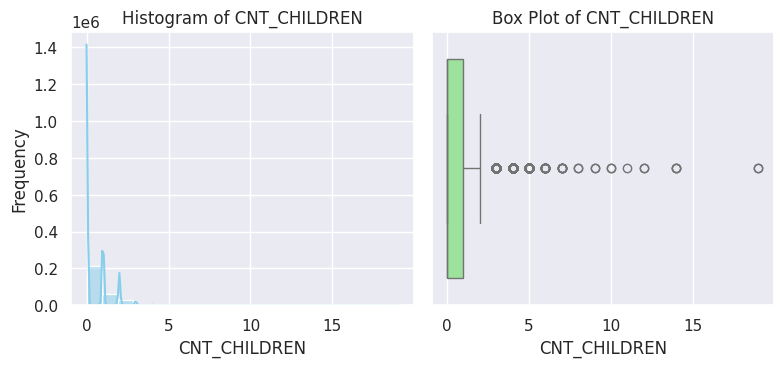

In [80]:
plot_hist_box(df_app_data, 'CNT_CHILDREN', figsize=(8, 4))

In [81]:
cap_floor_outliers_by_value(df_app_data, 'CNT_CHILDREN', lower_limit=None, upper_limit=5)

0         0
1         0
2         0
3         0
4         0
         ..
307506    0
307507    0
307508    0
307509    0
307510    0
Name: CNT_CHILDREN, Length: 307511, dtype: int64

In [82]:
df_app_data['CNT_CHILDREN_GROUP']=equal_distribution_binning(df_app_data['CNT_CHILDREN'], 5,None)

Bin 1: Below 1.0
Bin 2: 1.0 - 2.0
Bin 3: 2.0 - 3.0
Bin 4: 3.0 - 4.0
Bin 5: 4.0 and above
(-0.001, 1.0]    276490
(1.0, 2.0]        26749
(2.0, 3.0]         3717
(3.0, 4.0]          429
(4.0, 5.0]          126
Name: CNT_CHILDREN, dtype: int64


In [83]:
df_app_data.drop(columns=['CNT_CHILDREN'],inplace=True)

## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> FLAG_OWN_CAR</span>

In [84]:
print('Null Count:',df_app_data['FLAG_OWN_CAR'].isnull().sum())

Null Count: 0


In [85]:
df_app_data['FLAG_OWN_CAR'].value_counts()

N    202924
Y    104587
Name: FLAG_OWN_CAR, dtype: int64

## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> FLAG_OWN_REALTY</span>

In [86]:
print('Null Count:',df_app_data['FLAG_OWN_REALTY'].isnull().sum())

Null Count: 0


In [87]:
df_app_data['FLAG_OWN_REALTY'].value_counts()

Y    213312
N     94199
Name: FLAG_OWN_REALTY, dtype: int64

## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> CNT_FAM_MEMBERS</span>

In [88]:
print('Null Count:',df_app_data['CNT_FAM_MEMBERS'].isnull().sum())

Null Count: 2


In [89]:
df_app_data['CNT_FAM_MEMBERS'].fillna(1,inplace=True)

In [90]:
df_app_data['CNT_FAM_MEMBERS_GROUP']=frequency_distribution_binning(df_app_data['CNT_FAM_MEMBERS'], 5,None)

Bin 1: Below 2.0
Bin 2: 2.0 - 3.0
Bin 3: 3.0 and above
(0.999, 2.0]    226206
(2.0, 3.0]       52601
(3.0, 20.0]      28704
Name: CNT_FAM_MEMBERS, dtype: int64


In [91]:
#Define the mapping of bin labels
mapping = {
    "(0.999, 2.0]": "Below 2.0",
    "(2.0, 3.0]": "2.0 - 3.0",
    "(3.0, 20.0]": "3.0 and above"
}

# Replace values in the DataFrame column
df_app_data['CNT_FAM_MEMBERS_GROUP'] = df_app_data['CNT_FAM_MEMBERS_GROUP'].replace(mapping)

In [92]:
df_app_data.drop(columns=['CNT_FAM_MEMBERS'],inplace=True)

## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> NAME_FAMILY_STATUS</span>

In [93]:
print('Null Count:',df_app_data['NAME_FAMILY_STATUS'].isnull().sum())

Null Count: 0


In [94]:
df_app_data['NAME_FAMILY_STATUS'].value_counts()

Married                 196432
Single / not married     45444
Civil marriage           29775
Separated                19770
Widow                    16088
Unknown                      2
Name: NAME_FAMILY_STATUS, dtype: int64

## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> NAME_HOUSING_TYPE</span>

In [95]:
print('Null Count:',df_app_data['NAME_HOUSING_TYPE'].isnull().sum())

Null Count: 0


In [96]:
df_app_data['NAME_HOUSING_TYPE'].value_counts()

House / apartment      272868
With parents            14840
Municipal apartment     11183
Rented apartment         4881
Office apartment         2617
Co-op apartment          1122
Name: NAME_HOUSING_TYPE, dtype: int64

## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> AGE</span>

In [97]:
print('Null Count:',df_app_data['DAYS_BIRTH'].isnull().sum())

Null Count: 0


In [98]:
print_quartiles_min_max(df_app_data, column='DAYS_BIRTH')

Minimum value: -25229
10th percentile: -22181.0
25th percentile (Q1): -19682.0
50th percentile (Median - Q2): -15750.0
75th percentile (Q3): -12413.0
90th percentile: -10284.0
Maximum value: -7489


In [99]:
df_app_data['AGE'] = df_app_data['DAYS_BIRTH'] // 365
df_app_data['AGE']=abs(df_app_data['AGE'])

In [100]:
print_quartiles_min_max(df_app_data, column='AGE')

Minimum value: 21
10th percentile: 29.0
25th percentile (Q1): 35.0
50th percentile (Median - Q2): 44.0
75th percentile (Q3): 54.0
90th percentile: 61.0
Maximum value: 70


In [101]:
df_app_data['AGE_GROUP']=equal_distribution_binning(df_app_data['AGE'], 5,None,None)

Bin 1: Below 30.8
Bin 2: 30.8 - 40.6
Bin 3: 40.6 - 50.4
Bin 4: 50.4 - 60.2
Bin 5: 60.2 and above
(30.8, 40.6]      82308
(40.6, 50.4]      76541
(50.4, 60.2]      68062
(20.999, 30.8]    45021
(60.2, 70.0]      35579
Name: AGE, dtype: int64


## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:0;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 20px;border-style: solid;border-color: dark green;"> Residence Details</div>

### Residence Details:
1. **REGION_POPULATION_RELATIVE**: Normalized population of region where client lives
2. **REGION_RATING_CLIENT**: Rating of the region where the client lives
3. **REGION_RATING_CLIENT_W_CITY**: Rating of the region with city included
4. **REG_REGION_NOT_LIVE_REGION**: Flag indicating if client's permanent address does not match contact address
5. **REG_REGION_NOT_WORK_REGION**: Flag indicating if client's permanent address does not match work address
6. **LIVE_REGION_NOT_WORK_REGION**: Flag indicating if client's contact address does not match work address
7. **REG_CITY_NOT_LIVE_CITY**: Flag indicating if client's permanent city does not match contact city
8. **REG_CITY_NOT_WORK_CITY**: Flag indicating if client's permanent city does not match work city
9. **LIVE_CITY_NOT_WORK_CITY**: Flag indicating if client's contact city does not match work city

## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> REGION_POPULATION_RELATIVE</span>

In [102]:
print('Null Count:',df_app_data['REGION_POPULATION_RELATIVE'].isnull().sum())

Null Count: 0


In [103]:
print_quartiles_min_max(df_app_data, column='REGION_POPULATION_RELATIVE')

Minimum value: 0.00029
10th percentile: 0.006629
25th percentile (Q1): 0.010006
50th percentile (Median - Q2): 0.01885
75th percentile (Q3): 0.028663
90th percentile: 0.035792
Maximum value: 0.072508


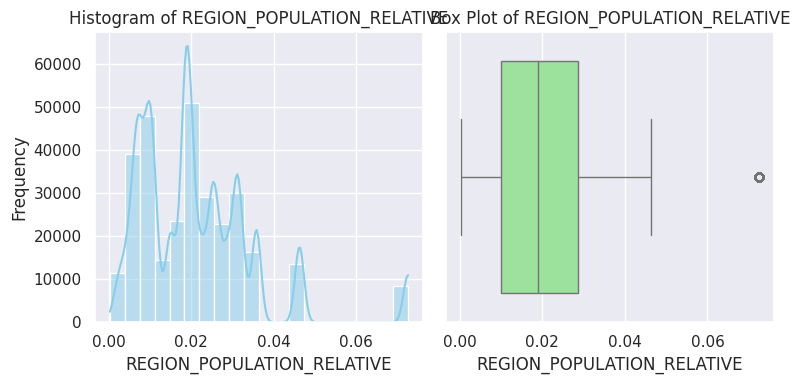

In [104]:
plot_hist_box(df_app_data, 'REGION_POPULATION_RELATIVE', figsize=(8, 4))

In [105]:
cap_floor_outliers_by_value(df_app_data, 'REGION_POPULATION_RELATIVE', lower_limit=None, upper_limit=0.05)

0         0.018801
1         0.003541
2         0.010032
3         0.008019
4         0.028663
            ...   
307506    0.032561
307507    0.025164
307508    0.005002
307509    0.005313
307510    0.046220
Name: REGION_POPULATION_RELATIVE, Length: 307511, dtype: float64

In [106]:
df_app_data['REGION_POPULATION_RELATIVE_GROUP']=frequency_distribution_binning(df_app_data['REGION_POPULATION_RELATIVE'], 5,
                                                                               ['Very Low', 'Low', 'Medium', 'High', 'Very High'],None)

Very Low: Below 0.0088659999999999
Low: 0.0088659999999999 - 0.016612
Medium: 0.016612 - 0.020713
High: 0.020713 - 0.030755
Very High: 0.030755 and above
High         64025
Very Low     63155
Medium       63143
Low          60969
Very High    56219
Name: REGION_POPULATION_RELATIVE, dtype: int64


In [107]:
df_app_data.drop(columns=['REGION_POPULATION_RELATIVE'],inplace=True)

In [108]:
df_app_data['REGION_POPULATION_RELATIVE_GROUP'].value_counts()

High         64025
Very Low     63155
Medium       63143
Low          60969
Very High    56219
Name: REGION_POPULATION_RELATIVE_GROUP, dtype: int64

## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> REGION_RATING_CLIENT</span>

In [109]:
print('Null Count:',df_app_data['REGION_RATING_CLIENT'].isnull().sum())

Null Count: 0


In [110]:
print_quartiles_min_max(df_app_data, column='REGION_RATING_CLIENT')

Minimum value: 1
10th percentile: 1.0
25th percentile (Q1): 2.0
50th percentile (Median - Q2): 2.0
75th percentile (Q3): 2.0
90th percentile: 3.0
Maximum value: 3


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> REGION_RATING_CLIENT_W_CITY</span>

In [111]:
print('Null Count:',df_app_data['REGION_RATING_CLIENT_W_CITY'].isnull().sum())

Null Count: 0


In [112]:
print_quartiles_min_max(df_app_data, column='REGION_RATING_CLIENT_W_CITY')

Minimum value: 1
10th percentile: 1.0
25th percentile (Q1): 2.0
50th percentile (Median - Q2): 2.0
75th percentile (Q3): 2.0
90th percentile: 3.0
Maximum value: 3


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> REG_REGION_NOT_LIVE_REGION</span>

In [113]:
print('Null Count:',df_app_data['REG_REGION_NOT_LIVE_REGION'].isnull().sum())

Null Count: 0


In [114]:
print(df_app_data['REG_REGION_NOT_LIVE_REGION'].value_counts())

0    302854
1      4657
Name: REG_REGION_NOT_LIVE_REGION, dtype: int64


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> REG_REGION_NOT_WORK_REGION</span>

In [115]:
print('Null Count:',df_app_data['REG_REGION_NOT_WORK_REGION'].isnull().sum())

Null Count: 0


In [116]:
print(df_app_data['REG_REGION_NOT_WORK_REGION'].value_counts())

0    291899
1     15612
Name: REG_REGION_NOT_WORK_REGION, dtype: int64


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> LIVE_REGION_NOT_WORK_REGION</span>

In [117]:
print('Null Count:',df_app_data['LIVE_REGION_NOT_WORK_REGION'].isnull().sum())

Null Count: 0


In [118]:
print(df_app_data['LIVE_REGION_NOT_WORK_REGION'].value_counts())

0    295008
1     12503
Name: LIVE_REGION_NOT_WORK_REGION, dtype: int64


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> REG_CITY_NOT_LIVE_CITY</span>

In [119]:
print('Null Count:',df_app_data['REG_CITY_NOT_LIVE_CITY'].isnull().sum())

Null Count: 0


In [120]:
print(df_app_data['REG_CITY_NOT_LIVE_CITY'].value_counts())

0    283472
1     24039
Name: REG_CITY_NOT_LIVE_CITY, dtype: int64


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> REG_CITY_NOT_WORK_CITY</span>

In [121]:
print('Null Count:',df_app_data['REG_CITY_NOT_WORK_CITY'].isnull().sum())

Null Count: 0


In [122]:
print(df_app_data['REG_CITY_NOT_WORK_CITY'].value_counts())

0    236644
1     70867
Name: REG_CITY_NOT_WORK_CITY, dtype: int64


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> LIVE_CITY_NOT_WORK_CITY</span>

In [123]:
print('Null Count:',df_app_data['LIVE_CITY_NOT_WORK_CITY'].isnull().sum())

Null Count: 0


In [124]:
print(df_app_data['LIVE_CITY_NOT_WORK_CITY'].value_counts())

0    252296
1     55215
Name: LIVE_CITY_NOT_WORK_CITY, dtype: int64


## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:0;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 20px;border-style: solid;border-color: dark green;"> Communication Details</div>

### Communication Details:
1. **FLAG_MOBIL**: Flag indicating if client provided a mobile phone
2. **FLAG_EMP_PHONE**: Flag indicating if client provided a work phone
3. **FLAG_WORK_PHONE**: Flag indicating if client provided a mobile phone for work
4. **FLAG_CONT_MOBILE**: Flag indicating if client provided a mobile phone contact
5. **FLAG_PHONE**: Flag indicating if client provided a home phone
6. **FLAG_EMAIL**: Flag indicating if client provided an email add

## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> FLAG_MOBIL</span>

In [125]:
print('Null Count:',df_app_data['FLAG_MOBIL'].isnull().sum())

Null Count: 0


In [126]:
print(df_app_data['FLAG_MOBIL'].value_counts())

1    307510
0         1
Name: FLAG_MOBIL, dtype: int64


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> FLAG_EMP_PHONE</span>

In [127]:
print('Null Count:',df_app_data['FLAG_EMP_PHONE'].isnull().sum())

Null Count: 0


In [128]:
print(df_app_data['FLAG_EMP_PHONE'].value_counts())

1    252125
0     55386
Name: FLAG_EMP_PHONE, dtype: int64


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> FLAG_WORK_PHONE</span>

In [129]:
print('Null Count:',df_app_data['FLAG_WORK_PHONE'].isnull().sum())

Null Count: 0


In [130]:
print(df_app_data['FLAG_WORK_PHONE'].value_counts())

0    246203
1     61308
Name: FLAG_WORK_PHONE, dtype: int64


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> FLAG_CONT_MOBILE</span>

In [131]:
print('Null Count:',df_app_data['FLAG_CONT_MOBILE'].isnull().sum())

Null Count: 0


In [132]:
print(df_app_data['FLAG_CONT_MOBILE'].value_counts())

1    306937
0       574
Name: FLAG_CONT_MOBILE, dtype: int64


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> FLAG_PHONE</span>

In [133]:
print('Null Count:',df_app_data['FLAG_PHONE'].isnull().sum())

Null Count: 0


In [134]:
print(df_app_data['FLAG_PHONE'].value_counts())

0    221080
1     86431
Name: FLAG_PHONE, dtype: int64


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> FLAG_EMAIL</span>

In [135]:
print('Null Count:',df_app_data['FLAG_EMAIL'].isnull().sum())

Null Count: 0


In [136]:
print(df_app_data['FLAG_EMAIL'].value_counts())

0    290069
1     17442
Name: FLAG_EMAIL, dtype: int64


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> DAYS_LAST_PHONE_CHANGE </span>

In [137]:
df_app_data['DAYS_LAST_PHONE_CHANGE'] = df_app_data['DAYS_LAST_PHONE_CHANGE'].fillna(0)

In [138]:
print_quartiles_min_max(df_app_data, column='DAYS_LAST_PHONE_CHANGE')

Minimum value: -4292.0
10th percentile: -2158.0
25th percentile (Q1): -1570.0
50th percentile (Median - Q2): -757.0
75th percentile (Q3): -274.0
90th percentile: 0.0
Maximum value: 0.0


In [139]:
df_app_data['DAYS_LAST_PHONE_CHANGE'] =abs(df_app_data['DAYS_LAST_PHONE_CHANGE'] )

In [140]:
df_app_data['DAYS_LAST_PHONE_CHANGE_GROUP']=frequency_distribution_binning(df_app_data['DAYS_LAST_PHONE_CHANGE'], 5,None,None)

Bin 1: Below 161.0
Bin 2: 161.0 - 546.0
Bin 3: 546.0 - 1060.0
Bin 4: 1060.0 - 1720.0
Bin 5: 1720.0 and above
(546.0, 1060.0]     61570
(-0.001, 161.0]     61548
(161.0, 546.0]      61474
(1060.0, 1720.0]    61473
(1720.0, 4292.0]    61446
Name: DAYS_LAST_PHONE_CHANGE, dtype: int64


## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:0;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 20px;border-style: solid;border-color: dark green;"> Document Details</div>

### Document Details:
1. **FLAG_DOCUMENT_2** to **FLAG_DOCUMENT_21**: Flags indicating if client provided various documents

In [141]:
# Selecting the columns FLAG_DOCUMENT_2 to FLAG_DOCUMENT_21
document_columns = ['FLAG_DOCUMENT_' + str(i) for i in range(2, 22)]

# Initializing dictionaries to store null values counts and value counts for each column
null_values_counts = {}
value_counts = {}

# Iterating through each column and calculating null values counts and value counts
for column in document_columns:
    # Calculating null values count for the current column
    null_values_counts[column] = df_app_data[column].isnull().sum()

    # Calculating value counts for the current column
    value_counts[column] = df_app_data[column].value_counts()

# Printing null values counts for each column
print("Null Values Counts:")
for column, count in null_values_counts.items():
    print(f"{column}: {count}")

# Printing value counts for each column
print("\nValue Counts:")
for column, counts in value_counts.items():
    print(f"Column: {column}")
    print(counts)
    print()

Null Values Counts:
FLAG_DOCUMENT_2: 0
FLAG_DOCUMENT_3: 0
FLAG_DOCUMENT_4: 0
FLAG_DOCUMENT_5: 0
FLAG_DOCUMENT_6: 0
FLAG_DOCUMENT_7: 0
FLAG_DOCUMENT_8: 0
FLAG_DOCUMENT_9: 0
FLAG_DOCUMENT_10: 0
FLAG_DOCUMENT_11: 0
FLAG_DOCUMENT_12: 0
FLAG_DOCUMENT_13: 0
FLAG_DOCUMENT_14: 0
FLAG_DOCUMENT_15: 0
FLAG_DOCUMENT_16: 0
FLAG_DOCUMENT_17: 0
FLAG_DOCUMENT_18: 0
FLAG_DOCUMENT_19: 0
FLAG_DOCUMENT_20: 0
FLAG_DOCUMENT_21: 0

Value Counts:
Column: FLAG_DOCUMENT_2
0    307498
1        13
Name: FLAG_DOCUMENT_2, dtype: int64

Column: FLAG_DOCUMENT_3
1    218340
0     89171
Name: FLAG_DOCUMENT_3, dtype: int64

Column: FLAG_DOCUMENT_4
0    307486
1        25
Name: FLAG_DOCUMENT_4, dtype: int64

Column: FLAG_DOCUMENT_5
0    302863
1      4648
Name: FLAG_DOCUMENT_5, dtype: int64

Column: FLAG_DOCUMENT_6
0    280433
1     27078
Name: FLAG_DOCUMENT_6, dtype: int64

Column: FLAG_DOCUMENT_7
0    307452
1        59
Name: FLAG_DOCUMENT_7, dtype: int64

Column: FLAG_DOCUMENT_8
0    282487
1     25024
Name: FLAG_DOCU

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:0;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 20px;border-style: solid;border-color: dark green;"> Credit Bureau Requests</div>

### Credit Bureau Requests:
1. **AMT_REQ_CREDIT_BUREAU_HOUR**: Number of enquiries to Credit Bureau about client one hour before application
2. **AMT_REQ_CREDIT_BUREAU_DAY**: Number of enquiries to Credit Bureau about client one day before application
3. **AMT_REQ_CREDIT_BUREAU_WEEK**: Number of enquiries to Credit Bureau about client one week before application
4. **AMT_REQ_CREDIT_BUREAU_MON**: Number of enquiries to Credit Bureau about client one month before application
5. **AMT_REQ_CREDIT_BUREAU_QRT**: Number of enquiries to Credit Bureau about client three months before application
6. **AMT_REQ_CREDIT_BUREAU_YEAR**: Number of enquiries to Credit Bureau about client one year before application

In [142]:
Cred_bur_col=['AMT_REQ_CREDIT_BUREAU_HOUR','AMT_REQ_CREDIT_BUREAU_DAY',
  'AMT_REQ_CREDIT_BUREAU_WEEK','AMT_REQ_CREDIT_BUREAU_MON','AMT_REQ_CREDIT_BUREAU_QRT','AMT_REQ_CREDIT_BUREAU_YEAR']

In [143]:
# Initializing dictionaries to store null values counts and value counts for each column
null_values_counts = {}
value_counts = {}

# Iterating through each column and calculating null values counts and value counts
for column in Cred_bur_col:
    # Calculating null values count for the current column
    null_values_counts[column] = df_app_data[column].isnull().sum()

    # Calculating value counts for the current column
    value_counts[column] = df_app_data[column].value_counts()

# Printing null values counts for each column
print("Null Values Counts:")
for column, count in null_values_counts.items():
    print(f"{column}: {count}")

# Printing value counts for each column
print("\nValue Counts:")
for column, counts in value_counts.items():
    print(f"Column: {column}")
    print(counts)
    print()

Null Values Counts:
AMT_REQ_CREDIT_BUREAU_HOUR: 41519
AMT_REQ_CREDIT_BUREAU_DAY: 41519
AMT_REQ_CREDIT_BUREAU_WEEK: 41519
AMT_REQ_CREDIT_BUREAU_MON: 41519
AMT_REQ_CREDIT_BUREAU_QRT: 41519
AMT_REQ_CREDIT_BUREAU_YEAR: 41519

Value Counts:
Column: AMT_REQ_CREDIT_BUREAU_HOUR
0.0    264366
1.0      1560
2.0        56
3.0         9
4.0         1
Name: AMT_REQ_CREDIT_BUREAU_HOUR, dtype: int64

Column: AMT_REQ_CREDIT_BUREAU_DAY
0.0    264503
1.0      1292
2.0       106
3.0        45
4.0        26
5.0         9
6.0         8
9.0         2
8.0         1
Name: AMT_REQ_CREDIT_BUREAU_DAY, dtype: int64

Column: AMT_REQ_CREDIT_BUREAU_WEEK
0.0    257456
1.0      8208
2.0       199
3.0        58
4.0        34
6.0        20
5.0        10
8.0         5
7.0         2
Name: AMT_REQ_CREDIT_BUREAU_WEEK, dtype: int64

Column: AMT_REQ_CREDIT_BUREAU_MON
0.0     222233
1.0      33147
2.0       5386
3.0       1991
4.0       1076
5.0        602
6.0        343
7.0        298
9.0        206
8.0        185
10.0       

In [144]:
for column in Cred_bur_col:
    # Calculating null values count for the current column
    df_app_data[column] = df_app_data[column].fillna(0)

In [145]:
cap_floor_outliers_by_value(df_app_data, 'AMT_REQ_CREDIT_BUREAU_QRT', lower_limit=None, upper_limit=20)

0         0.0
1         0.0
2         0.0
3         0.0
4         0.0
         ... 
307506    0.0
307507    0.0
307508    0.0
307509    0.0
307510    0.0
Name: AMT_REQ_CREDIT_BUREAU_QRT, Length: 307511, dtype: float64

In [146]:
cap_floor_outliers_by_value(df_app_data, 'AMT_REQ_CREDIT_BUREAU_QRT', lower_limit=None, upper_limit=20)

0         0.0
1         0.0
2         0.0
3         0.0
4         0.0
         ... 
307506    0.0
307507    0.0
307508    0.0
307509    0.0
307510    0.0
Name: AMT_REQ_CREDIT_BUREAU_QRT, Length: 307511, dtype: float64

In [147]:
for column in Cred_bur_col:
    FIN_COL=str(column) + '_GROUP'
    df_app_data[FIN_COL]=equal_distribution_binning(df_app_data[column], 5,
                                                   ['Very low/No Enquiry', 'Low Enquiry', 'Medium Enquiry', 'High Enquiry', 'Very High Enquiry'],None)

Very low/No Enquiry: Below 0.8
Low Enquiry: 0.8 - 1.6
Medium Enquiry: 1.6 - 2.4
High Enquiry: 2.4 - 3.2
Very High Enquiry: 3.2 and above
Very low/No Enquiry    305885
Low Enquiry              1560
Medium Enquiry             56
High Enquiry                9
Very High Enquiry           1
Name: AMT_REQ_CREDIT_BUREAU_HOUR, dtype: int64
Very low/No Enquiry: Below 1.8
Low Enquiry: 1.8 - 3.6
Medium Enquiry: 3.6 - 5.4
High Enquiry: 5.4 - 7.2
Very High Enquiry: 7.2 and above
Very low/No Enquiry    307314
Low Enquiry               151
Medium Enquiry             35
High Enquiry                8
Very High Enquiry           3
Name: AMT_REQ_CREDIT_BUREAU_DAY, dtype: int64
Very low/No Enquiry: Below 1.6
Low Enquiry: 1.6 - 3.2
Medium Enquiry: 3.2 - 4.8
High Enquiry: 4.8 - 6.4
Very High Enquiry: 6.4 and above
Very low/No Enquiry    307183
Low Enquiry               257
Medium Enquiry             34
High Enquiry               30
Very High Enquiry           7
Name: AMT_REQ_CREDIT_BUREAU_WEEK, dtype: int64

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:0;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 20px;border-style: solid;border-color: dark green;"> Social Circle Details</div>

### Social Circle:
1. **OBS_30_CNT_SOCIAL_CIRCLE**: Number of observations of client's social surroundings with observable 30 DPD (days past due) default
2. **DEF_30_CNT_SOCIAL_CIRCLE**: Number of observations of client's social surroundings with observable 30 DPD default
3. **OBS_60_CNT_SOCIAL_CIRCLE**: Number of observations of client's social surroundings with observable 60 DPD default
4. **DEF_60_CNT_SOCIAL_CIRCLE**: Number of observations of client's social surroundings with observable 60 DPD default

In [148]:
Social_cir_col=['OBS_30_CNT_SOCIAL_CIRCLE','DEF_30_CNT_SOCIAL_CIRCLE','OBS_60_CNT_SOCIAL_CIRCLE','DEF_60_CNT_SOCIAL_CIRCLE']

In [149]:
# Initializing dictionaries to store null values counts and value counts for each column
null_values_counts = {}
value_counts = {}

# Iterating through each column and calculating null values counts and value counts
for column in Social_cir_col:
    # Calculating null values count for the current column
    null_values_counts[column] = df_app_data[column].isnull().sum()

    # Calculating value counts for the current column
    value_counts[column] = df_app_data[column].value_counts()

# Printing null values counts for each column
print("Null Values Counts:")
for column, count in null_values_counts.items():
    print(f"{column}: {count}")

# Printing value counts for each column
print("\nValue Counts:")
for column, counts in value_counts.items():
    print(f"Column: {column}")
    print(counts)
    print()

Null Values Counts:
OBS_30_CNT_SOCIAL_CIRCLE: 1021
DEF_30_CNT_SOCIAL_CIRCLE: 1021
OBS_60_CNT_SOCIAL_CIRCLE: 1021
DEF_60_CNT_SOCIAL_CIRCLE: 1021

Value Counts:
Column: OBS_30_CNT_SOCIAL_CIRCLE
0.0      163910
1.0       48783
2.0       29808
3.0       20322
4.0       14143
5.0        9553
6.0        6453
7.0        4390
8.0        2967
9.0        2003
10.0       1376
11.0        852
12.0        652
13.0        411
14.0        258
15.0        166
16.0        133
17.0         88
18.0         46
19.0         44
20.0         30
21.0         29
22.0         22
23.0         15
25.0         11
24.0         11
27.0          5
26.0          3
30.0          2
28.0          1
29.0          1
47.0          1
348.0         1
Name: OBS_30_CNT_SOCIAL_CIRCLE, dtype: int64

Column: DEF_30_CNT_SOCIAL_CIRCLE
0.0     271324
1.0      28328
2.0       5323
3.0       1192
4.0        253
5.0         56
6.0         11
7.0          1
34.0         1
8.0          1
Name: DEF_30_CNT_SOCIAL_CIRCLE, dtype: int64

Colum

In [150]:
for column in Social_cir_col:
    # Calculating null values count for the current column
    df_app_data[column] = df_app_data[column].fillna(0)

In [151]:
cap_floor_outliers_by_value(df_app_data, 'OBS_30_CNT_SOCIAL_CIRCLE', lower_limit=None, upper_limit=30)
cap_floor_outliers_by_value(df_app_data, 'DEF_30_CNT_SOCIAL_CIRCLE', lower_limit=None, upper_limit=10)
cap_floor_outliers_by_value(df_app_data, 'OBS_60_CNT_SOCIAL_CIRCLE', lower_limit=None, upper_limit=30)
cap_floor_outliers_by_value(df_app_data, 'DEF_60_CNT_SOCIAL_CIRCLE', lower_limit=None, upper_limit=10)

0         2.0
1         0.0
2         0.0
3         0.0
4         0.0
         ... 
307506    0.0
307507    0.0
307508    0.0
307509    0.0
307510    0.0
Name: DEF_60_CNT_SOCIAL_CIRCLE, Length: 307511, dtype: float64

In [152]:
df_app_data['OBS_30_CNT_SOCIAL_CIRCLE_GROUP']=frequency_distribution_binning(df_app_data['OBS_30_CNT_SOCIAL_CIRCLE'], None,
                                                                         None,[-0.5,1.5,2.5,3.5,4.5,5.5,7.5,10.5,15.5,20.5,30.5])
df_app_data['DEF_30_CNT_SOCIAL_CIRCLE_GROUP']=frequency_distribution_binning(df_app_data['DEF_30_CNT_SOCIAL_CIRCLE'], None,None,
                                                                         [-0.5,1.5,2.5,3.5,4.5,10.5])
df_app_data['OBS_60_CNT_SOCIAL_CIRCLE_GROUP']=equal_distribution_binning(df_app_data['OBS_60_CNT_SOCIAL_CIRCLE'], None,
                                                   None,[-0.5,1.5,2.5,3.5,4.5,5.5,7.5,10.5,15.5,20.5,30.5])
df_app_data['DEF_60_CNT_SOCIAL_CIRCLE_GROUP']=frequency_distribution_binning(df_app_data['DEF_60_CNT_SOCIAL_CIRCLE'], None,
                                                   None,[-0.5,1.5,2.5,3.5,4.5,10.5])

Bin 1: Below 1.5
Bin 2: 1.5 - 2.5
Bin 3: 2.5 - 3.5
Bin 4: 3.5 - 4.5
Bin 5: 4.5 - 5.5
Bin 6: 5.5 - 7.5
Bin 7: 7.5 - 10.5
Bin 8: 10.5 - 15.5
Bin 9: 15.5 - 20.5
Bin 10: 20.5 and above
(-0.501, 1.5]    213714
(1.5, 2.5]        29808
(2.5, 3.5]        20322
(3.5, 4.5]        14143
(5.5, 7.5]        10843
(4.5, 5.5]         9553
(7.5, 10.5]        6346
(10.5, 15.5]       2339
(15.5, 20.5]        341
(20.5, 30.5]        102
Name: OBS_30_CNT_SOCIAL_CIRCLE, dtype: int64
Bin 1: Below 1.5
Bin 2: 1.5 - 2.5
Bin 3: 2.5 - 3.5
Bin 4: 3.5 - 4.5
Bin 5: 4.5 and above
(-0.501, 1.5]    300673
(1.5, 2.5]         5323
(2.5, 3.5]         1192
(3.5, 4.5]          253
(4.5, 10.5]          70
Name: DEF_30_CNT_SOCIAL_CIRCLE, dtype: int64
Bin 1: Below 1.5
Bin 2: 1.5 - 2.5
Bin 3: 2.5 - 3.5
Bin 4: 3.5 - 4.5
Bin 5: 4.5 - 5.5
Bin 6: 5.5 - 7.5
Bin 7: 7.5 - 10.5
Bin 8: 10.5 - 15.5
Bin 9: 15.5 - 20.5
Bin 10: 20.5 and above
(-0.501, 1.5]    214557
(1.5, 2.5]        29766
(2.5, 3.5]        20215
(3.5, 4.5]        13946
(5.

In [153]:
df_app_data.drop(columns=Social_cir_col,inplace=True)

In [154]:
prop_col=['FONDKAPREMONT_MODE','HOUSETYPE_MODE','TOTALAREA_MODE','WALLSMATERIAL_MODE','EMERGENCYSTATE_MODE']

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:0;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 20px;border-style: solid;border-color: dark green;"> Social Circle Details</div>

### Property Details:
1. **FONDKAPREMONT_MODE**: Mode of Maintenance prepayment of property
2. **HOUSETYPE_MODE**: Mode of house type
3. **TOTALAREA_MODE**: Mode of total area
4. **WALLSMATERIAL_MODE**: Mode of wall material
5. **EMERGENCYSTATE_MODE**: Mode of emergency state

In [155]:
# Initializing dictionaries to store null values counts and value counts for each column
null_values_counts = {}
value_counts = {}

# Iterating through each column and calculating null values counts and value counts
for column in prop_col:
    # Calculating null values count for the current column
    null_values_counts[column] = df_app_data[column].isnull().sum()

    # Calculating value counts for the current column
    value_counts[column] = df_app_data[column].value_counts()

# Printing null values counts for each column
print("Null Values Counts:")
for column, count in null_values_counts.items():
    print(f"{column}: {count}")

# Printing value counts for each column
print("\nValue Counts:")
for column, counts in value_counts.items():
    print(f"Column: {column}")
    print(counts)
    print()

Null Values Counts:
FONDKAPREMONT_MODE: 210295
HOUSETYPE_MODE: 154297
TOTALAREA_MODE: 148431
WALLSMATERIAL_MODE: 156341
EMERGENCYSTATE_MODE: 145755

Value Counts:
Column: FONDKAPREMONT_MODE
reg oper account         73830
reg oper spec account    12080
not specified             5687
org spec account          5619
Name: FONDKAPREMONT_MODE, dtype: int64

Column: HOUSETYPE_MODE
block of flats      150503
specific housing      1499
terraced house        1212
Name: HOUSETYPE_MODE, dtype: int64

Column: TOTALAREA_MODE
0.0000    582
0.0570    247
0.0547    230
0.0550    227
0.0555    227
         ... 
0.3445      1
0.2894      1
0.8712      1
0.5775      1
0.7970      1
Name: TOTALAREA_MODE, Length: 5116, dtype: int64

Column: WALLSMATERIAL_MODE
Panel           66040
Stone, brick    64815
Block            9253
Wooden           5362
Mixed            2296
Monolithic       1779
Others           1625
Name: WALLSMATERIAL_MODE, dtype: int64

Column: EMERGENCYSTATE_MODE
No     159428
Yes      2328
Na

In [156]:
df_app_data['FONDKAPREMONT_MODE'].fillna('not specified',inplace=True)
df_app_data['HOUSETYPE_MODE'].fillna('Others',inplace=True)
df_app_data['WALLSMATERIAL_MODE'].fillna('Others',inplace=True)
df_app_data['EMERGENCYSTATE_MODE'].fillna('Not Specified',inplace=True)

In [157]:
print_quartiles_min_max(df_app_data, 'TOTALAREA_MODE')

Minimum value: 0.0
10th percentile: 0.0123
25th percentile (Q1): 0.0412
50th percentile (Median - Q2): 0.0688
75th percentile (Q3): 0.1276
90th percentile: 0.2273
Maximum value: 1.0


In [158]:
df_app_data['TOTALAREA_MODE'].fillna(0,inplace=True)

In [159]:
df_app_data['TOTALAREA_MODE_GROUP']=equal_distribution_binning(df_app_data['TOTALAREA_MODE'], 5,
                                                                         None,None)

Bin 1: Below 0.2
Bin 2: 0.2 - 0.4
Bin 3: 0.4 - 0.6
Bin 4: 0.6 - 0.8
Bin 5: 0.8 and above
(-0.001, 0.2]    286686
(0.2, 0.4]        16960
(0.4, 0.6]         2933
(0.6, 0.8]          609
(0.8, 1.0]          323
Name: TOTALAREA_MODE, dtype: int64


In [160]:
df_app_data.drop(columns='TOTALAREA_MODE',inplace=True)

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:0;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 20px;border-style: solid;border-color: dark green;"> Previous Credit History Details</div>

### Previous Credit History:
1. **AMT_APPLICATION**: Amount applied for in previous credit
2. **AMT_ANNUITY**: Amount annuity for in previous credit
3. **AMT_CREDIT**: amount credit in previous credit
4. **DAYS_DECISION**: Number of days before decision was made on previous credit
5. **DAYS_FIRST_DRAWING**: Number of days before first drawing in previous credit
6. **DAYS_FIRST_DUE**: Number of days before first due date in previous credit
7. **DAYS_LAST_DUE_1ST_VERSION**: Number of days before last due date in previous credit (1st version)
9. **DAYS_LAST_DUE**: Number of days before last due date in previous credit
10. **DAYS_TERMINATION**: Number of days before termination of previous credit
11. **NFLAG_INSURED_ON_APPROVAL**: Flag indicating if insurance was applied on approval for previous credit

## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> AMT_CREDIT</span>

In [161]:
print(df_pre_app['AMT_CREDIT'].isnull().sum())
print_quartiles_min_max(df_pre_app, 'AMT_CREDIT')

1
Minimum value: 0.0
10th percentile: 0.0
25th percentile (Q1): 24160.5
50th percentile (Median - Q2): 80541.0
75th percentile (Q3): 216418.5
90th percentile: 533160.0
Maximum value: 6905160.0


In [162]:
null_values_df = df_pre_app[df_pre_app['AMT_CREDIT'].isnull()]

# Display the DataFrame with null values in the specified column
null_values_df

,SK_ID_PREV,SK_ID_CURR,NAME_CONTRACT_TYPE,AMT_ANNUITY,AMT_APPLICATION,AMT_CREDIT,AMT_DOWN_PAYMENT,AMT_GOODS_PRICE,WEEKDAY_APPR_PROCESS_START,HOUR_APPR_PROCESS_START,FLAG_LAST_APPL_PER_CONTRACT,NFLAG_LAST_APPL_IN_DAY,RATE_DOWN_PAYMENT,RATE_INTEREST_PRIMARY,RATE_INTEREST_PRIVILEGED,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,DAYS_DECISION,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,SELLERPLACE_AREA,NAME_SELLER_INDUSTRY,CNT_PAYMENT,NAME_YIELD_GROUP,PRODUCT_COMBINATION,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION,NFLAG_INSURED_ON_APPROVAL
1127152,2204450,438387,Revolving loans,0.0,0.0,NaN,NaN,NaN,FRIDAY,10,Y,1,NaN,NaN,NaN,XAP,Approved,-608,XNA,XAP,NaN,Repeater,XNA,Cards,walk-in,Country-wide,20,Connectivity,0.0,XNA,Card Street,NaN,NaN,NaN,NaN,NaN,NaN


In [163]:
df_pre_app = df_pre_app.dropna(subset=['AMT_CREDIT'])

In [164]:
df_pre_app['AMT_CREDIT_GROUP_PRE']=frequency_distribution_binning(df_pre_app['AMT_CREDIT'], 8,
                                                                         None,None)

Bin 1: Below 24160.5
Bin 2: 24160.5 - 46485.0
Bin 3: 46485.0 - 80541.0
Bin 4: 80541.0 - 128583.0
Bin 5: 128583.0 - 216418.5
Bin 6: 216418.5 - 450000.0
Bin 7: 450000.0 and above
(-0.001, 24160.5]        417561
(216418.5, 450000.0]     213441
(24160.5, 46485.0]       211432
(128583.0, 216418.5]     208935
(80541.0, 128583.0]      208748
(46485.0, 80541.0]       206158
(450000.0, 6905160.0]    203938
Name: AMT_CREDIT, dtype: int64


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> AMT_ANNUITY</span>

In [165]:
print(df_pre_app['AMT_ANNUITY'].isnull().sum())

372235


In [166]:
df_pre_app.loc[(df_pre_app['AMT_ANNUITY'] == 0),'AMT_ANNUITY'] = df_pre_app.loc[(df_pre_app['AMT_ANNUITY'] == 0), 'AMT_CREDIT'] / 12
df_pre_app.loc[df_pre_app['AMT_ANNUITY'].isnull(), 'AMT_ANNUITY'] = df_pre_app.loc[df_pre_app['AMT_ANNUITY'].isnull(),
                                                                                   'AMT_CREDIT'] / 12
#df_pre_app.loc[df_pre_app['NAME_CONTRACT_STATUS'] != 'Approved', 'AMT_ANNUITY'] = -1

In [167]:
print_quartiles_min_max(df_pre_app, 'AMT_ANNUITY')

Minimum value: 0.0
10th percentile: 0.0
25th percentile (Q1): 2901.69
50th percentile (Median - Q2): 8397.945
75th percentile (Q3): 16868.25
90th percentile: 30258.36
Maximum value: 575430.0


In [168]:
df_pre_app['AMT_ANNUITY_GROUP_PRE']=frequency_distribution_binning(df_pre_app['AMT_ANNUITY'], 8,
                                                                         None,None)

Bin 1: Below 2901.69
Bin 2: 2901.69 - 5607.5625
Bin 3: 5607.5625 - 8397.945
Bin 4: 8397.945 - 11579.9175
Bin 5: 11579.9175 - 16868.25
Bin 6: 16868.25 - 26855.64
Bin 7: 26855.64 and above
(-0.001, 2901.69]        417554
(16868.25, 26855.64]     208781
(5607.562, 8397.945]     208779
(11579.918, 16868.25]    208779
(2901.69, 5607.562]      208776
(8397.945, 11579.918]    208774
(26855.64, 575430.0]     208770
Name: AMT_ANNUITY, dtype: int64


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> AMT_APPLICATION</span>

In [169]:
print(df_pre_app['AMT_APPLICATION'].isnull().sum())

0


In [170]:
print_quartiles_min_max(df_pre_app, 'AMT_APPLICATION')

Minimum value: 0.0
10th percentile: 0.0
25th percentile (Q1): 18720.0
50th percentile (Median - Q2): 71046.0
75th percentile (Q3): 180360.0
90th percentile: 450000.0
Maximum value: 6905160.0


In [171]:
df_pre_app['AMT_APPLICATION_GROUP_PRE']=frequency_distribution_binning(df_pre_app['AMT_APPLICATION'], 8,
                                                                         None,None)

Bin 1: Below 18720.0
Bin 2: 18720.0 - 45000.0
Bin 3: 45000.0 - 71046.0
Bin 4: 71046.0 - 112500.0
Bin 5: 112500.0 - 180360.0
Bin 6: 180360.0 - 414000.0
Bin 7: 414000.0 and above
(-0.001, 18720.0]        417593
(18720.0, 45000.0]       254894
(71046.0, 112500.0]      209401
(180360.0, 414000.0]     208776
(414000.0, 6905160.0]    208775
(112500.0, 180360.0]     208146
(45000.0, 71046.0]       162628
Name: AMT_APPLICATION, dtype: int64


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> AMT_DOWN_PAYMENT</span>

In [172]:
print(df_pre_app['AMT_DOWN_PAYMENT'].isnull().sum())
df_pre_app['AMT_DOWN_PAYMENT'] = df_pre_app['AMT_DOWN_PAYMENT'].fillna(0)

895843


In [173]:
#Creating Downpayment Percentage column
downpayment_percentage = (df_pre_app['AMT_DOWN_PAYMENT'] / df_pre_app['AMT_APPLICATION']) * 100
#Add the downpayment_percentage column to  DataFrame
df_pre_app['DOWNPAYMENT_PERCENTAGE'] = downpayment_percentage
#filling null values
df_pre_app['DOWNPAYMENT_PERCENTAGE'] = df_pre_app['DOWNPAYMENT_PERCENTAGE'].fillna(0)
df_pre_app.loc[df_pre_app['NAME_CONTRACT_STATUS'] != 'Approved', 'DOWNPAYMENT_PERCENTAGE'] = -1

In [174]:
df_pre_app[df_pre_app['DOWNPAYMENT_PERCENTAGE'] > 0]['DOWNPAYMENT_PERCENTAGE'].describe()

count    367800.000000
mean         14.737166
std          10.018379
min           0.000019
25%          10.000000
50%          10.005817
75%          19.992748
max          91.819699
Name: DOWNPAYMENT_PERCENTAGE, dtype: float64

In [175]:
#Define the bins
bins = [-2, -0.05, 2, 4, 6, 8, 10, 15, 20, 25, 30, 40, 50, 75, 100]
#Define labels for each bin
labels = ['Applied but Not Approved', '0-2',  '2-4', '4-6', '6-8', '8-10',
          '10-15', '15-20', '20-25', '25-30','30-40','40-50', '50-75',
          '75-100']
#Create a new column with bin labels
df_pre_app['DOWNPAYMENT_PERCENTAGE_GROUP_PRE'] = pd.cut(df_pre_app['DOWNPAYMENT_PERCENTAGE'], bins=bins, labels=labels)
#Display the counts in each bin
print(df_pre_app['DOWNPAYMENT_PERCENTAGE_GROUP_PRE'].value_counts())

0-2                         678851
Applied but Not Approved    633433
10-15                       146776
8-10                         87496
20-25                        34917
15-20                        32824
30-40                        16121
25-30                        11715
40-50                         9376
4-6                           8036
50-75                         5237
6-8                           4576
2-4                            693
75-100                         162
Name: DOWNPAYMENT_PERCENTAGE_GROUP_PRE, dtype: int64


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> AMT_GOODS_PRICE</span>

In [176]:
print(df_pre_app['AMT_GOODS_PRICE'].isnull().sum())
print_quartiles_min_max(df_pre_app, 'AMT_GOODS_PRICE')

385514
Minimum value: 0.0
10th percentile: 30555.0
25th percentile (Q1): 50841.0
50th percentile (Median - Q2): 112320.0
75th percentile (Q3): 234000.0
90th percentile: 585000.0
Maximum value: 6905160.0


In [177]:
df_pre_app['AMT_GOODS_PRICE']=df_pre_app['AMT_GOODS_PRICE'].fillna(0)

In [178]:
df_pre_app[['AMT_APPLICATION','AMT_GOODS_PRICE']].sample(n=10)

,AMT_APPLICATION,AMT_GOODS_PRICE
1448170,0.0,0.0
451130,270000.0,270000.0
337191,270000.0,270000.0
365209,382500.0,382500.0
1284596,1710000.0,1710000.0
1403347,0.0,0.0
1291356,58608.0,58608.0
1007392,225000.0,225000.0
370516,140809.5,140809.5
680798,71176.5,71176.5


Both the columns having the same values so drop one column

In [179]:
df_pre_app[['RATE_INTEREST_PRIVILEGED','RATE_INTEREST_PRIMARY']].sample(n=10)

,RATE_INTEREST_PRIVILEGED,RATE_INTEREST_PRIMARY
1080005,NaN,NaN
1359488,NaN,NaN
261872,NaN,NaN
1634576,NaN,NaN
171733,NaN,NaN
896277,NaN,NaN
456436,NaN,NaN
225200,NaN,NaN
108858,NaN,NaN
169934,NaN,NaN


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> DAYS_DECISION</span>

In [180]:
df_pre_app['DAYS_DECISION']=abs(df_pre_app['DAYS_DECISION'])

In [181]:
print(df_pre_app['DAYS_DECISION'].sample(n=10))
df_pre_app['DAYS_DECISION'].describe()

1375841     116
1138920    2633
1578802     397
666925      295
887459      280
845760      422
614132      537
1050892     824
1480711      53
434178     1865
Name: DAYS_DECISION, dtype: int64


count    1.670213e+06
mean     8.806798e+02
std      7.790999e+02
min      1.000000e+00
25%      2.800000e+02
50%      5.810000e+02
75%      1.300000e+03
max      2.922000e+03
Name: DAYS_DECISION, dtype: float64

In [182]:
#Define the bin edges
bin_edges = [0, 180, 365, 730, 1095, 1460, 1825,float('inf')]

#Define the bin labels
bin_labels = ['Below 6 months', 'Below 1 year', 'Below 2 years', 'Below 3 years', 'Below 4 years', 'Below 5 years', 'Above 5 years']

#Bin the 'DAYS_DECISION' column
df_pre_app['DAYS_DECISION_RANGE_PRE'] = pd.cut(df_pre_app['DAYS_DECISION'], bins=bin_edges, labels=bin_labels)

#Display the binned column
print(df_pre_app['DAYS_DECISION_RANGE_PRE'].value_counts())

Below 2 years     385097
Below 1 year      356896
Above 5 years     262634
Below 6 months    216844
Below 3 years     214716
Below 4 years     131666
Below 5 years     102360
Name: DAYS_DECISION_RANGE_PRE, dtype: int64


In [183]:
fill_col=['DAYS_FIRST_DRAWING','DAYS_FIRST_DUE',
          'DAYS_LAST_DUE_1ST_VERSION','DAYS_LAST_DUE','DAYS_TERMINATION','NFLAG_INSURED_ON_APPROVAL' ]
for col in fill_col:
  df_pre_app[col]=df_pre_app[col].fillna(0)

In [184]:
days_col=['DAYS_FIRST_DRAWING','DAYS_FIRST_DUE',
          'DAYS_LAST_DUE_1ST_VERSION','DAYS_LAST_DUE','DAYS_TERMINATION']
for col in days_col:
  df_pre_app[col]=abs(df_pre_app[col])
df_pre_app[['DAYS_FIRST_DRAWING','DAYS_FIRST_DUE',
          'DAYS_LAST_DUE_1ST_VERSION','DAYS_LAST_DUE','DAYS_TERMINATION']].describe()

,DAYS_FIRST_DRAWING,DAYS_FIRST_DUE,DAYS_LAST_DUE_1ST_VERSION,DAYS_LAST_DUE,DAYS_TERMINATION
count,1.670213e+06,1.670213e+06,1.670213e+06,1.670213e+06,1.670213e+06
mean,2.043835e+05,9.521991e+03,2.099320e+04,4.665867e+04,4.985454e+04
std,1.812813e+05,5.618515e+04,8.400631e+04,1.212199e+05,1.247367e+05
min,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
25%,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00,0.000000e+00
50%,3.652430e+05,3.360000e+02,1.540000e+02,2.920000e+02,2.830000e+02
75%,3.652430e+05,1.132000e+03,9.960000e+02,1.518000e+03,1.544000e+03
max,3.652430e+05,3.652430e+05,3.652430e+05,3.652430e+05,3.652430e+05


In [185]:
# Define bin edges for days
bin_edges_days = [-1, 0, 30, 90, 180, 365,730, float('inf')]

# Define bin labels for days
bin_labels_days = ['Unknown', 'Within 1 month', 'Within 3 months', 'Within 6 months', 'Within 1 year', 'Within 2 year','More than 2 year']

# Bin the columns
for column in days_col:
    df_pre_app[f'{column}_RANGE_PRE'] = pd.cut(df_pre_app[column], bins=bin_edges_days, labels=bin_labels_days)

# Display binned columns
for column in days_col:
    print(df_pre_app[ f'{column}_RANGE_PRE'].value_counts())

More than 2 year    962432
Unknown             673064
Within 1 year        16182
Within 2 year        14464
Within 6 months       2601
Within 3 months        911
Within 1 month         559
Name: DAYS_FIRST_DRAWING_RANGE_PRE, dtype: int64
Unknown             673064
More than 2 year    591546
Within 2 year       224998
Within 1 year       117457
Within 6 months      41586
Within 3 months      16068
Within 1 month        5494
Name: DAYS_FIRST_DUE_RANGE_PRE, dtype: int64
Unknown             673769
More than 2 year    502433
Within 2 year       167199
Within 1 year       141532
Within 6 months      85513
Within 3 months      63376
Within 1 month       36391
Name: DAYS_LAST_DUE_1ST_VERSION_RANGE_PRE, dtype: int64
Unknown             673064
More than 2 year    630279
Within 2 year       163401
Within 1 year       106480
Within 6 months      50307
Within 3 months      31691
Within 1 month       14991
Name: DAYS_LAST_DUE_RANGE_PRE, dtype: int64
Unknown             673064
More than 2 year    629

In [186]:
df_pre_app['NFLAG_INSURED_ON_APPROVAL'].isnull().sum()

0

In [187]:
df_pre_app['NFLAG_INSURED_ON_APPROVAL']=df_pre_app['NFLAG_INSURED_ON_APPROVAL'].map({0.0:'Not Insured',1.0:'Insured'})
df_pre_app.loc[df_pre_app['NAME_CONTRACT_STATUS'] != 'Approved', 'NFLAG_INSURED_ON_APPROVAL'] = 'Not Approved'
df_pre_app['NFLAG_INSURED_ON_APPROVAL'].value_counts()

Not Insured     705158
Not Approved    633433
Insured         331622
Name: NFLAG_INSURED_ON_APPROVAL, dtype: int64

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:0;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 20px;border-style: solid;border-color: dark green;"> Previous Credit Enquiries Details</div>

### Credit Enquiries:
1. **NAME_CASH_LOAN_PURPOSE**: Purpose of cash loan in previous credit
2. **NAME_PAYMENT_TYPE**: Payment method for previous credit
3. **CODE_REJECT_REASON**: Reason for rejection of previous credit
4. **NAME_TYPE_SUITE**: Who accompanied client when applying for previous credit
5. **NAME_CLIENT_TYPE**: Type of client for previous credit
6. **NAME_GOODS_CATEGORY**: Goods category of item in previous credit
7. **NAME_PORTFOLIO**: Portfolio name of previous credit
8. **NAME_PRODUCT_TYPE**: Product type of previous credit
9. **CHANNEL_TYPE**: Channel type through which previous credit was applied
10. **SELLERPLACE_AREA**: Area of seller place of previous credit
11. **NAME_SELLER_INDUSTRY**: Industry of seller of previous credit
12. **CNT_PAYMENT**: Number of payments in previous credit
13. **NAME_YIELD_GROUP**: Yield group name of previous credit
14. **PRODUCT_COMBINATION**: Product combination of previous credit

## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> NAME_CASH_LOAN_PURPOSE</span>

In [188]:
df_pre_app['NAME_CASH_LOAN_PURPOSE'].isnull().sum()

0

In [189]:
# Replace values in the 'NAME_CASH_LOAN_PURPOSE' column
df_pre_app['NAME_CASH_LOAN_PURPOSE'].replace({'XAP': 'Not Disclosed',
                                               'XNA': 'Not Available',
                                               'Refusal to name the goal': 'Refused Disclosure'},
                                              inplace=True)

Both 'XAP' and 'XNA' can indicate cases where the purpose of the cash loan is not specified or not provided, 'XAP' might denote cases where the loan application is still relevant or applicable(Loan is not disclosed or not relevant to the dataset), whereas 'XNA' might suggest that the loan application itself is not applicable or not included in the dataset possibly because it's missing or incomplete..

## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> NAME_TYPE_SUITE</span>

In [190]:
print(df_pre_app['NAME_TYPE_SUITE'].isnull().sum())
df_pre_app['NAME_TYPE_SUITE'].value_counts()

820404


Unaccompanied      508970
Family             213263
Spouse, partner     67069
Children            31566
Other_B             17624
Other_A              9077
Group of people      2240
Name: NAME_TYPE_SUITE, dtype: int64

In [191]:
df_pre_app['NAME_TYPE_SUITE']=df_pre_app['NAME_TYPE_SUITE'].fillna('Unaccompanied')
df_pre_app.rename({'NAME_TYPE_SUITE':'NAME_TYPE_SUITE_PRE'},inplace=True)

## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> SELLERPLACE_AREA</span>

In [192]:
print(df_pre_app['SELLERPLACE_AREA'].isnull().sum())
print_quartiles_min_max(df_pre_app, 'SELLERPLACE_AREA')

0
Minimum value: -1
10th percentile: -1.0
25th percentile (Q1): -1.0
50th percentile (Median - Q2): 3.0
75th percentile (Q3): 82.0
90th percentile: 919.0
Maximum value: 4000000


In [193]:
df_pre_app['SELLERPLACE_AREA']=df_pre_app['SELLERPLACE_AREA'].fillna(0)
print(df_pre_app['SELLERPLACE_AREA'].sample(n=10))
df_pre_app['SELLERPLACE_AREA'].describe()

1018999    1500
1146774      15
67342         0
1002394      -1
1006966     581
325699       -1
557547       -1
771216       -1
854879       80
718941       -1
Name: SELLERPLACE_AREA, dtype: int64


count    1.670213e+06
mean     3.139513e+02
std      7.127446e+03
min     -1.000000e+00
25%     -1.000000e+00
50%      3.000000e+00
75%      8.200000e+01
max      4.000000e+06
Name: SELLERPLACE_AREA, dtype: float64

In [194]:
# Define the bin edges
bin_edges = [-2, 0.2, 100, 500, 1000, 5000, float('inf')]

# Define the bin labels
bin_labels = ['Unknown', 'Small', 'Medium', 'Large', 'Very Large', 'Huge']

# Bin the 'SELLERPLACE_AREA' column
df_pre_app['SELLERPLACE_AREA_RANGE_PRE'] = pd.cut(df_pre_app['SELLERPLACE_AREA'], bins=bin_edges, labels=bin_labels)

# Display the binned column
print(df_pre_app['SELLERPLACE_AREA_RANGE_PRE'].value_counts())

Unknown       823198
Small         477938
Medium        167611
Very Large    142778
Large          52273
Huge            6415
Name: SELLERPLACE_AREA_RANGE_PRE, dtype: int64


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> CNT_PAYMENT</span>

In [195]:
print(df_pre_app['CNT_PAYMENT'].isnull().sum())
print_quartiles_min_max(df_pre_app, 'CNT_PAYMENT')

372230
Minimum value: 0.0
10th percentile: 0.0
25th percentile (Q1): 6.0
50th percentile (Median - Q2): 12.0
75th percentile (Q3): 24.0
90th percentile: 36.0
Maximum value: 84.0


In [196]:
df_pre_app['CNT_PAYMENT']=df_pre_app['CNT_PAYMENT'].fillna(0)
print(df_pre_app['CNT_PAYMENT'].sample(n=10))
df_pre_app['CNT_PAYMENT'].describe()

1033327     0.0
1184442     0.0
1569721    12.0
1383899     6.0
197062      8.0
1396452     0.0
1184631    30.0
976090     12.0
1040715    12.0
871649     60.0
Name: CNT_PAYMENT, dtype: float64


count    1.670213e+06
mean     1.247622e+01
std      1.447588e+01
min      0.000000e+00
25%      0.000000e+00
50%      1.000000e+01
75%      1.600000e+01
max      8.400000e+01
Name: CNT_PAYMENT, dtype: float64

In [197]:

# Define the bin edges
bin_edges = [-1, 0, 3, 6, 9, 12, 15, 18, 21, 24, 30, 36, 48, 60, float('inf')]

# Define the bin labels
bin_labels = ['Unknown', '1-3', '3-6', '6-9', '9-12','12-15','15-18','18-21','21-24',
              '24-30','30-36','36-48','48-60','60 Above']

# Bin the 'CNT_PAYMENT' column
df_pre_app['CNT_PAYMENT_RANGE_PRE'] = pd.cut(df_pre_app['CNT_PAYMENT'], bins=bin_edges, labels=bin_labels)

# Display the binned column
print(df_pre_app['CNT_PAYMENT_RANGE_PRE'].value_counts())

Unknown     517214
9-12        465569
3-6         221342
21-24       137828
15-18        83188
30-36        72605
48-60        55709
36-48        54470
6-9          33019
24-30        16953
12-15         9208
18-21         1814
1-3           1100
60 Above       194
Name: CNT_PAYMENT_RANGE_PRE, dtype: int64


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> CHANNEL_TYPE</span>

In [198]:
print(df_pre_app['CHANNEL_TYPE'].isnull().sum())
print(df_pre_app['CHANNEL_TYPE'].value_counts())

0
Credit and cash offices       719968
Country-wide                  494689
Stone                         212083
Regional / Local              108528
Contact center                 71297
AP+ (Cash loan)                57046
Channel of corporate sales      6150
Car dealer                       452
Name: CHANNEL_TYPE, dtype: int64


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> NAME_SELLER_INDUSTRY</span>

In [199]:
print(df_pre_app['NAME_SELLER_INDUSTRY'].isnull().sum())
print(df_pre_app['NAME_SELLER_INDUSTRY'].value_counts())

0
XNA                     855720
Consumer electronics    398265
Connectivity            276028
Furniture                57849
Construction             29781
Clothing                 23949
Industry                 19194
Auto technology           4990
Jewelry                   2709
MLM partners              1215
Tourism                    513
Name: NAME_SELLER_INDUSTRY, dtype: int64


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> NAME_YIELD_GROUP</span>

In [200]:
print(df_pre_app['NAME_YIELD_GROUP'].isnull().sum())
print(df_pre_app['NAME_YIELD_GROUP'].value_counts())

0
XNA           517214
middle        385532
high          353331
low_normal    322095
low_action     92041
Name: NAME_YIELD_GROUP, dtype: int64


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> NAME_PORTFOLIO</span>

In [201]:
print(df_pre_app['NAME_PORTFOLIO'].isnull().sum())
print(df_pre_app['NAME_PORTFOLIO'].value_counts())

0
POS      691011
Cash     461563
XNA      372230
Cards    144984
Cars        425
Name: NAME_PORTFOLIO, dtype: int64


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> NAME_PRODUCT_TYPE</span>

In [202]:
print(df_pre_app['NAME_PRODUCT_TYPE'].isnull().sum())
print(df_pre_app['NAME_PRODUCT_TYPE'].value_counts())

0
XNA        1063666
x-sell      456287
walk-in     150260
Name: NAME_PRODUCT_TYPE, dtype: int64


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> NAME_GOODS_CATEGORY</span>

In [203]:
print(df_pre_app['NAME_GOODS_CATEGORY'].isnull().sum())
print(df_pre_app['NAME_GOODS_CATEGORY'].value_counts())

0
XNA                         950808
Mobile                      224708
Consumer Electronics        121576
Computers                   105769
Audio/Video                  99441
Furniture                    53656
Photo / Cinema Equipment     25021
Construction Materials       24995
Clothing and Accessories     23554
Auto Accessories              7381
Jewelry                       6290
Homewares                     5023
Medical Supplies              3843
Vehicles                      3370
Sport and Leisure             2981
Gardening                     2668
Other                         2554
Office Appliances             2333
Tourism                       1659
Medicine                      1550
Direct Sales                   446
Fitness                        209
Additional Service             128
Education                      107
Weapon                          77
Insurance                       64
Animals                          1
House Construction               1
Name: NAME_GOODS_C

## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> CODE_REJECT_REASON</span>

In [204]:
print(df_pre_app['CODE_REJECT_REASON'].isnull().sum())
print(df_pre_app['CODE_REJECT_REASON'].value_counts())

0
XAP       1353092
HC         175231
LIMIT       55680
SCO         37467
CLIENT      26436
SCOFR       12811
XNA          5244
VERIF        3535
SYSTEM        717
Name: CODE_REJECT_REASON, dtype: int64


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> NAME_CLIENT_TYPE</span>

In [205]:
print(df_pre_app['NAME_CLIENT_TYPE'].isnull().sum())
print(df_pre_app['NAME_CLIENT_TYPE'].value_counts())

0
Repeater     1231260
New           301363
Refreshed     135649
XNA             1941
Name: NAME_CLIENT_TYPE, dtype: int64


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> PRIVILEGED_CUST</span>

In [206]:
df_pre_app['PRIVILEGED_CUST'] = 'No'
rate_col=['RATE_DOWN_PAYMENT','RATE_INTEREST_PRIMARY','RATE_INTEREST_PRIVILEGED']
for col in rate_col:
  df_pre_app[col]=df_pre_app[col].fillna(0)
# Update 'PRIVILEGED_CUST' to 'Yes' where 'RATE_INTEREST_PRIVILEGED' is greater than zero
df_pre_app.loc[df_pre_app['RATE_INTEREST_PRIVILEGED'] > 0, 'PRIVILEGED_CUST'] = 'Yes'

#Print the updated DataFrame to verify the changes
print(df_pre_app[['RATE_INTEREST_PRIVILEGED', 'PRIVILEGED_CUST']].head())

   RATE_INTEREST_PRIVILEGED PRIVILEGED_CUST
0                  0.867336             Yes
1                  0.000000              No
2                  0.000000              No
3                  0.000000              No
4                  0.000000              No


## <span style="color: #6D214F; font-family: 'Arial Black',sans-serif; font-size: 22px;"> PRODUCT_COMBINATION</span>

In [207]:
print(df_pre_app['PRODUCT_COMBINATION'].isnull().sum())

346


In [208]:
print(df_pre_app['PRODUCT_COMBINATION'].value_counts())

Cash                              285990
POS household with interest       263622
POS mobile with interest          220670
Cash X-Sell: middle               143883
Cash X-Sell: low                  130248
Card Street                       112581
POS industry with interest         98833
POS household without interest     82908
Card X-Sell                        80582
Cash Street: high                  59639
Cash X-Sell: high                  59301
Cash Street: middle                34658
Cash Street: low                   33834
POS mobile without interest        24082
POS other with interest            23879
POS industry without interest      12602
POS others without interest         2555
Name: PRODUCT_COMBINATION, dtype: int64


In [209]:
df_pre_app['PRODUCT_COMBINATION']=df_pre_app['PRODUCT_COMBINATION'].fillna('Other')

In [210]:
df_pre_app.columns

Index(['SK_ID_PREV', 'SK_ID_CURR', 'NAME_CONTRACT_TYPE', 'AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT', 'AMT_GOODS_PRICE', 'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START', 'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY', 'RATE_DOWN_PAYMENT', 'RATE_INTEREST_PRIMARY', 'RATE_INTEREST_PRIVILEGED', 'NAME_CASH_LOAN_PURPOSE', 'NAME_CONTRACT_STATUS', 'DAYS_DECISION', 'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON', 'NAME_TYPE_SUITE', 'NAME_CLIENT_TYPE', 'NAME_GOODS_CATEGORY', 'NAME_PORTFOLIO', 'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE', 'SELLERPLACE_AREA', 'NAME_SELLER_INDUSTRY', 'CNT_PAYMENT', 'NAME_YIELD_GROUP', 'PRODUCT_COMBINATION', 'DAYS_FIRST_DRAWING', 'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION', 'NFLAG_INSURED_ON_APPROVAL', 'AMT_CREDIT_GROUP_PRE', 'AMT_ANNUITY_GROUP_PRE', 'AMT_APPLICATION_GROUP_PRE', 'DOWNPAYMENT_PERCENTAGE', 'DOWNPAYMENT_PERCENTAGE_GROUP_PRE', 'DAYS_DECISION_RANGE_PRE', 'DAYS_FIRST_DRAWING_RANGE_PRE',
     

In [211]:
drop_col=['SK_ID_PREV', 'AMT_ANNUITY', 'AMT_APPLICATION', 'AMT_CREDIT', 'AMT_DOWN_PAYMENT',
          'AMT_GOODS_PRICE', 'WEEKDAY_APPR_PROCESS_START', 'HOUR_APPR_PROCESS_START',
          'FLAG_LAST_APPL_PER_CONTRACT', 'NFLAG_LAST_APPL_IN_DAY', 'RATE_DOWN_PAYMENT',
          'RATE_INTEREST_PRIMARY', 'RATE_INTEREST_PRIVILEGED', 'DAYS_DECISION',  'SELLERPLACE_AREA',
          'CNT_PAYMENT', 'DAYS_FIRST_DRAWING',
          'DAYS_FIRST_DUE', 'DAYS_LAST_DUE_1ST_VERSION', 'DAYS_LAST_DUE', 'DAYS_TERMINATION','DOWNPAYMENT_PERCENTAGE']
df_pre_app_fin=df_pre_app.drop(columns=drop_col)

In [212]:
#Display descriptive statistics for categorical (object) columns in the DataFrame
df_pre_app_fin.isnull().sum()

SK_ID_CURR                             0
NAME_CONTRACT_TYPE                     0
NAME_CASH_LOAN_PURPOSE                 0
NAME_CONTRACT_STATUS                   0
NAME_PAYMENT_TYPE                      0
CODE_REJECT_REASON                     0
NAME_TYPE_SUITE                        0
NAME_CLIENT_TYPE                       0
NAME_GOODS_CATEGORY                    0
NAME_PORTFOLIO                         0
NAME_PRODUCT_TYPE                      0
CHANNEL_TYPE                           0
NAME_SELLER_INDUSTRY                   0
NAME_YIELD_GROUP                       0
PRODUCT_COMBINATION                    0
NFLAG_INSURED_ON_APPROVAL              0
AMT_CREDIT_GROUP_PRE                   0
AMT_ANNUITY_GROUP_PRE                  0
AMT_APPLICATION_GROUP_PRE              0
DOWNPAYMENT_PERCENTAGE_GROUP_PRE       0
DAYS_DECISION_RANGE_PRE                0
DAYS_FIRST_DRAWING_RANGE_PRE           0
DAYS_FIRST_DUE_RANGE_PRE               0
DAYS_LAST_DUE_1ST_VERSION_RANGE_PRE    0
DAYS_LAST_DUE_RA

In [213]:
df_pre_app_fin[df_pre_app_fin.duplicated()]

,SK_ID_CURR,NAME_CONTRACT_TYPE,NAME_CASH_LOAN_PURPOSE,NAME_CONTRACT_STATUS,NAME_PAYMENT_TYPE,CODE_REJECT_REASON,NAME_TYPE_SUITE,NAME_CLIENT_TYPE,NAME_GOODS_CATEGORY,NAME_PORTFOLIO,NAME_PRODUCT_TYPE,CHANNEL_TYPE,NAME_SELLER_INDUSTRY,NAME_YIELD_GROUP,PRODUCT_COMBINATION,NFLAG_INSURED_ON_APPROVAL,AMT_CREDIT_GROUP_PRE,AMT_ANNUITY_GROUP_PRE,AMT_APPLICATION_GROUP_PRE,DOWNPAYMENT_PERCENTAGE_GROUP_PRE,DAYS_DECISION_RANGE_PRE,DAYS_FIRST_DRAWING_RANGE_PRE,DAYS_FIRST_DUE_RANGE_PRE,DAYS_LAST_DUE_1ST_VERSION_RANGE_PRE,DAYS_LAST_DUE_RANGE_PRE,DAYS_TERMINATION_RANGE_PRE,SELLERPLACE_AREA_RANGE_PRE,CNT_PAYMENT_RANGE_PRE,PRIVILEGED_CUST
1418,154046,Cash loans,Not Available,Canceled,XNA,XAP,Unaccompanied,Repeater,XNA,XNA,XNA,Credit and cash offices,XNA,XNA,Cash,Not Approved,"(-0.001, 24160.5]","(-0.001, 2901.69]","(-0.001, 18720.0]",Applied but Not Approved,Below 2 years,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,No
1757,273220,Consumer loans,Not Disclosed,Unused offer,Cash through the bank,CLIENT,Unaccompanied,New,Consumer Electronics,XNA,XNA,Country-wide,Consumer electronics,XNA,POS household with interest,Not Approved,"(-0.001, 24160.5]","(-0.001, 2901.69]","(-0.001, 18720.0]",Applied but Not Approved,Below 4 years,Unknown,Unknown,Unknown,Unknown,Unknown,Very Large,Unknown,No
2467,210395,Cash loans,Not Available,Canceled,XNA,XAP,Unaccompanied,Repeater,XNA,XNA,XNA,Credit and cash offices,XNA,XNA,Cash,Not Approved,"(-0.001, 24160.5]","(-0.001, 2901.69]","(-0.001, 18720.0]",Applied but Not Approved,Below 1 year,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,No
3585,185043,Cash loans,Repairs,Refused,Cash through the bank,SCO,Unaccompanied,Repeater,XNA,Cash,walk-in,AP+ (Cash loan),XNA,middle,Cash Street: middle,Not Approved,"(128583.0, 216418.5]","(11579.918, 16868.25]","(112500.0, 180360.0]",Applied but Not Approved,Below 2 years,Unknown,Unknown,Unknown,Unknown,Unknown,Small,9-12,No
4305,426852,Cash loans,Not Available,Canceled,XNA,XAP,Unaccompanied,Repeater,XNA,XNA,XNA,Credit and cash offices,XNA,XNA,Cash,Not Approved,"(-0.001, 24160.5]","(-0.001, 2901.69]","(-0.001, 18720.0]",Applied but Not Approved,Below 6 months,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,No
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1670180,423126,Cash loans,Not Available,Canceled,XNA,XAP,Unaccompanied,Repeater,XNA,XNA,XNA,Contact center,XNA,XNA,Cash,Not Approved,"(-0.001, 24160.5]","(-0.001, 2901.69]","(-0.001, 18720.0]",Applied but Not Approved,Below 6 months,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,No
1670182,337646,Cash loans,Not Available,Canceled,XNA,XAP,Unaccompanied,Refreshed,XNA,Cash,x-sell,Contact center,XNA,low_normal,Cash X-Sell: low,Not Approved,"(450000.0, 6905160.0]","(16868.25, 26855.64]","(414000.0, 6905160.0]",Applied but Not Approved,Below 6 months,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,48-60,No
1670184,279524,Cash loans,Not Available,Refused,XNA,HC,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,XNA,low_normal,Cash X-Sell: low,Not Approved,"(450000.0, 6905160.0]","(26855.64, 575430.0]","(414000.0, 6905160.0]",Applied but Not Approved,Below 6 months,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,48-60,No
1670188,247019,Cash loans,Not Available,Canceled,XNA,XAP,Unaccompanied,Repeater,XNA,Cash,x-sell,Contact center,XNA,low_normal,Cash X-Sell: low,Not Approved,"(450000.0, 6905160.0]","(16868.25, 26855.64]","(414000.0, 6905160.0]",Applied but Not Approved,Below 6 months,Unknown,Unknown,Unknown,Unknown,Unknown,Unknown,48-60,No


In [214]:
df_pre_app_fin = df_pre_app_fin.drop_duplicates()
df_pre_app_fin.shape

(1510338, 29)

In [215]:
# Calculate the sum of null values for each column
null_values_sum = df_app_data.isnull().sum()
print(null_values_sum)
# Filter columns with null values greater than 0
columns_with_null_values_app= null_values_sum[null_values_sum > 0].index.tolist()

# Display the list of columns with null values
print(columns_with_null_values_app)

SK_ID_CURR                               0
TARGET                                   0
NAME_CONTRACT_TYPE                       0
CODE_GENDER                              0
FLAG_OWN_CAR                             0
FLAG_OWN_REALTY                          0
NAME_TYPE_SUITE                          0
NAME_INCOME_TYPE                         0
NAME_EDUCATION_TYPE                      0
NAME_FAMILY_STATUS                       0
NAME_HOUSING_TYPE                        0
DAYS_BIRTH                               0
DAYS_REGISTRATION                        0
DAYS_ID_PUBLISH                          0
OWN_CAR_AGE                         202929
FLAG_MOBIL                               0
FLAG_EMP_PHONE                           0
FLAG_WORK_PHONE                          0
FLAG_CONT_MOBILE                         0
FLAG_PHONE                               0
FLAG_EMAIL                               0
OCCUPATION_TYPE                          0
REGION_RATING_CLIENT                     0
REGION_RATI

In [216]:
drop_un_col=['WEEKDAY_APPR_PROCESS_START','HOUR_APPR_PROCESS_START','AGE','DAYS_BIRTH','DAYS_REGISTRATION','DAYS_ID_PUBLISH']
df_app_data.drop(columns=drop_un_col,inplace=True)
df_app_data.drop(columns=columns_with_null_values_app,inplace=True)

In [217]:
df_app_data[df_app_data.duplicated()]

,SK_ID_CURR,TARGET,NAME_CONTRACT_TYPE,CODE_GENDER,FLAG_OWN_CAR,FLAG_OWN_REALTY,NAME_TYPE_SUITE,NAME_INCOME_TYPE,NAME_EDUCATION_TYPE,NAME_FAMILY_STATUS,NAME_HOUSING_TYPE,FLAG_MOBIL,FLAG_EMP_PHONE,FLAG_WORK_PHONE,FLAG_CONT_MOBILE,FLAG_PHONE,FLAG_EMAIL,OCCUPATION_TYPE,REGION_RATING_CLIENT,REGION_RATING_CLIENT_W_CITY,REG_REGION_NOT_LIVE_REGION,REG_REGION_NOT_WORK_REGION,LIVE_REGION_NOT_WORK_REGION,REG_CITY_NOT_LIVE_CITY,REG_CITY_NOT_WORK_CITY,LIVE_CITY_NOT_WORK_CITY,ORGANIZATION_TYPE,FONDKAPREMONT_MODE,HOUSETYPE_MODE,WALLSMATERIAL_MODE,EMERGENCYSTATE_MODE,DAYS_LAST_PHONE_CHANGE,FLAG_DOCUMENT_2,FLAG_DOCUMENT_3,FLAG_DOCUMENT_4,FLAG_DOCUMENT_5,FLAG_DOCUMENT_6,FLAG_DOCUMENT_7,FLAG_DOCUMENT_8,FLAG_DOCUMENT_9,FLAG_DOCUMENT_10,FLAG_DOCUMENT_11,FLAG_DOCUMENT_12,FLAG_DOCUMENT_13,FLAG_DOCUMENT_14,FLAG_DOCUMENT_15,FLAG_DOCUMENT_16,FLAG_DOCUMENT_17,FLAG_DOCUMENT_18,FLAG_DOCUMENT_19,FLAG_DOCUMENT_20,FLAG_DOCUMENT_21,AMT_REQ_CREDIT_BUREAU_HOUR,AMT_REQ_CREDIT_BUREAU_DAY,AMT_REQ_CREDIT_BUREAU_WEEK,AMT_REQ_CREDIT_BUREAU_MON,AMT_REQ_CREDIT_BUREAU_QRT,AMT_REQ_CREDIT_BUREAU_YEAR,INCOME_GROUP,AMT_CREDIT_GROUP,AMT_ANNUITY_GROUP,AMT_GOODS_PRICE_GROUP,YEARS_EMPLOYED_GROUP,CNT_CHILDREN_GROUP,CNT_FAM_MEMBERS_GROUP,AGE_GROUP,REGION_POPULATION_RELATIVE_GROUP,DAYS_LAST_PHONE_CHANGE_GROUP,AMT_REQ_CREDIT_BUREAU_HOUR_GROUP,AMT_REQ_CREDIT_BUREAU_DAY_GROUP,AMT_REQ_CREDIT_BUREAU_WEEK_GROUP,AMT_REQ_CREDIT_BUREAU_MON_GROUP,AMT_REQ_CREDIT_BUREAU_QRT_GROUP,AMT_REQ_CREDIT_BUREAU_YEAR_GROUP,OBS_30_CNT_SOCIAL_CIRCLE_GROUP,DEF_30_CNT_SOCIAL_CIRCLE_GROUP,OBS_60_CNT_SOCIAL_CIRCLE_GROUP,DEF_60_CNT_SOCIAL_CIRCLE_GROUP,TOTALAREA_MODE_GROUP


In [218]:
df_app_data = df_app_data.drop_duplicates()
df_app_data.shape

(307511, 79)

In [219]:
# Assuming 'SK_ID_CURR' is the common column in both DataFrames
combined_df = df_app_data.merge(df_pre_app_fin, on='SK_ID_CURR', how='inner')

In [220]:
# Display the combined DataFrame
print(combined_df.isnull().sum())

SK_ID_CURR                             0
TARGET                                 0
NAME_CONTRACT_TYPE_x                   0
CODE_GENDER                            0
FLAG_OWN_CAR                           0
FLAG_OWN_REALTY                        0
NAME_TYPE_SUITE_x                      0
NAME_INCOME_TYPE                       0
NAME_EDUCATION_TYPE                    0
NAME_FAMILY_STATUS                     0
NAME_HOUSING_TYPE                      0
FLAG_MOBIL                             0
FLAG_EMP_PHONE                         0
FLAG_WORK_PHONE                        0
FLAG_CONT_MOBILE                       0
FLAG_PHONE                             0
FLAG_EMAIL                             0
OCCUPATION_TYPE                        0
REGION_RATING_CLIENT                   0
REGION_RATING_CLIENT_W_CITY            0
REG_REGION_NOT_LIVE_REGION             0
REG_REGION_NOT_WORK_REGION             0
LIVE_REGION_NOT_WORK_REGION            0
REG_CITY_NOT_LIVE_CITY                 0
REG_CITY_NOT_WOR

<div id="custom-header" style="padding: 0px; color: white; margin: 0; font-size: 22px; font-family: 'Times New Roman', Times, serif; text-align: center; display: fill; border-radius: 10px; background-color: #6D214F; overflow: hidden; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);">
    <b>  Exploratory Data Analysis </b>
</div>

In [221]:
combined_df.info(verbose=True,show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1281589 entries, 0 to 1281588
Data columns (total 107 columns):
 #    Column                               Non-Null Count    Dtype   
---   ------                               --------------    -----   
 0    SK_ID_CURR                           1281589 non-null  int64   
 1    TARGET                               1281589 non-null  int64   
 2    NAME_CONTRACT_TYPE_x                 1281589 non-null  object  
 3    CODE_GENDER                          1281589 non-null  object  
 4    FLAG_OWN_CAR                         1281589 non-null  object  
 5    FLAG_OWN_REALTY                      1281589 non-null  object  
 6    NAME_TYPE_SUITE_x                    1281589 non-null  object  
 7    NAME_INCOME_TYPE                     1281589 non-null  object  
 8    NAME_EDUCATION_TYPE                  1281589 non-null  object  
 9    NAME_FAMILY_STATUS                   1281589 non-null  object  
 10   NAME_HOUSING_TYPE                    128

In [222]:
len(combined_df.columns)

107

In [223]:
def plot_percentage_distribution(df, column, fig_size=(6, 4)):
    # Filter data for TARGET == 0
    df_target_0 = df[df['TARGET'] == 0]
    # Filter data for TARGET == 1
    df_target_1 = df[df['TARGET'] == 1]

    # Get the value counts of the column for target == 0
    value_counts_0 = df_target_0[column].value_counts()
    # Get the value counts of the column for target == 1
    value_counts_1 = df_target_1[column].value_counts()

    # Calculate the percentage of each category for target == 0
    percentage_counts_0 = (value_counts_0 / len(df_target_0)) * 100
    # Calculate the percentage of each category for target == 1
    percentage_counts_1 = (value_counts_1 / len(df_target_1)) * 100

    # Create DataFrames for plotting
    plot_df_0 = pd.DataFrame({'Category': percentage_counts_0.index, 'Percentage': percentage_counts_0.values})
    plot_df_1 = pd.DataFrame({'Category': percentage_counts_1.index, 'Percentage': percentage_counts_1.values})

    # Sort the DataFrames by the categorical column
    plot_df_0.sort_values(by='Category', inplace=True)
    plot_df_1.sort_values(by='Category', inplace=True)

    # Plot the percentage distribution for TARGET == 0
    plt.figure(figsize=fig_size)
    sns.barplot(x='Category', y='Percentage', data=plot_df_0, color='skyblue')
    plt.xlabel(column)
    plt.ylabel('Percentage')
    plt.title(f'Percentage Distribution of {column} (Repayer)')
    plt.xticks(rotation=45)

    # Display percentage values on top of each bar
    for index, value in enumerate(plot_df_0['Percentage']):
        plt.text(index, value, f'{value:.2f}%', ha='center', va='bottom')

    plt.tight_layout()
    plt.show()

    # Plot the percentage distribution for TARGET == 1
    plt.figure(figsize=fig_size)
    sns.barplot(x='Category', y='Percentage', data=plot_df_1, color='salmon')
    plt.xlabel(column)
    plt.ylabel('Percentage')
    plt.title(f'Percentage Distribution of {column} (Defaulter)')
    plt.xticks(rotation=45)

    # Display percentage values on top of each bar
    for index, value in enumerate(plot_df_1['Percentage']):
        plt.text(index, value, f'{value:.2f}%', ha='center', va='bottom')

    plt.tight_layout()
    plt.show()

In [224]:
def plot_percentage_distribution_single(df, column, fig_size=(6, 4)):
    # Get the value counts of the column
    value_counts = df[column].value_counts()

    # Calculate the percentage of each category
    percentage_counts = (value_counts / len(df)) * 100

    # Create DataFrame for plotting
    plot_df = pd.DataFrame({'Category': percentage_counts.index, 'Percentage': percentage_counts.values})

    # Sort the DataFrame by the categorical column
    plot_df.sort_values(by='Category', inplace=True)

    # Plot the percentage distribution
    plt.figure(figsize=fig_size)
    sns.barplot(x='Category', y='Percentage', data=plot_df, color='lightgreen')
    plt.xlabel(column)
    plt.ylabel('Percentage')
    plt.title(f'Percentage Distribution of {column}')
    plt.xticks(rotation=45)

    # Display percentage values on top of each bar
    for index, value in enumerate(plot_df['Percentage']):
        plt.text(index, value, f'{value:.2f}%', ha='center', va='bottom')

    plt.tight_layout()
    plt.show()

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:0;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 20px;border-style: solid;border-color: dark green;"> Target Variable</div>

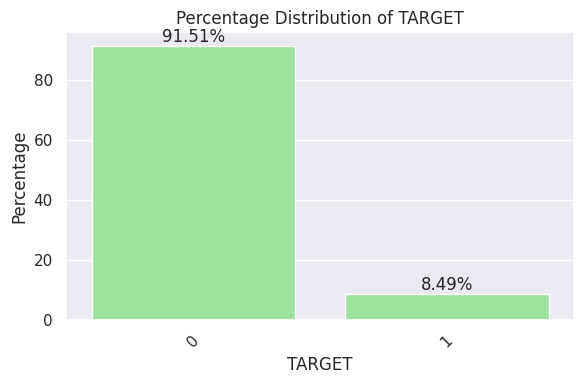

In [225]:
plot_percentage_distribution_single(combined_df,'TARGET')

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>The Data imbalance found in the dataset.</b></span>
        <br>
        <span style='color:green'><b></b></span>
    </span>    
</div>

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:0;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 20px;border-style: solid;border-color: dark green;"> Personal Information </div>

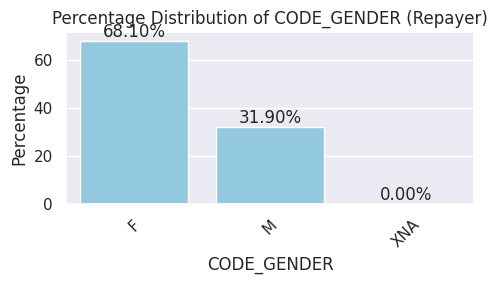

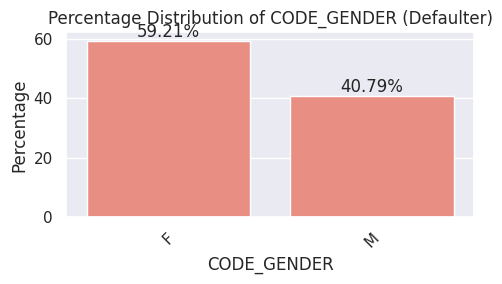

In [226]:
plot_percentage_distribution(combined_df, 'CODE_GENDER',(5,3))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>Male having higher Default Rates than Female </b></span>
        <br>
        <span style='color:green'><b>Female Defaulter are less</b></span>
    </span>    
</div>

In [227]:
combined_df['CODE_GENDER'].unique()

array(['M', 'F', 'XNA'], dtype=object)

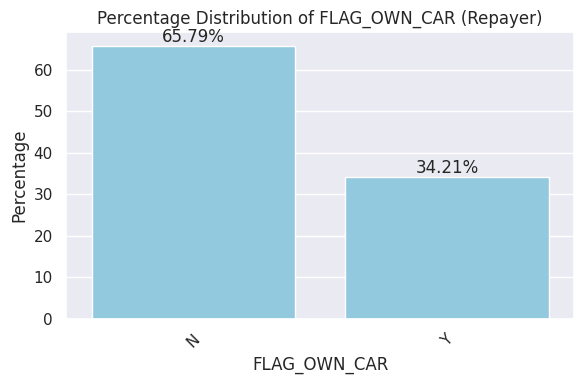

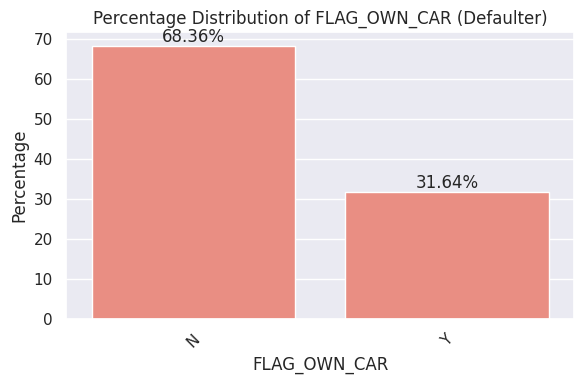

In [228]:
plot_percentage_distribution(combined_df, 'FLAG_OWN_CAR')

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>There default rates increasing when applicant don't have cars.</b></span>
        <br>
        <span style='color:green'><b>There default rates are lower when applicant have cars.</b></span>
    </span>    
</div>

In [229]:
combined_df['FLAG_OWN_CAR'].unique()

array(['N', 'Y'], dtype=object)

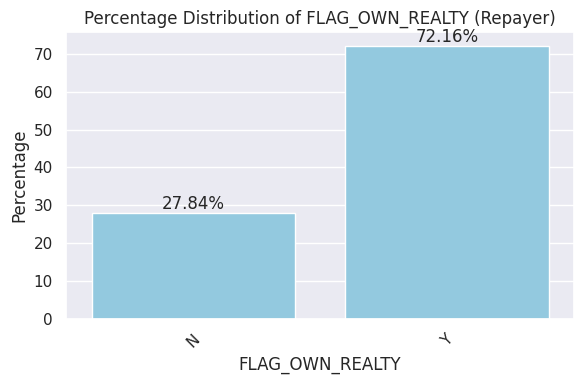

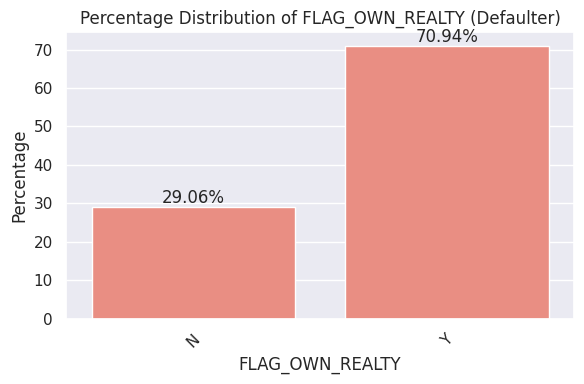

In [230]:
plot_percentage_distribution(combined_df, 'FLAG_OWN_REALTY')

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>There default rates increasing slightly when applicant don't have a house or flat.</b></span>
        <br>
        <span style='color:green'><b>There default rates are lower when applicant have  if client owns a house or flat.</b></span>
    </span>    
</div>

In [231]:
combined_df['FLAG_OWN_REALTY'].unique()

array(['Y', 'N'], dtype=object)

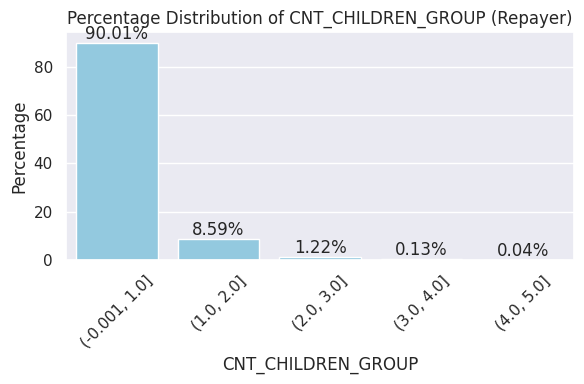

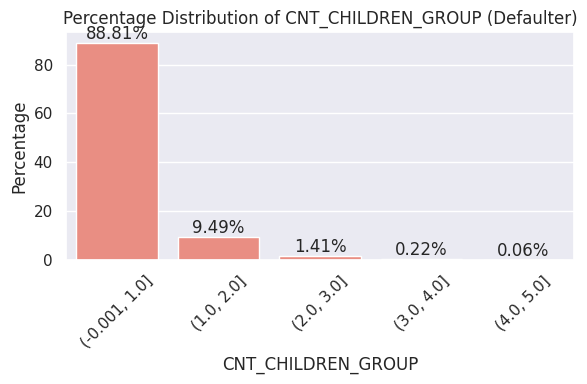

In [232]:
plot_percentage_distribution(combined_df, 'CNT_CHILDREN_GROUP')

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>There Default may possible when children count incraesing</b></span>
        <br>
        <span style='color:green'><b>There is less default when applicant don't have children.</b></span>
    </span>    
</div>

In [233]:
combined_df['CNT_CHILDREN_GROUP'].unique()

[(-0.001, 1.0], (1.0, 2.0], (2.0, 3.0], (3.0, 4.0], (4.0, 5.0]]
Categories (5, interval[float64, right]): [(-0.001, 1.0] < (1.0, 2.0] < (2.0, 3.0] < (3.0, 4.0] < (4.0, 5.0]]

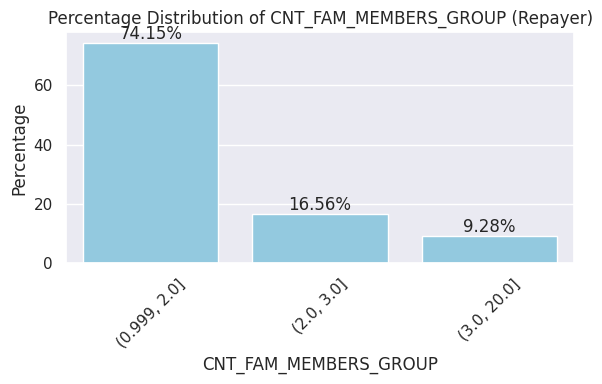

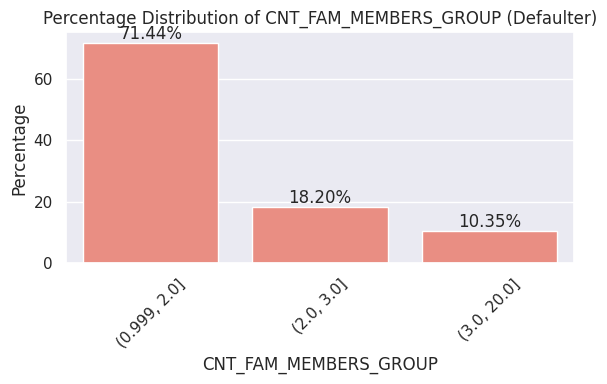

In [234]:
plot_percentage_distribution(combined_df,'CNT_FAM_MEMBERS_GROUP',(6,4))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>There default is increasing when family members count increases above 2.</b></span>
        <br>
        <span style='color:green'><b>There default is lower when family members count is equal to less than 2</b></span>
    </span>    
</div>

In [235]:
combined_df['CNT_FAM_MEMBERS_GROUP'].unique()

[(0.999, 2.0], (2.0, 3.0], (3.0, 20.0]]
Categories (3, interval[float64, right]): [(0.999, 2.0] < (2.0, 3.0] < (3.0, 20.0]]

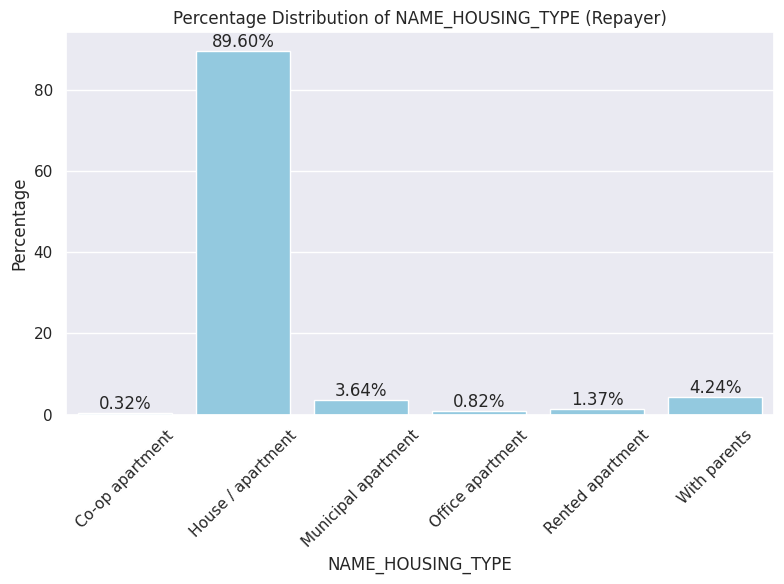

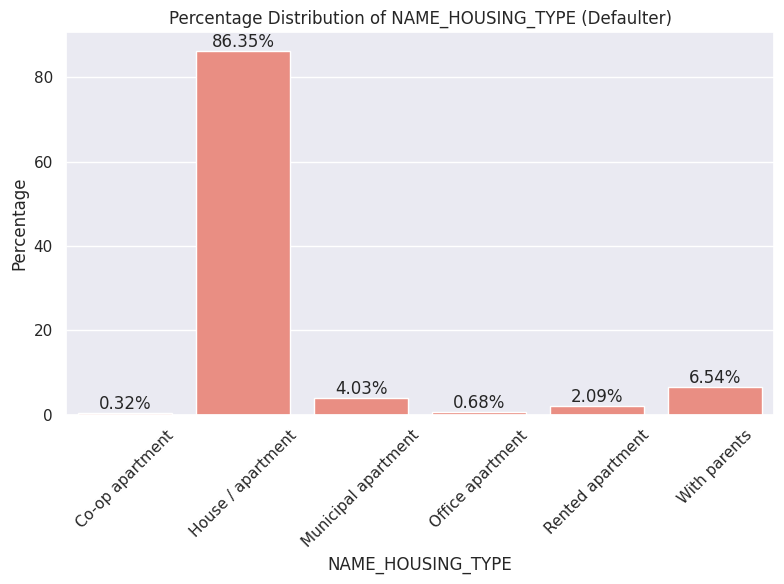

In [236]:
plot_percentage_distribution(combined_df,'NAME_HOUSING_TYPE',(8,6))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>There default is slightly increasing for housing type 'Municipal Apartment' ,'rented Apartment','With Parent'</b></span>
        <br>
        <span style='color:green'><b>There default is lower for housing type Office Apartment</b></span>
    </span>    
</div>

In [237]:
combined_df['NAME_HOUSING_TYPE'].unique()

array(['House / apartment', 'Rented apartment', 'With parents',
       'Municipal apartment', 'Office apartment', 'Co-op apartment'],
      dtype=object)

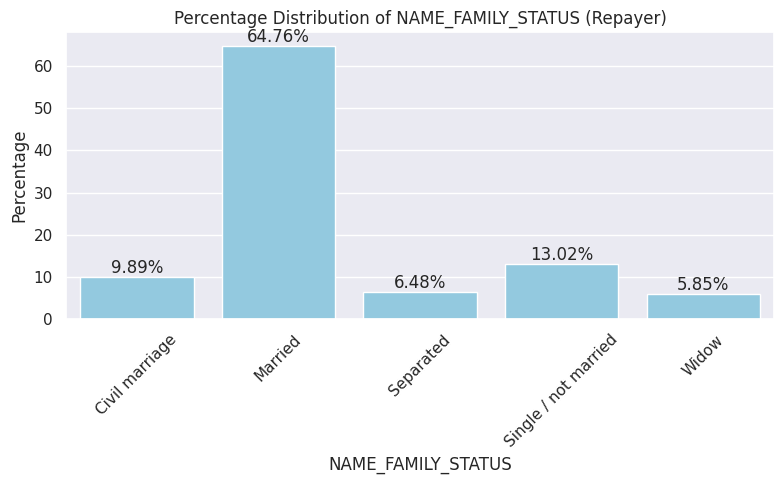

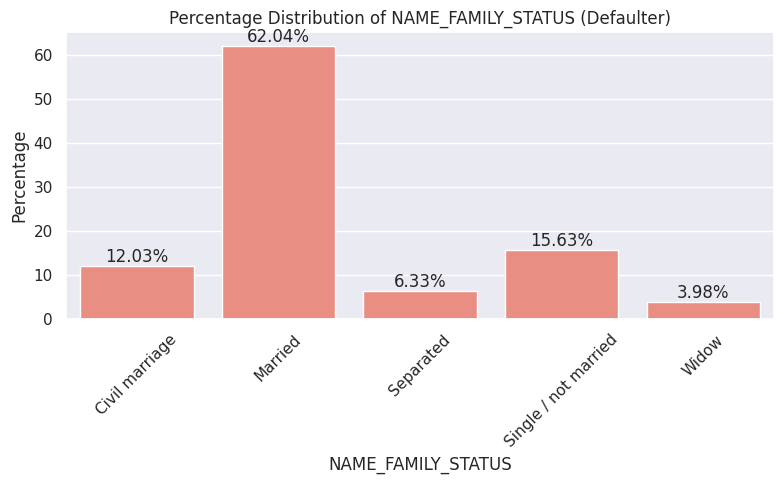

In [238]:
plot_percentage_distribution(combined_df,'NAME_FAMILY_STATUS',(8,5))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>There default is increasing when family status are 'single/Not married' & Civil Marriage</b></span>
        <br>
        <span style='color:green'><b>There default is lower when family status Widow,Married,Separated</b></span>
    </span>    
</div>

In [239]:
combined_df['NAME_FAMILY_STATUS'].unique()

array(['Single / not married', 'Married', 'Civil marriage', 'Widow',
       'Separated'], dtype=object)

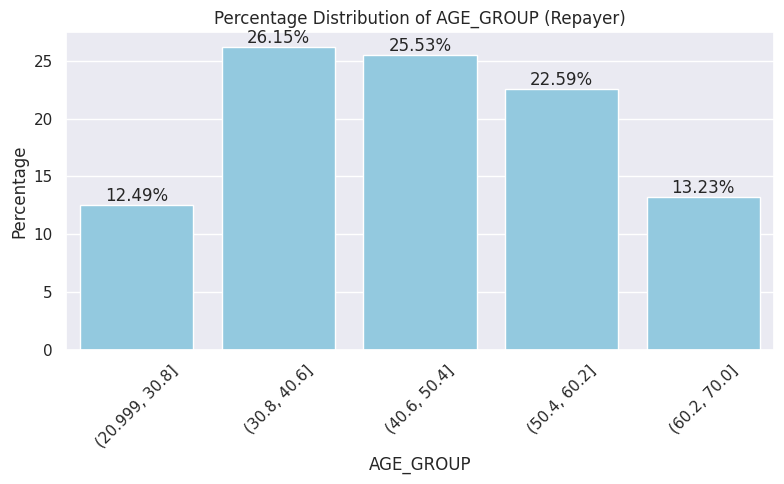

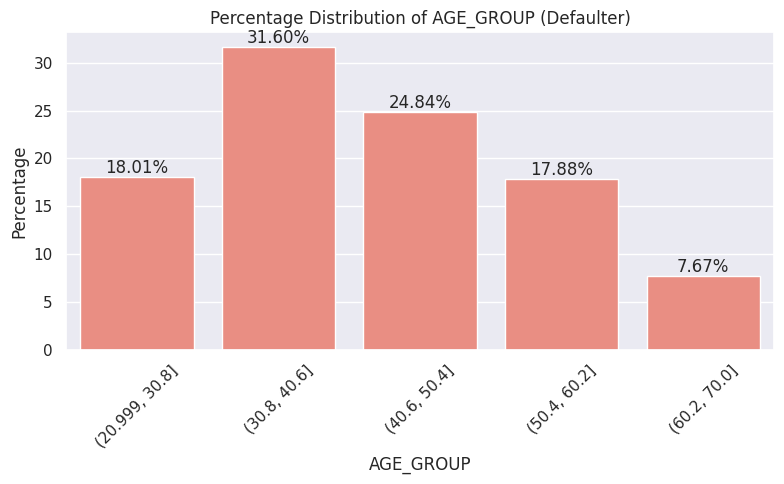

In [240]:
plot_percentage_distribution(combined_df,'AGE_GROUP',(8,5))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>There default rate increasing when age less than 40</b></span>
        <br>
        <span style='color:green'><b>There default rate reduces when age greater than 40</b></span>
    </span>    
</div>

In [241]:
combined_df['AGE_GROUP'].unique()

[(20.999, 30.8], (40.6, 50.4], (50.4, 60.2], (30.8, 40.6], (60.2, 70.0]]
Categories (5, interval[float64, right]): [(20.999, 30.8] < (30.8, 40.6] < (40.6, 50.4] < (50.4, 60.2] < (60.2, 70.0]]

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:0;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 20px;border-style: solid;border-color: dark green;"> Financial Details</div>

In [242]:
Fin_col=['INCOME_GROUP','AMT_CREDIT_GROUP','AMT_ANNUITY_GROUP','AMT_GOODS_PRICE_GROUP']

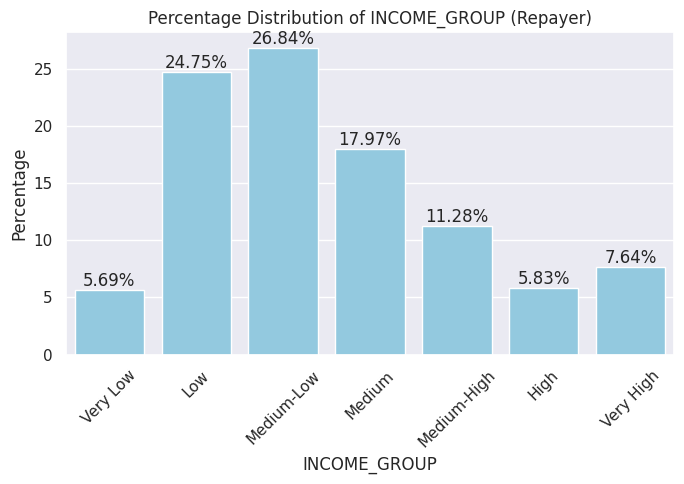

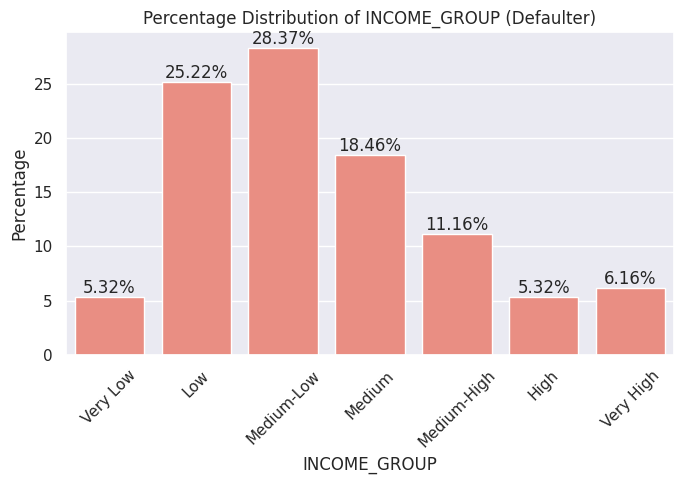

In [243]:
plot_percentage_distribution(combined_df,'INCOME_GROUP',(7,5))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>When the income in the range below 200k there is chance of default.</b></span>
        <br>
        <span style='color:green'><b>High income group shows low default</b></span>
    </span>    
</div>

In [244]:
combined_df['INCOME_GROUP'].unique()

['Medium', 'High', 'Very Low', 'Medium-Low', 'Low', 'Very High', 'Medium-High']
Categories (7, object): ['Very Low' < 'Low' < 'Medium-Low' < 'Medium' < 'Medium-High' < 'High' < 'Very High']

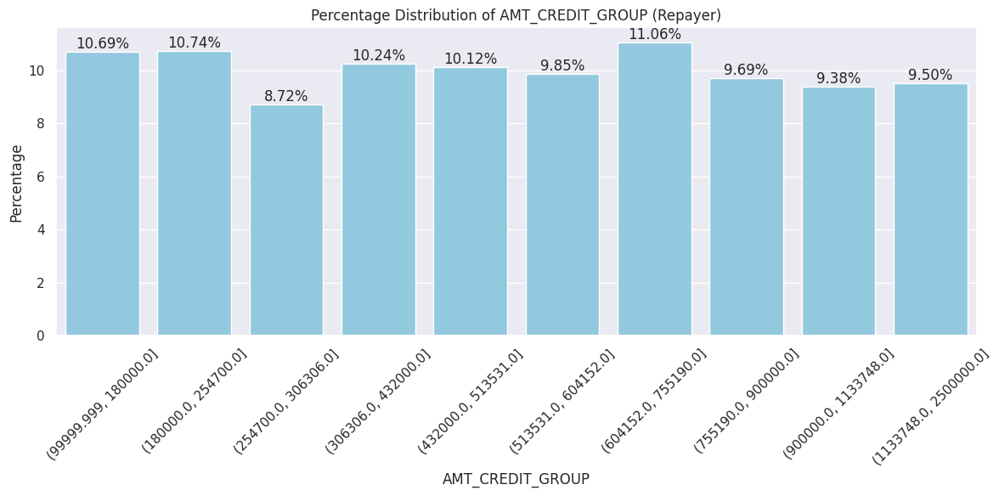

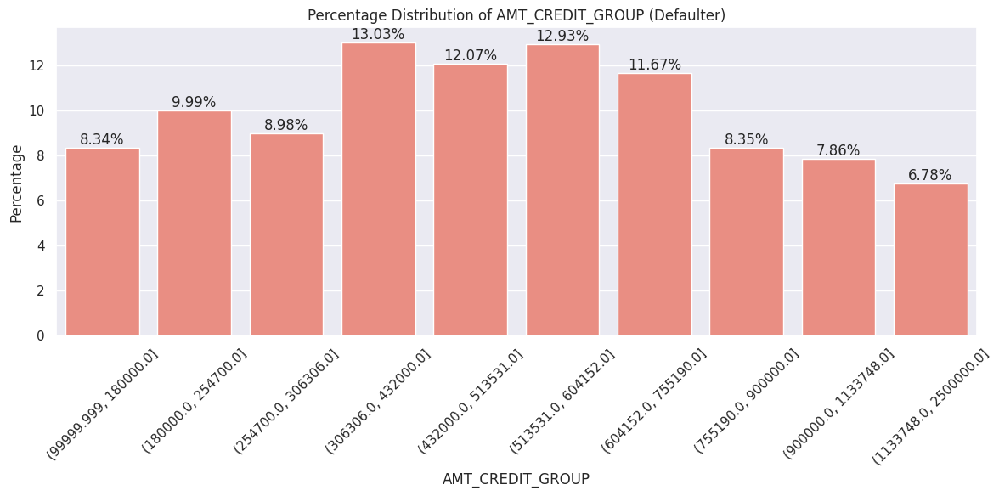

In [245]:
plot_percentage_distribution(combined_df,'AMT_CREDIT_GROUP',(12,6))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>The default is increasing when Amount Credit is in the range of 300-750k </b></span>
        <br>
        <span style='color:green'><b>The default is lower below credit group of 300 k and also above 750k </b></span>
    </span>    
</div>

In [246]:
combined_df['AMT_CREDIT_GROUP'].unique()

[(306306.0, 432000.0], (1133748.0, 2500000.0], (99999.999, 180000.0], (432000.0, 513531.0], (900000.0, 1133748.0], (604152.0, 755190.0], (755190.0, 900000.0], (254700.0, 306306.0], (513531.0, 604152.0], (180000.0, 254700.0]]
Categories (10, interval[float64, right]): [(99999.999, 180000.0] < (180000.0, 254700.0] < (254700.0, 306306.0] < (306306.0, 432000.0] ... (604152.0, 755190.0] < (755190.0, 900000.0] < (900000.0, 1133748.0] < (1133748.0, 2500000.0]]

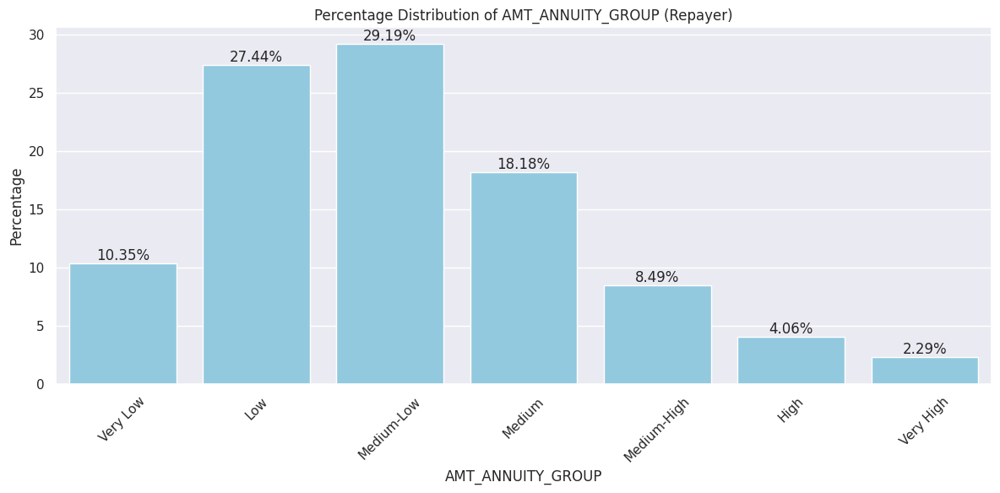

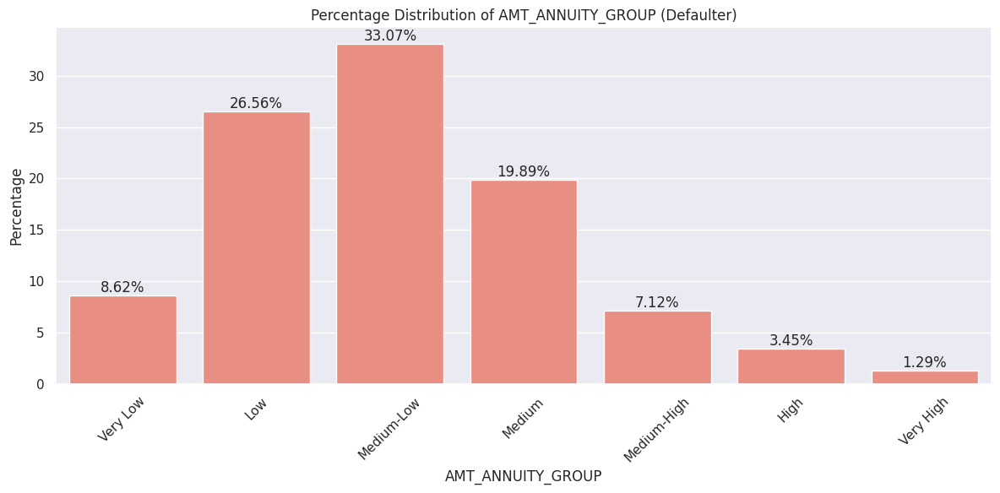

In [247]:
plot_percentage_distribution(combined_df,'AMT_ANNUITY_GROUP',(12,6))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>The default is increasing when annuity amount in the range of 15k-40k.(Medium)</b></span>
        <br>
        <span style='color:green'><b>Other than 15k-40k there is default rate reduced </b></span>
    </span>    
</div>

In [248]:
combined_df['AMT_ANNUITY_GROUP'].unique()

['Medium-Low', 'Medium', 'Very Low', 'Medium-High', 'Low', 'High', 'Very High']
Categories (7, object): ['Very Low' < 'Low' < 'Medium-Low' < 'Medium' < 'Medium-High' < 'High' < 'Very High']

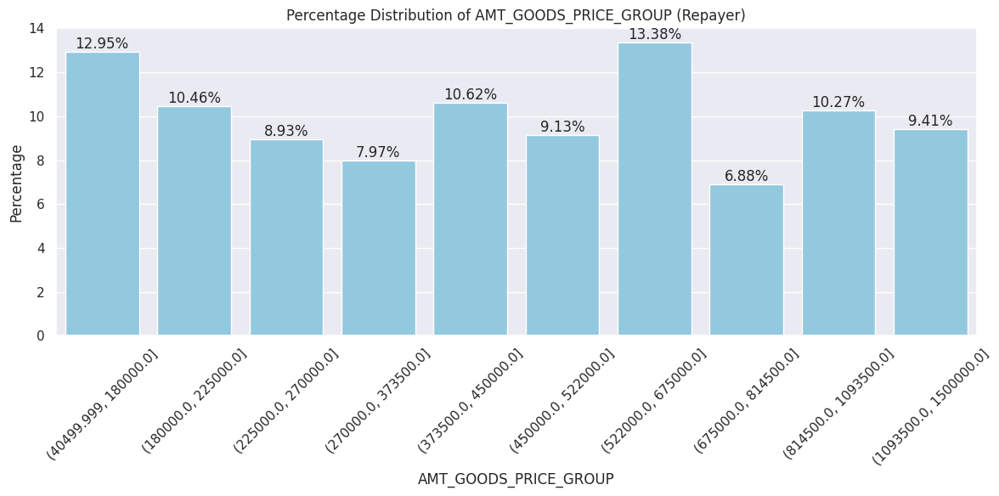

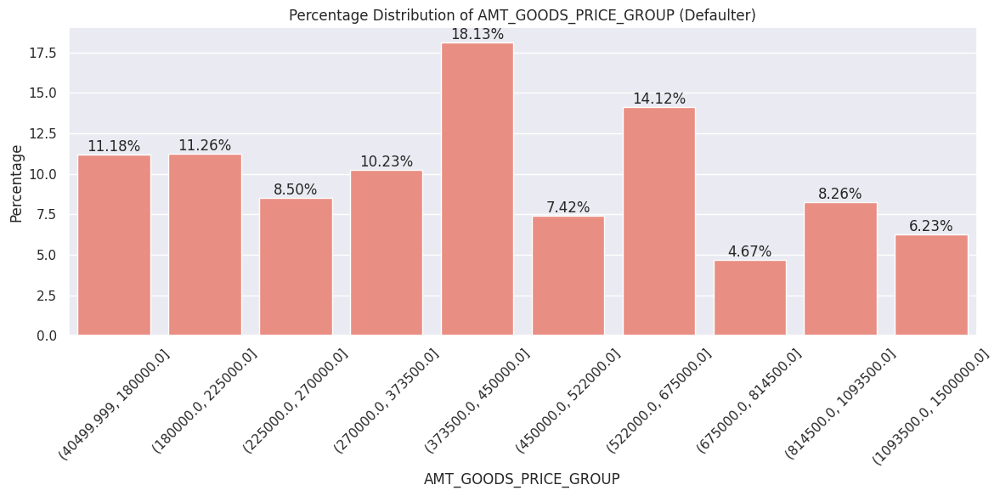

In [249]:
plot_percentage_distribution(combined_df,'AMT_GOODS_PRICE_GROUP',(12,6))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>When the good price in the range of 200k-500k there is high chance of default.</b></span>
        <br>
        <span style='color:green'><b>Other than 200k-500k the default rate reduced</b></span>
    </span>    
</div>

In [250]:
combined_df['AMT_GOODS_PRICE_GROUP'].unique()

[(270000.0, 373500.0], (1093500.0, 1500000.0], (40499.999, 180000.0], (450000.0, 522000.0], (814500.0, 1093500.0], (373500.0, 450000.0], (522000.0, 675000.0], (675000.0, 814500.0], (225000.0, 270000.0], (180000.0, 225000.0]]
Categories (10, interval[float64, right]): [(40499.999, 180000.0] < (180000.0, 225000.0] < (225000.0, 270000.0] < (270000.0, 373500.0] ... (522000.0, 675000.0] < (675000.0, 814500.0] < (814500.0, 1093500.0] < (1093500.0, 1500000.0]]

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:0;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 20px;border-style: solid;border-color: dark green;"> Residence Details </div>

In [251]:
res_col=['REGION_POPULATION_RELATIVE_GROUP','REGION_RATING_CLIENT','REGION_RATING_CLIENT_W_CITY','REG_REGION_NOT_LIVE_REGION',
         'REG_REGION_NOT_WORK_REGION','LIVE_REGION_NOT_WORK_REGION','REG_CITY_NOT_LIVE_CITY','REG_CITY_NOT_WORK_CITY',
         'LIVE_CITY_NOT_WORK_CITY']

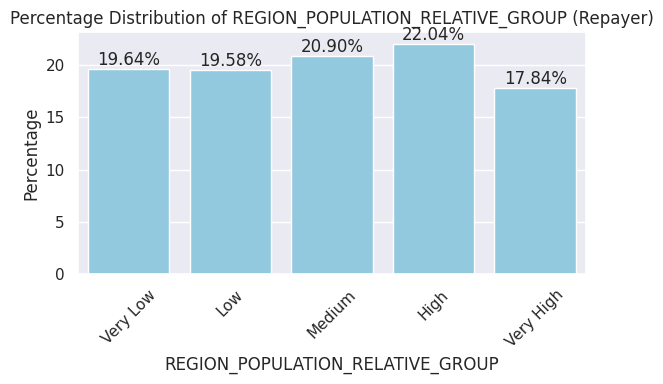

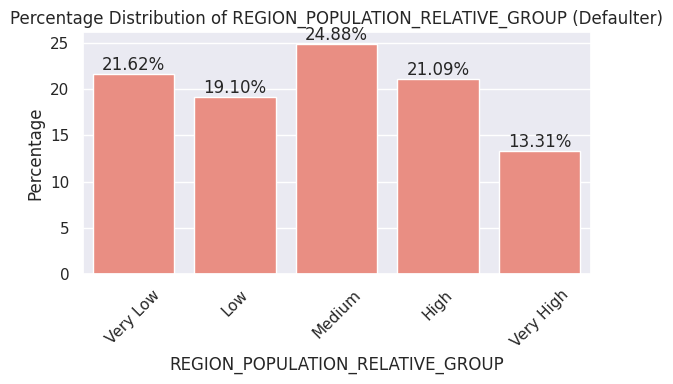

In [252]:
plot_percentage_distribution(combined_df,'REGION_POPULATION_RELATIVE_GROUP',(6,4))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>When the REGION_POPULATION_RELATIVE_GROUP in Very Low there is chance of default.</b></span>
        <br>
        <span style='color:green'><b>When the REGION_POPULATION_RELATIVE_GROUP in High there is less chance of default.</b></span>
    </span>    
</div>

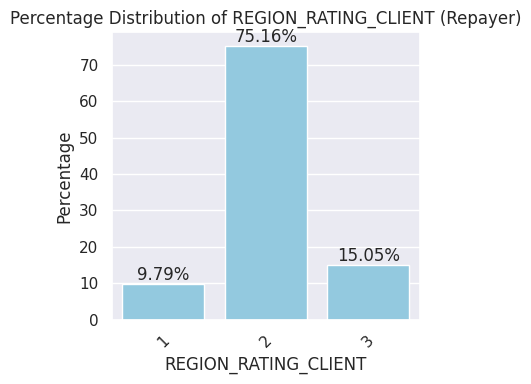

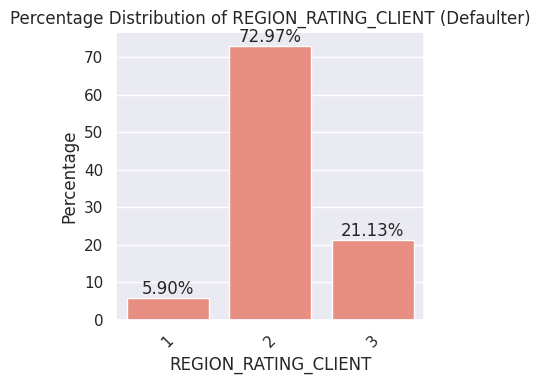

In [253]:
plot_percentage_distribution(combined_df,'REGION_RATING_CLIENT',(4,4))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>The default rate increasing when region rate increasing</b></span>
        <br>
        <span style='color:green'><b>he default rate decreasing when region rate decreasing</b></span>
    </span>    
</div>

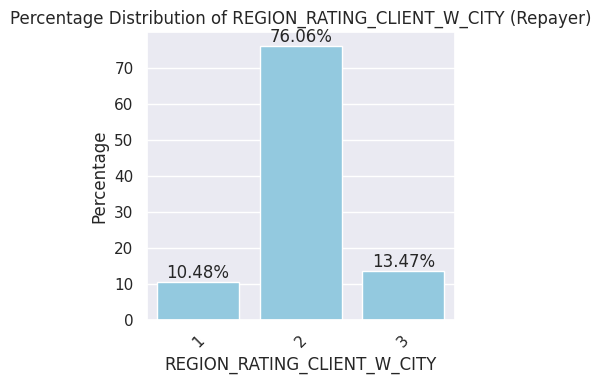

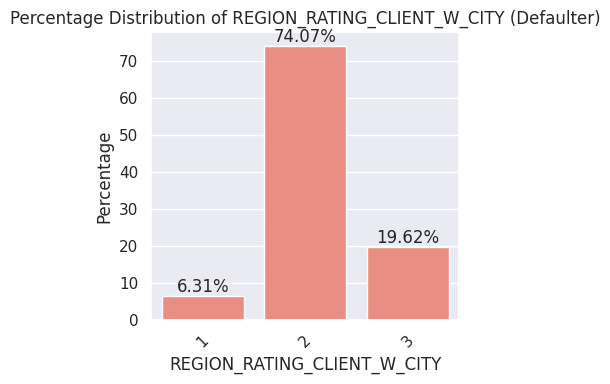

In [254]:
plot_percentage_distribution(combined_df,'REGION_RATING_CLIENT_W_CITY',(4,4))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>The default rate increasing when region rate increasing</b></span>
        <br>
        <span style='color:green'><b>he default rate decreasing when region rate decreasing</b></span>
    </span>    
</div>

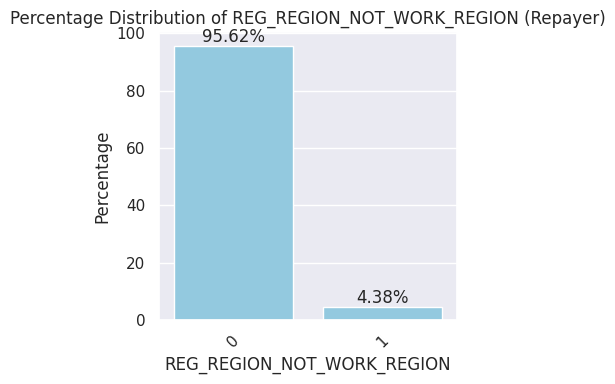

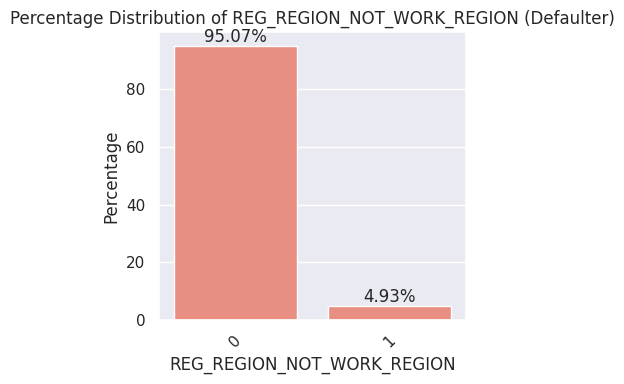

In [255]:
plot_percentage_distribution(combined_df,'REG_REGION_NOT_WORK_REGION',(4,4))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>There is no siginificant impact on REG_REGION_NOT_WORK_REGION</b></span>
        <br>
      
</div>

In [256]:
Drop_col=['REG_REGION_NOT_WORK_REGION']

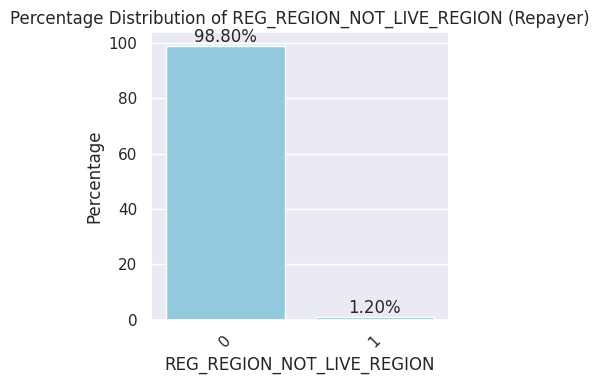

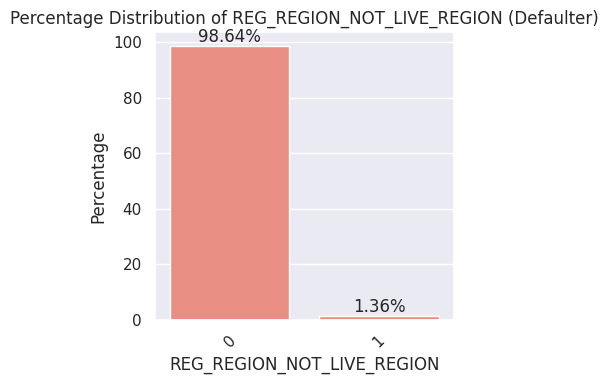

In [257]:
plot_percentage_distribution(combined_df,'REG_REGION_NOT_LIVE_REGION',(4,4))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>When the good price in the range of 200k-500k there is high chance of default.</b></span>
        <br>
        <span style='color:green'><b>Other than 200k-500k the default rate reduced</b></span>
    </span>    
</div>

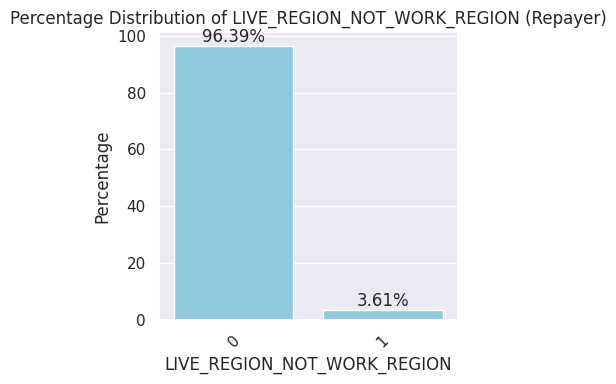

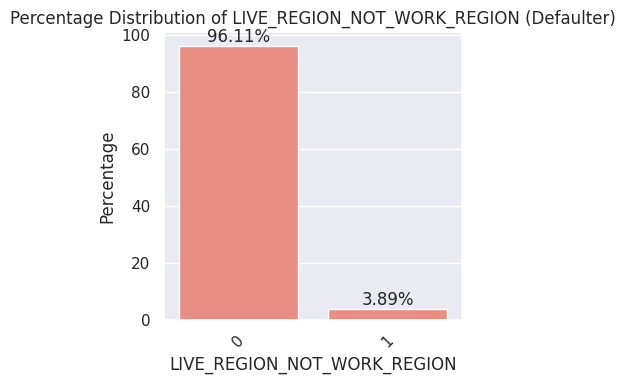

In [258]:
plot_percentage_distribution(combined_df,'LIVE_REGION_NOT_WORK_REGION',(4,4))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>There is no siginificant impact on LIVE_REGION_NOT_WORK_REGION</b></span>
        <br>
      
</div>

In [259]:
Drop_col.append('LIVE_REGION_NOT_WORK_REGION')

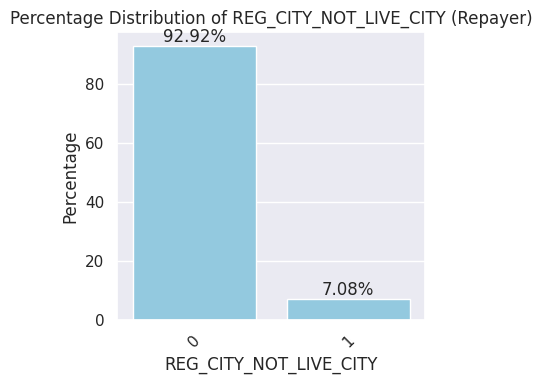

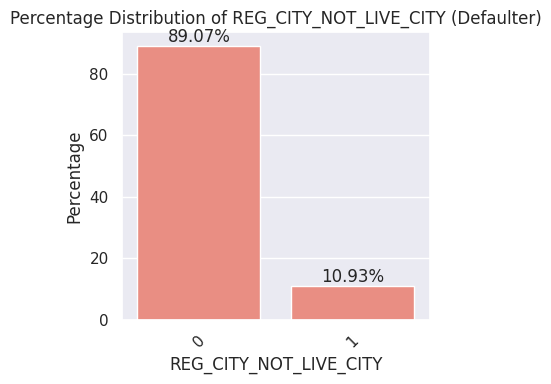

In [260]:
plot_percentage_distribution(combined_df,'REG_CITY_NOT_LIVE_CITY',(4,4))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>The default rete increases when applicant's region city is not live city</b></span>
    </span>    
</div>

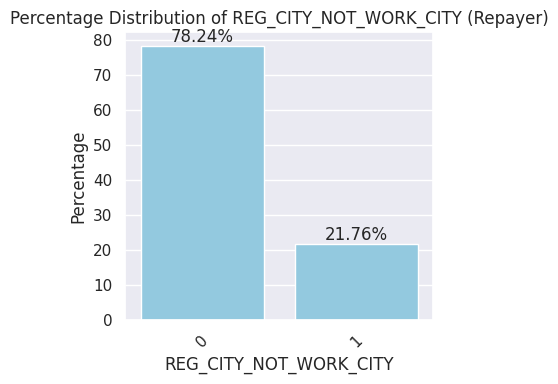

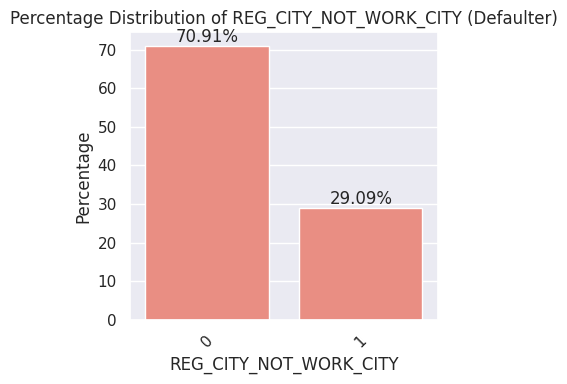

In [261]:
plot_percentage_distribution(combined_df,'REG_CITY_NOT_WORK_CITY',(4,4))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>The default rete increases when applicant's region city is not work city</b></span>
    </span>    
</div>

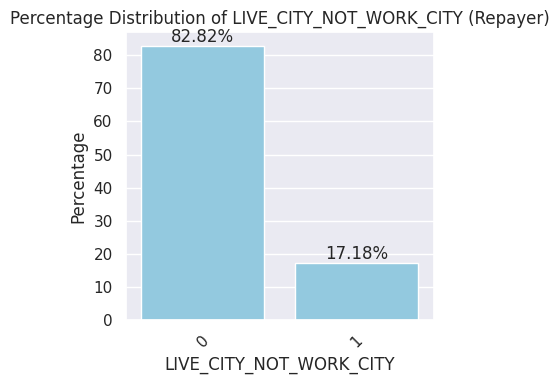

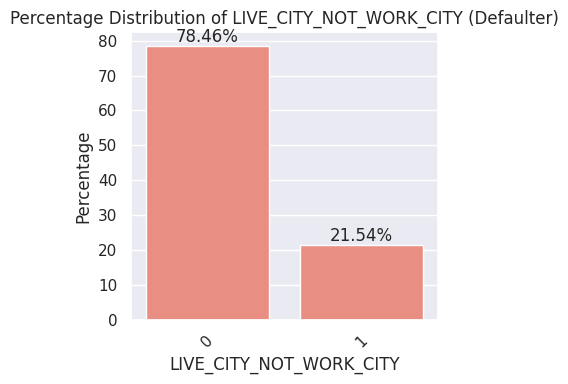

In [262]:
plot_percentage_distribution(combined_df,'LIVE_CITY_NOT_WORK_CITY',(4,4))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>The default rete increases when applicant's is in live city but not work city</b></span>
    </span>    
</div>

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:0;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 20px;border-style: solid;border-color: dark green;"> Work Details </div>

In [263]:
work_col=['YEARS_EMPLOYED_GROUP','NAME_INCOME_TYPE','NAME_EDUCATION_TYPE','OCCUPATION_TYPE','ORGANIZATION_TYPE']

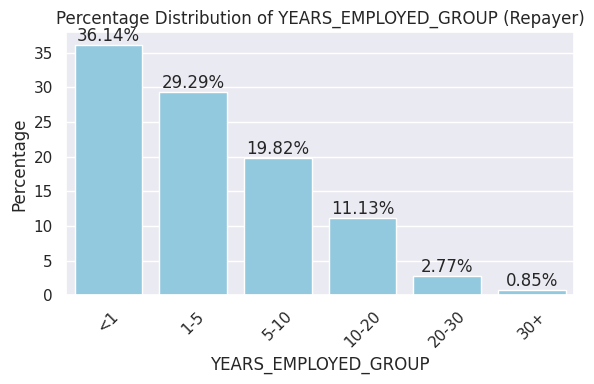

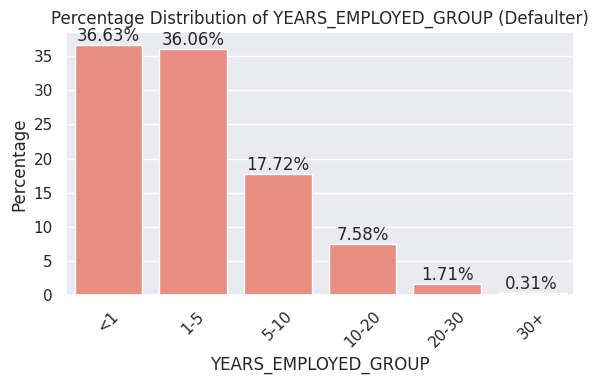

In [264]:
plot_percentage_distribution(combined_df, 'YEARS_EMPLOYED_GROUP',(6,4))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>The Default Rate Increases when years employed in a organization is less than 5 years</b></span>
        <br>
        <span style='color:green'><b>The Default Rate decreases when years employed in a organization is greater than 5 years</b></span>
    </span>    
</div>

In [265]:
combined_df['YEARS_EMPLOYED_GROUP'].unique()

['<1', '1-5', '5-10', '20-30', '10-20', '30+']
Categories (6, object): ['<1' < '1-5' < '5-10' < '10-20' < '20-30' < '30+']

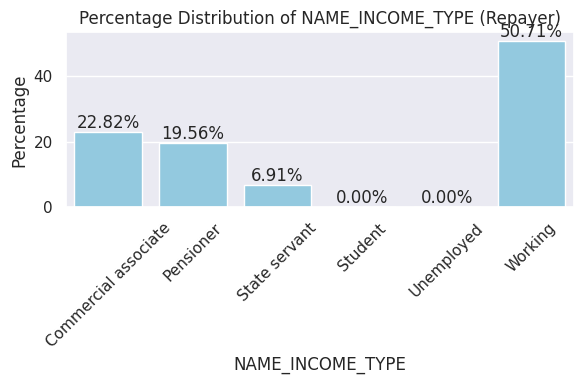

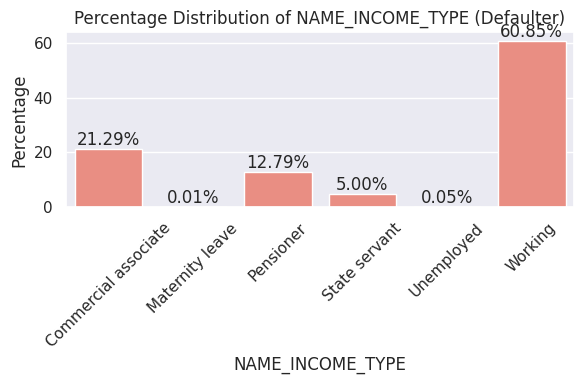

In [266]:
plot_percentage_distribution(combined_df, 'NAME_INCOME_TYPE',(6,4))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>The default rate slightly increases for applicant who are unemployed and working</b></span>
        <br>
        <span style='color:green'><b>there is reduced default rate for pensioner,state servant,</b></span>
    </span>    
</div>

In [267]:
combined_df['NAME_INCOME_TYPE'].unique()

array(['Working', 'State servant', 'Commercial associate', 'Pensioner',
       'Unemployed', 'Student', 'Maternity leave'], dtype=object)

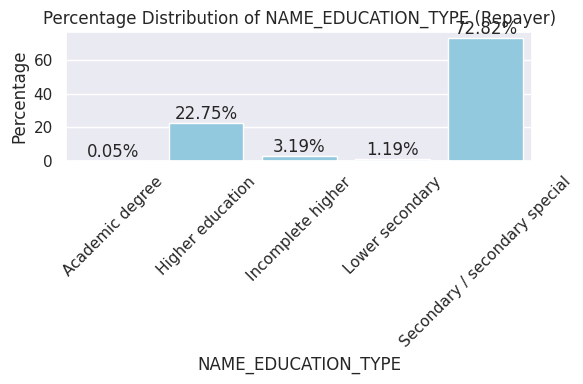

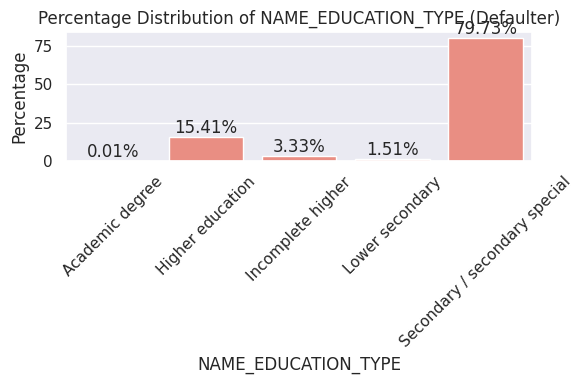

In [268]:
plot_percentage_distribution(combined_df, 'NAME_EDUCATION_TYPE',(6,4))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>The default rate increses when education type goes lower</b></span>
         
</div>

In [269]:
combined_df['NAME_EDUCATION_TYPE'].unique()

array(['Secondary / secondary special', 'Higher education',
       'Incomplete higher', 'Lower secondary', 'Academic degree'],
      dtype=object)

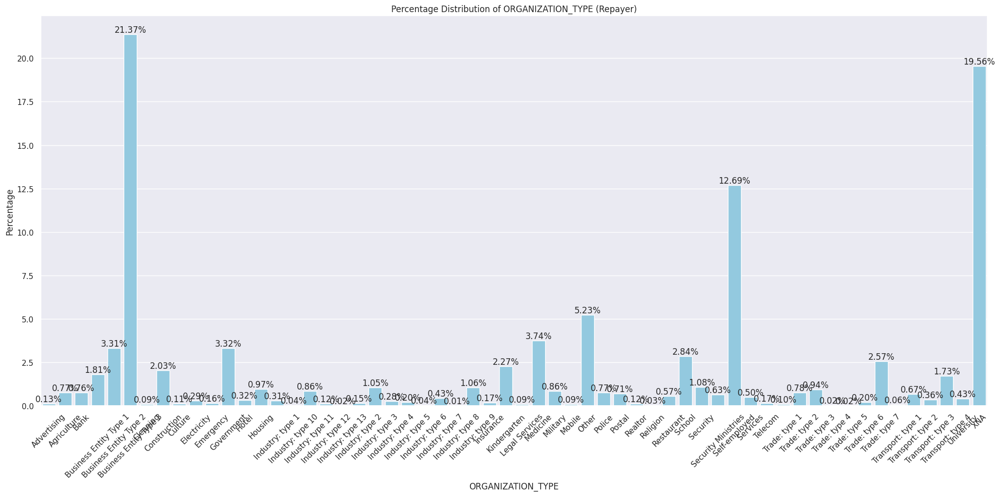

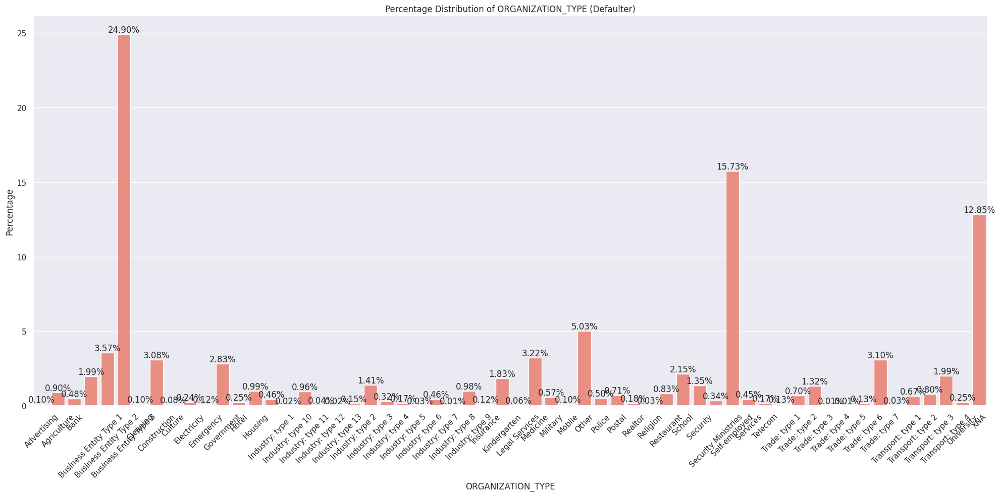

In [270]:
plot_percentage_distribution(combined_df, 'ORGANIZATION_TYPE',(20,10))

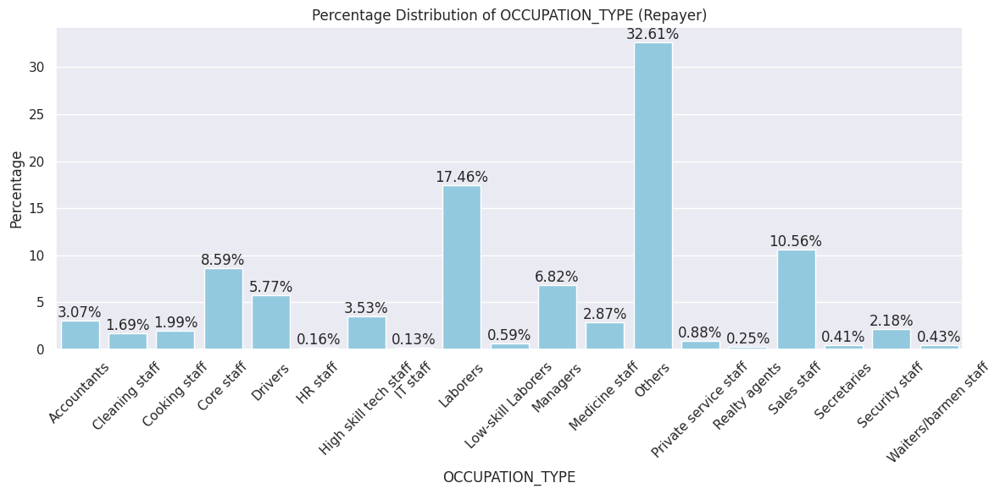

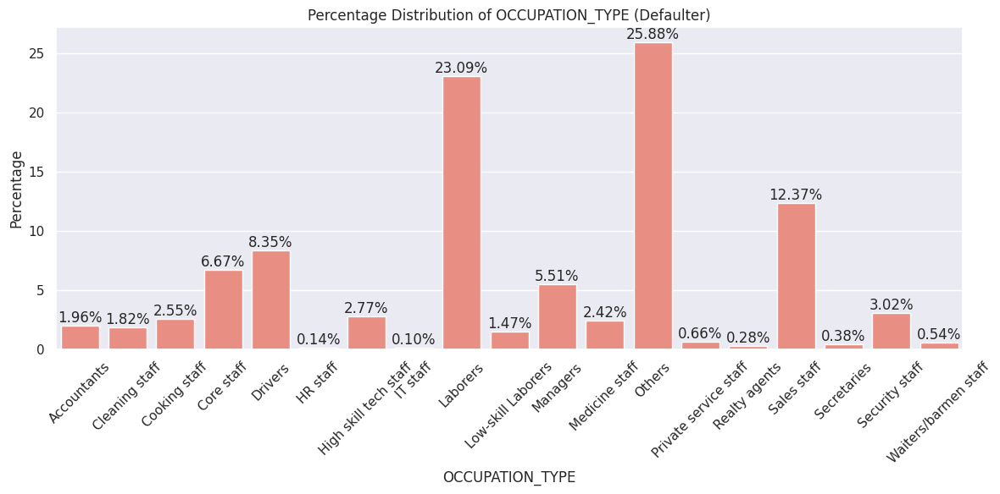

In [271]:
plot_percentage_distribution(combined_df, 'OCCUPATION_TYPE',(12,6))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>The default rate increases for labourers and lowlevel staff</b></span>
    </span>    
</div>

In [272]:
combined_df['OCCUPATION_TYPE'].unique()

array(['Laborers', 'Core staff', 'Accountants', 'Managers', 'Others',
       'Drivers', 'Sales staff', 'Cleaning staff',
       'Private service staff', 'Medicine staff', 'Security staff',
       'Cooking staff', 'High skill tech staff', 'Waiters/barmen staff',
       'Low-skill Laborers', 'Realty agents', 'Secretaries', 'IT staff',
       'HR staff'], dtype=object)

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:0;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 20px;border-style: solid;border-color: dark green;"> Communication Details </div>

In [273]:
comm_col=['FLAG_MOBIL','FLAG_EMP_PHONE','FLAG_WORK_PHONE','FLAG_CONT_MOBILE','FLAG_PHONE','FLAG_EMAIL',
          'DAYS_LAST_PHONE_CHANGE_GROUP']

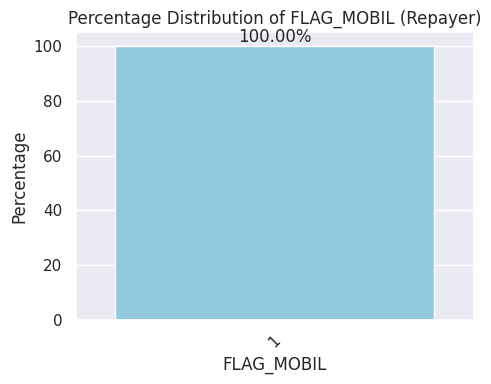

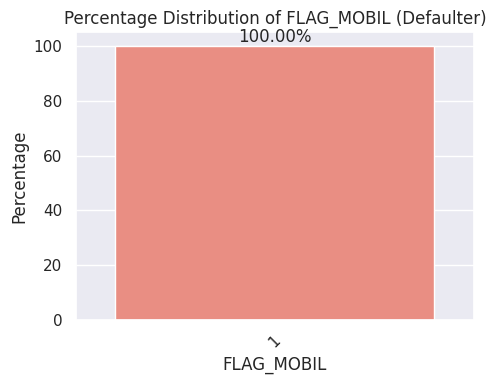

In [274]:
plot_percentage_distribution(combined_df, 'FLAG_MOBIL',(5,4))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>there is no siginificance impact for default</b></span>
</div>

In [275]:
Drop_col.append('FLAG_MOBIL')

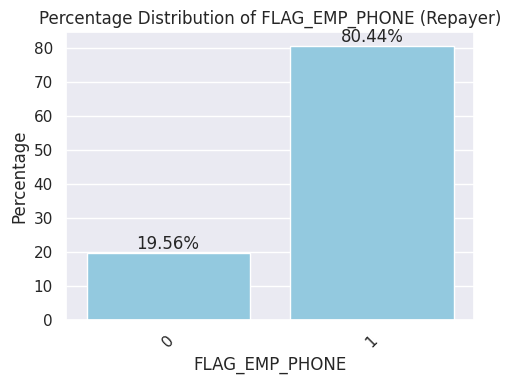

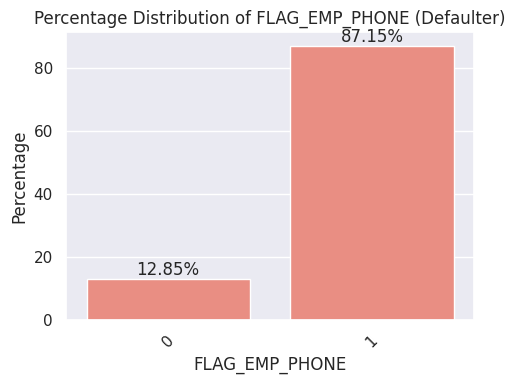

In [276]:
plot_percentage_distribution(combined_df, 'FLAG_EMP_PHONE',(5,4))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>there is no siginificance impact for default</b></span>
</div>

In [277]:
Drop_col.append('FLAG_EMP_PHONE')

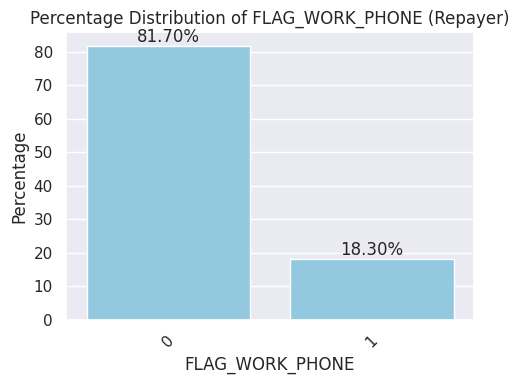

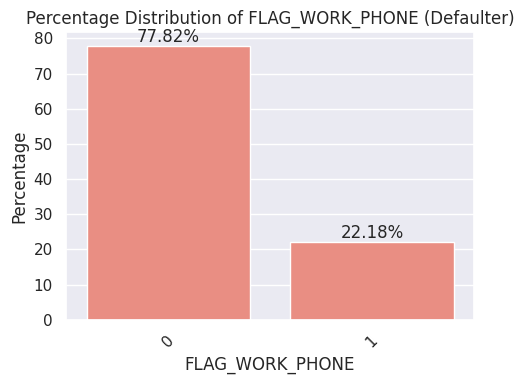

In [278]:
plot_percentage_distribution(combined_df, 'FLAG_WORK_PHONE',(5,4))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>there is no siginificance impact for default</b></span>
</div>

In [279]:
Drop_col.append('FLAG_WORK_PHONE')

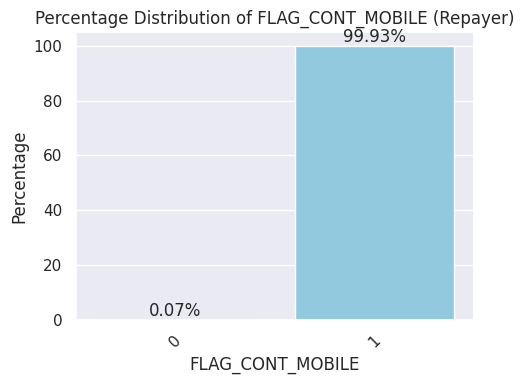

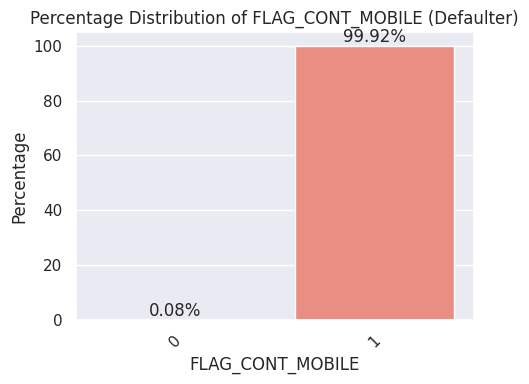

In [280]:
plot_percentage_distribution(combined_df, 'FLAG_CONT_MOBILE',(5,4))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>there is no siginificance impact for default</b></span>
</div>

In [281]:
Drop_col.append('FLAG_CONT_MOBILE')

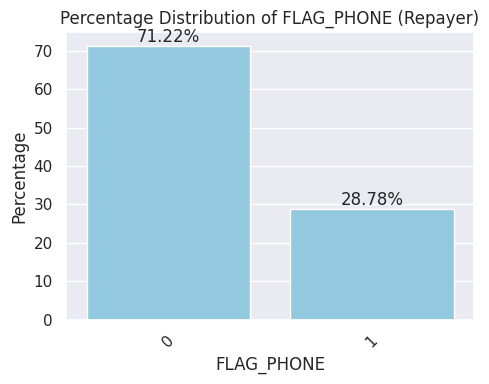

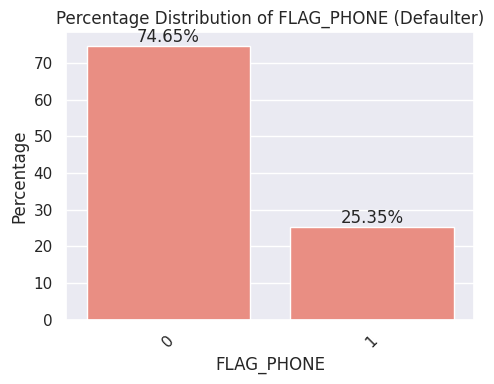

In [282]:
plot_percentage_distribution(combined_df, 'FLAG_PHONE',(5,4))

In [283]:
Drop_col.append('FLAG_PHONE')

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>there is no siginificance impact for default</b></span>
</div>

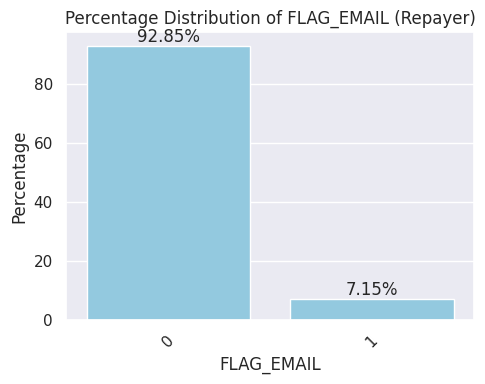

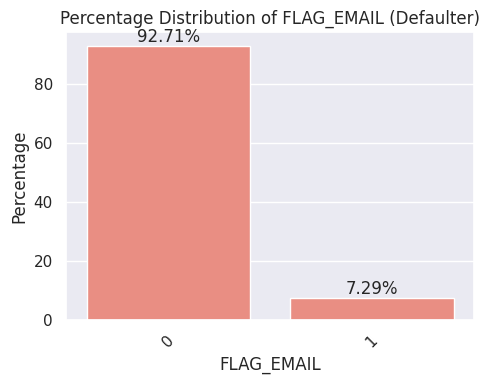

In [284]:
plot_percentage_distribution(combined_df, 'FLAG_EMAIL',(5,4))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>there is no siginificance impact for default</b></span>
</div>

In [285]:
Drop_col.append('FLAG_EMAIL')

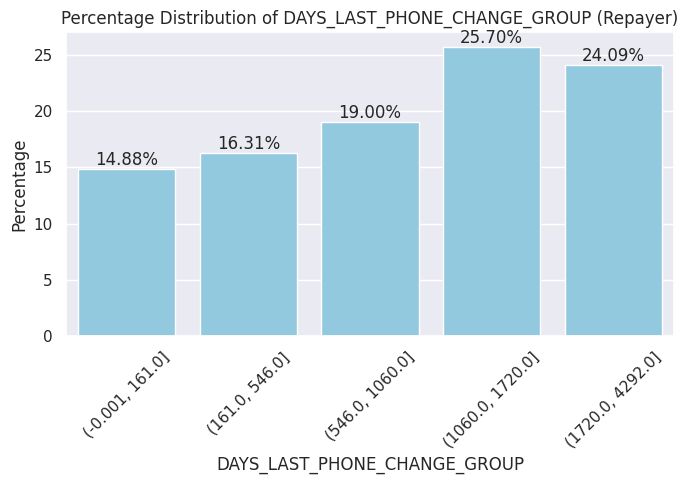

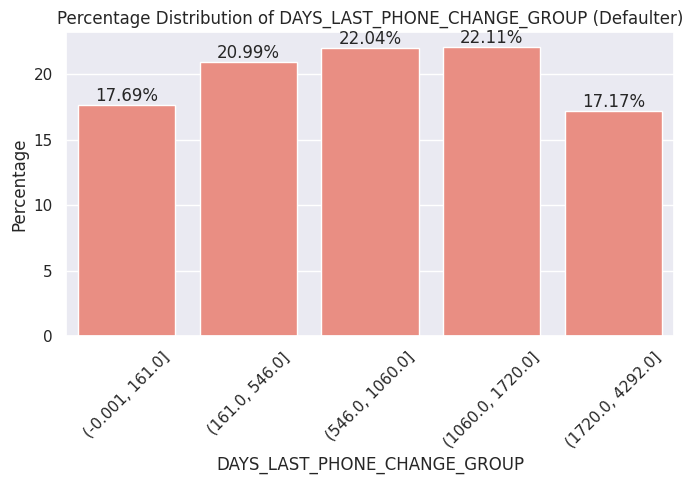

In [286]:
plot_percentage_distribution(combined_df, 'DAYS_LAST_PHONE_CHANGE_GROUP',(7,5))

In [287]:
combined_df['DAYS_LAST_PHONE_CHANGE_GROUP']=combined_df['DAYS_LAST_PHONE_CHANGE_GROUP'].astype(str)
combined_df['DAYS_LAST_PHONE_CHANGE_GROUP'].unique()

array(['(1060.0, 1720.0]', '(546.0, 1060.0]', '(1720.0, 4292.0]',
       '(-0.001, 161.0]', '(161.0, 546.0]'], dtype=object)

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>When phone change frequencies is less than 3 years its chance for default</b></span>
</div>

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:0;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 20px;border-style: solid;border-color: dark green;"> Credit Bureau Requests Details </div>

In [288]:
Cred_bur_col=['AMT_REQ_CREDIT_BUREAU_HOUR_GROUP','AMT_REQ_CREDIT_BUREAU_DAY_GROUP','AMT_REQ_CREDIT_BUREAU_WEEK_GROUP',
              'AMT_REQ_CREDIT_BUREAU_MON_GROUP','AMT_REQ_CREDIT_BUREAU_QRT_GROUP','AMT_REQ_CREDIT_BUREAU_YEAR_GROUP']

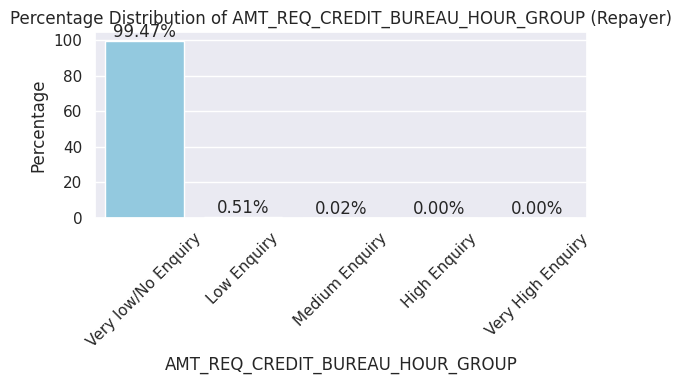

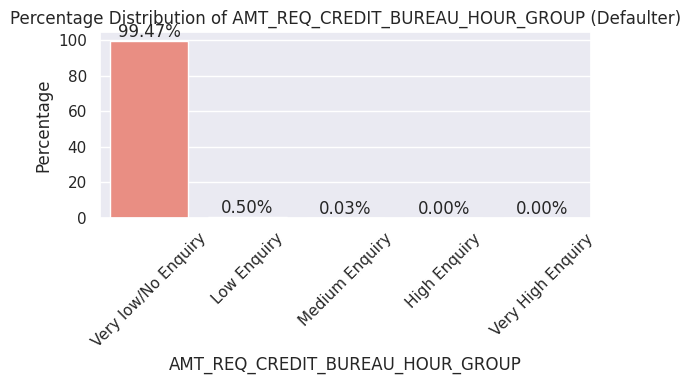

In [289]:
plot_percentage_distribution(combined_df, 'AMT_REQ_CREDIT_BUREAU_HOUR_GROUP',(6,4))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>When the good price in the range of 200k-500k there is high chance of default.</b></span>
        <br>
        <span style='color:green'><b>Other than 200k-500k the default rate reduced</b></span>
    </span>    
</div>

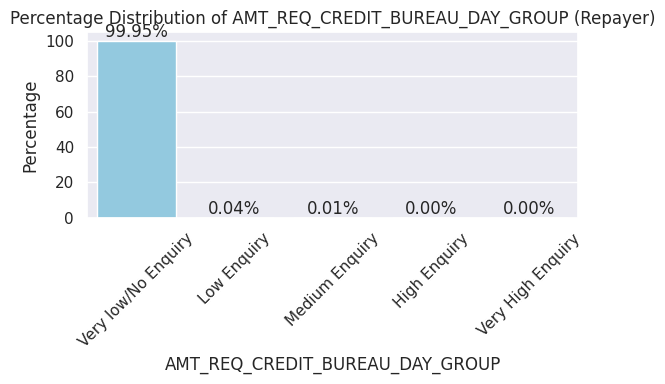

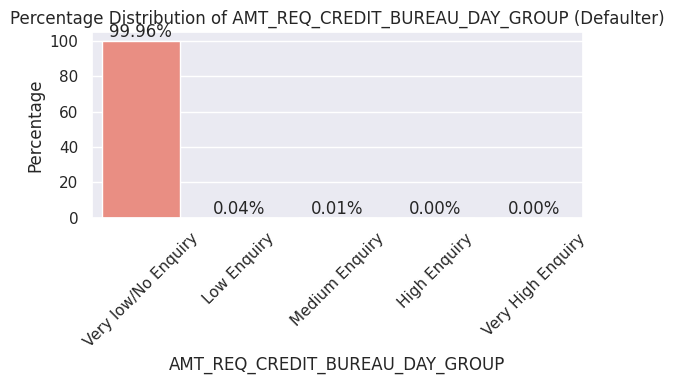

In [290]:
plot_percentage_distribution(combined_df, 'AMT_REQ_CREDIT_BUREAU_DAY_GROUP',(6,4))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>When the good price in the range of 200k-500k there is high chance of default.</b></span>
        <br>
        <span style='color:green'><b>Other than 200k-500k the default rate reduced</b></span>
    </span>    
</div>

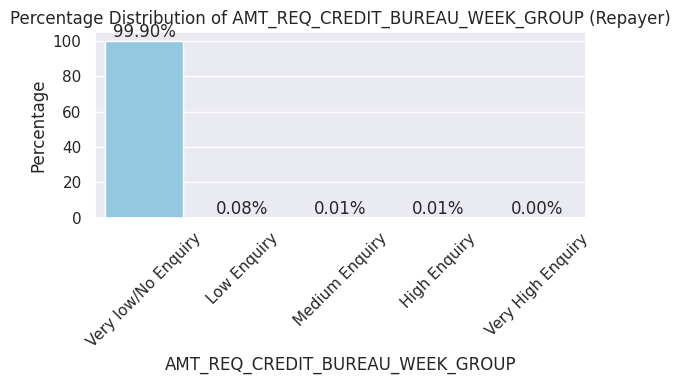

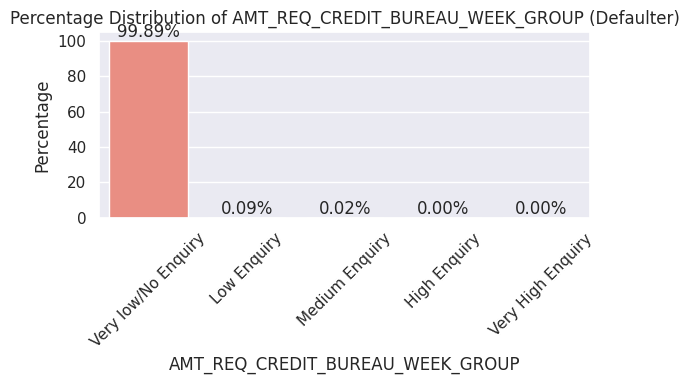

In [291]:
plot_percentage_distribution(combined_df, 'AMT_REQ_CREDIT_BUREAU_WEEK_GROUP',(6,4))

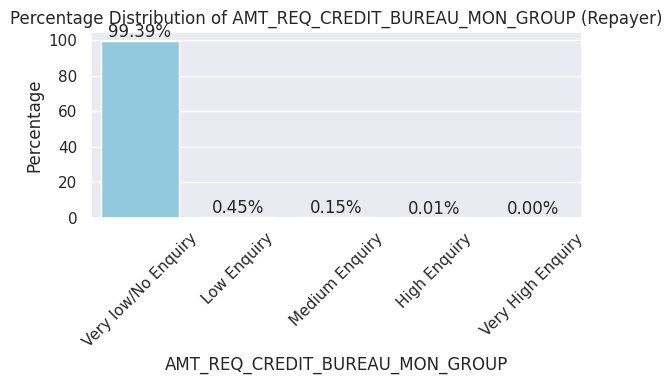

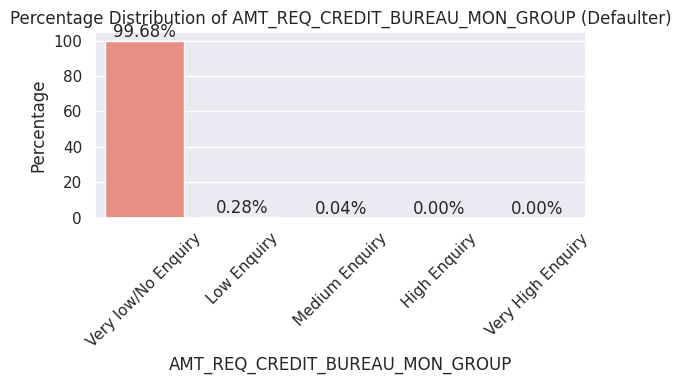

In [292]:
plot_percentage_distribution(combined_df, 'AMT_REQ_CREDIT_BUREAU_MON_GROUP',(6,4))

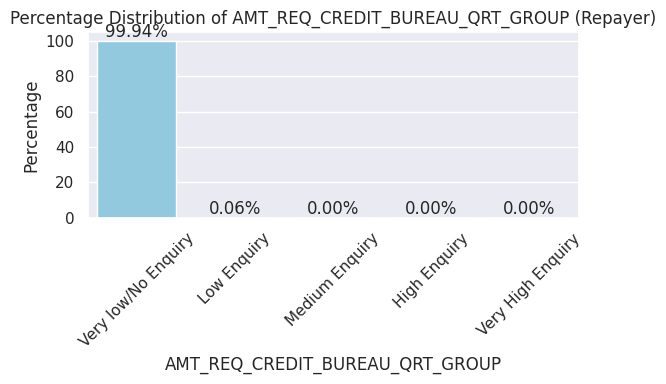

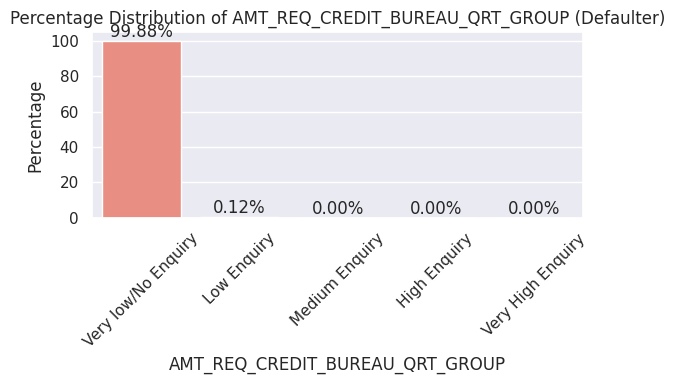

In [293]:
plot_percentage_distribution(combined_df, 'AMT_REQ_CREDIT_BUREAU_QRT_GROUP',(6,4))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>there is no siginificance impact for default</b></span>
</div>

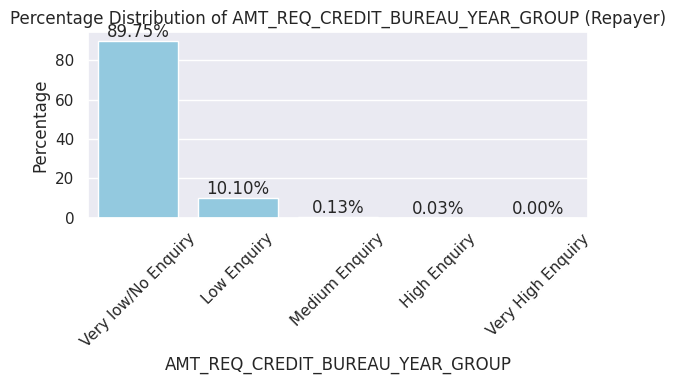

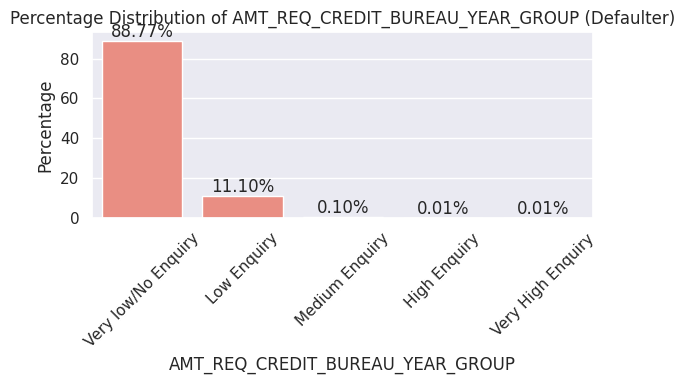

In [294]:
plot_percentage_distribution(combined_df, 'AMT_REQ_CREDIT_BUREAU_YEAR_GROUP',(6,4))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>When there is increase in credit bureau requests there is chance for default</b></span>
</div>

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:0;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 20px;border-style: solid;border-color: dark green;"> Social Circle Details </div>

In [295]:
soc_col=['OBS_30_CNT_SOCIAL_CIRCLE_GROUP','DEF_30_CNT_SOCIAL_CIRCLE_GROUP','OBS_60_CNT_SOCIAL_CIRCLE_GROUP',
         'DEF_60_CNT_SOCIAL_CIRCLE_GROUP']

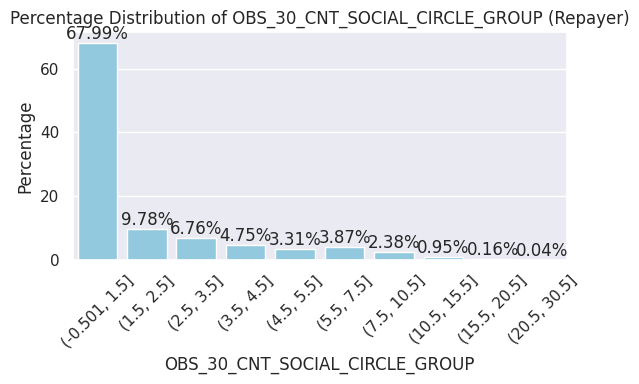

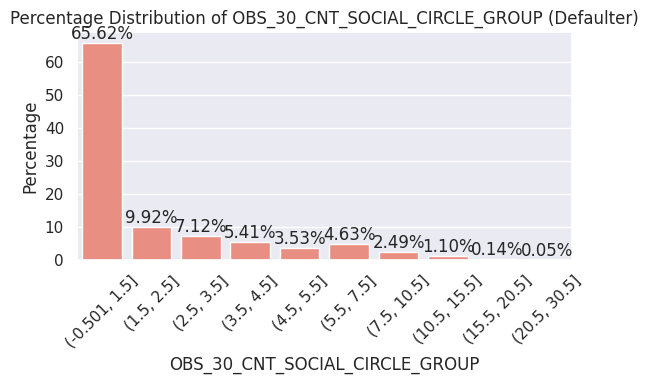

In [296]:
plot_percentage_distribution(combined_df, 'OBS_30_CNT_SOCIAL_CIRCLE_GROUP',(6,4))

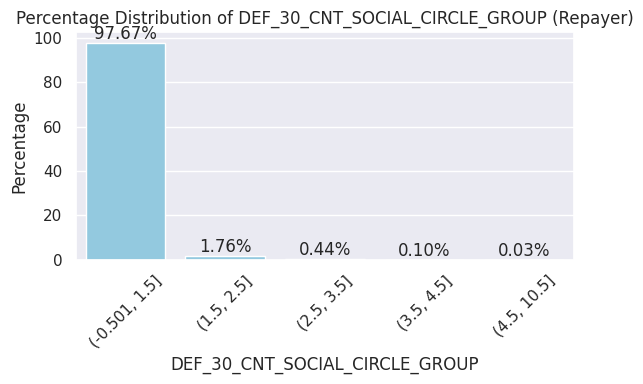

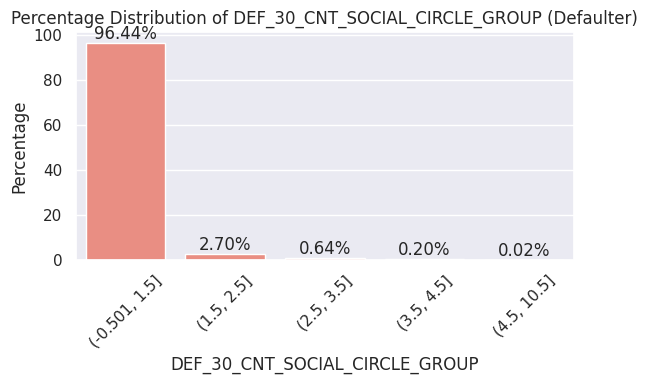

In [297]:
plot_percentage_distribution(combined_df, 'DEF_30_CNT_SOCIAL_CIRCLE_GROUP',(6,4))

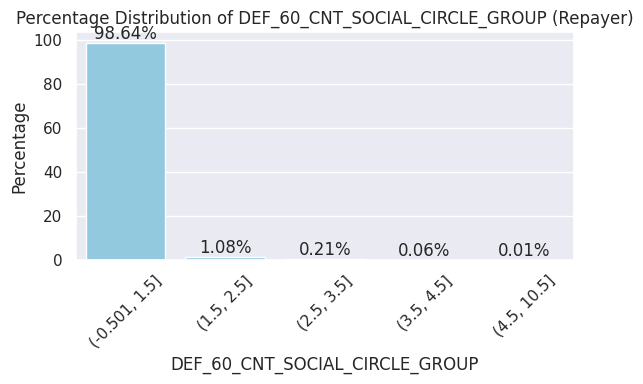

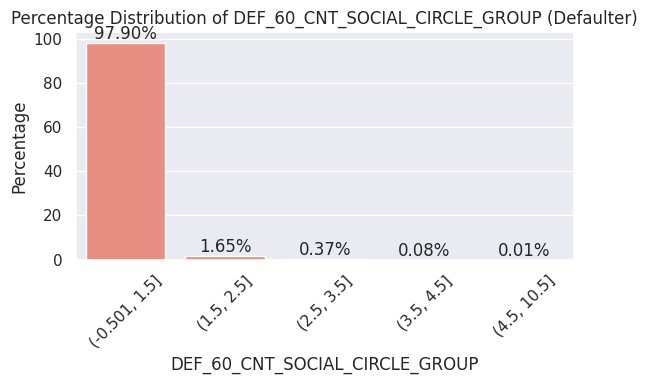

In [298]:
plot_percentage_distribution(combined_df, 'DEF_60_CNT_SOCIAL_CIRCLE_GROUP',(6,4))

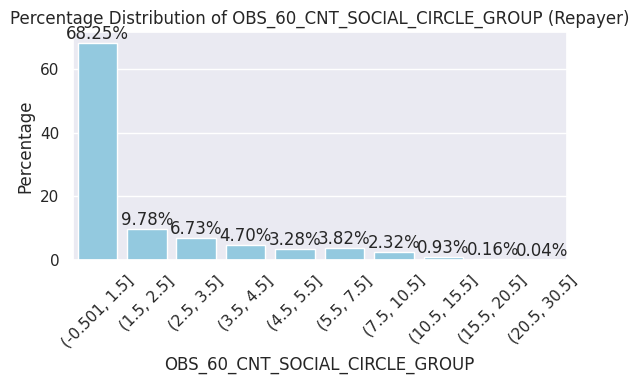

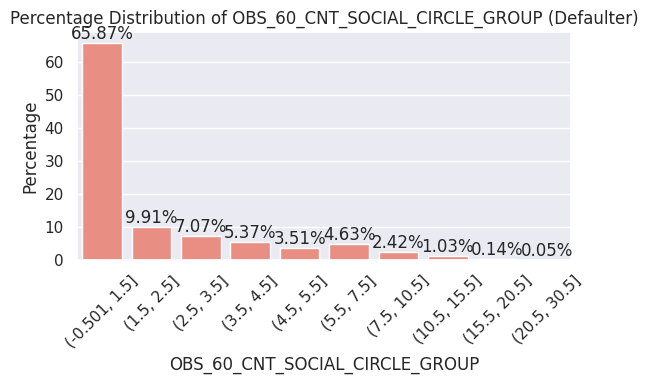

In [299]:
plot_percentage_distribution(combined_df, 'OBS_60_CNT_SOCIAL_CIRCLE_GROUP',(6,4))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>When defaulter in social group the above evident that there is a chance for applicant default</b></span>
</div>

In [300]:
combined_df[ 'OBS_60_CNT_SOCIAL_CIRCLE_GROUP'].unique()

[(1.5, 2.5], (-0.501, 1.5], (3.5, 4.5], (7.5, 10.5], (5.5, 7.5], (2.5, 3.5], (4.5, 5.5], (10.5, 15.5], (20.5, 30.5], (15.5, 20.5]]
Categories (10, interval[float64, right]): [(-0.501, 1.5] < (1.5, 2.5] < (2.5, 3.5] < (3.5, 4.5] ... (7.5, 10.5] < (10.5, 15.5] < (15.5, 20.5] < (20.5, 30.5]]

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:0;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 20px;border-style: solid;border-color: dark green;"> Document Details </div>

In [301]:
doc_col = ['FLAG_DOCUMENT_' + str(i) for i in range(2, 22)]

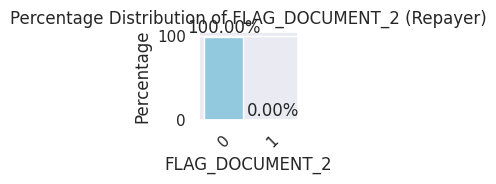

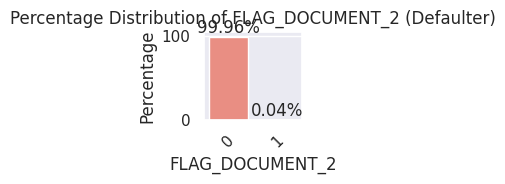

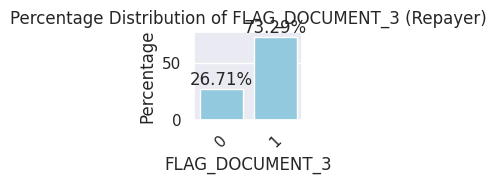

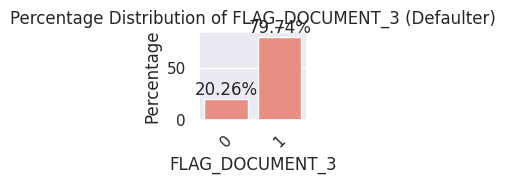

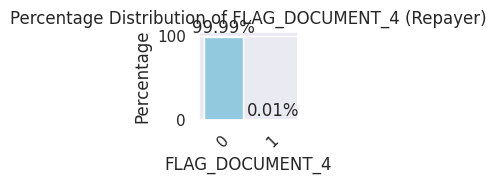

...

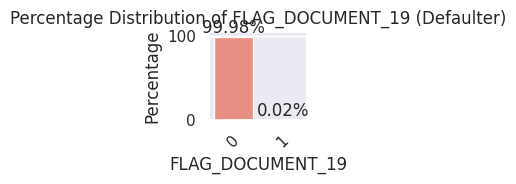

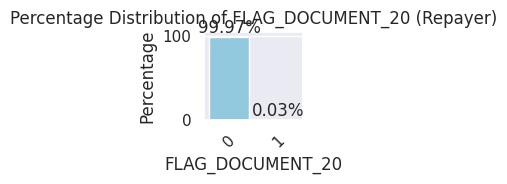

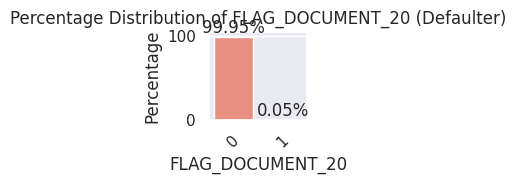

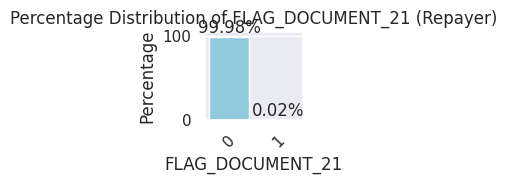

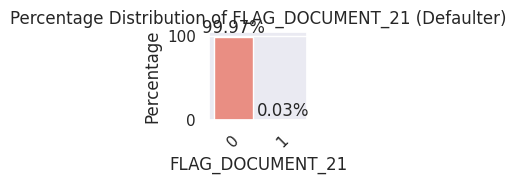

In [302]:
for col in doc_col:
    plot_percentage_distribution(combined_df, col,(2,2))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b> the default rate reduces when they submit more documents</b></span>
        </span>    
</div>

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:0;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 20px;border-style: solid;border-color: dark green;"> Property Details </div>

In [303]:
prop_col=['FONDKAPREMONT_MODE','HOUSETYPE_MODE','WALLSMATERIAL_MODE','EMERGENCYSTATE_MODE','TOTALAREA_MODE_GROUP']

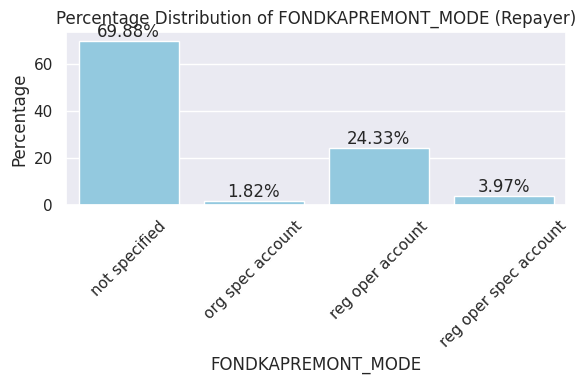

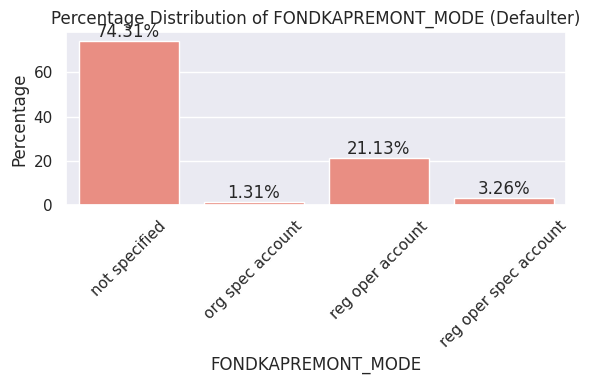

In [304]:
plot_percentage_distribution(combined_df, 'FONDKAPREMONT_MODE')

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>there is no siginificance impact for default</b></span>
</div>

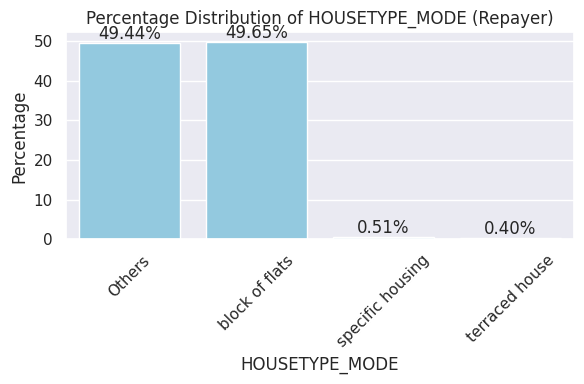

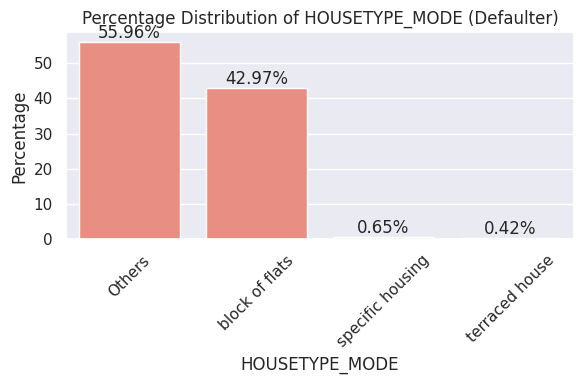

In [305]:
plot_percentage_distribution(combined_df, 'HOUSETYPE_MODE')

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>there is no siginificance impact for default</b></span>
</div>

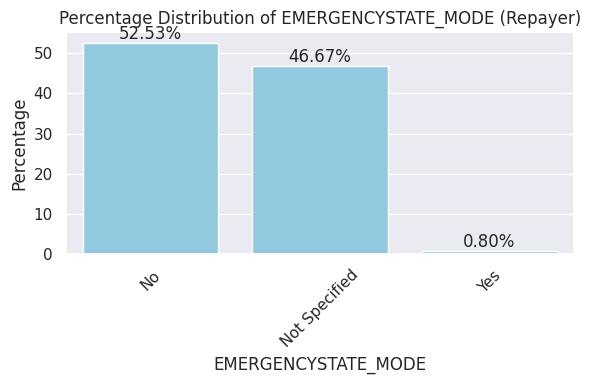

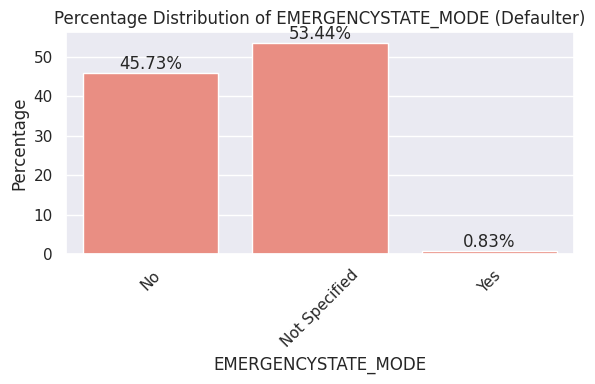

In [306]:
plot_percentage_distribution(combined_df, 'EMERGENCYSTATE_MODE')

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>there is no siginificance impact for default</b></span>
</div>

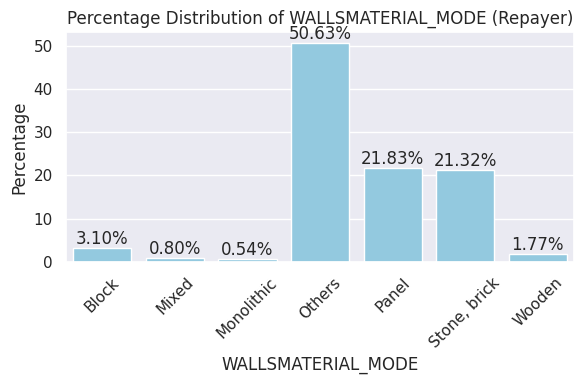

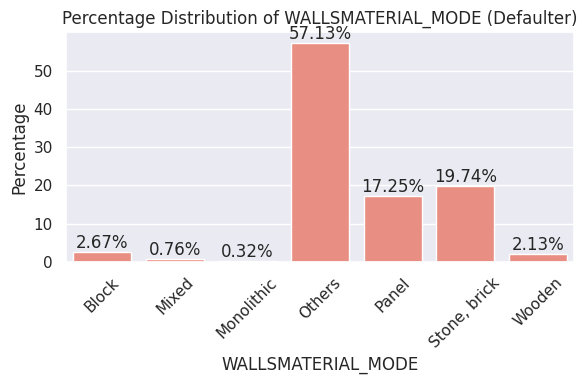

In [307]:
plot_percentage_distribution(combined_df, 'WALLSMATERIAL_MODE')

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>there is no siginificance impact for default</b></span>
</div>

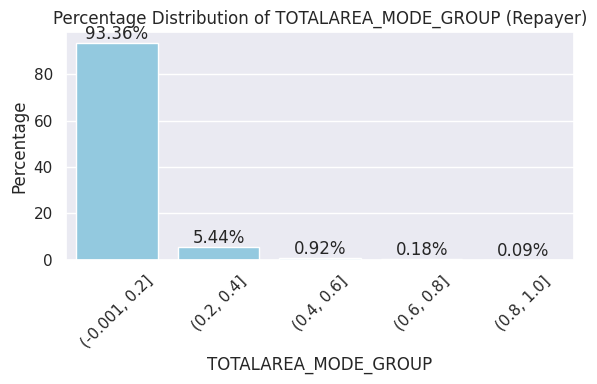

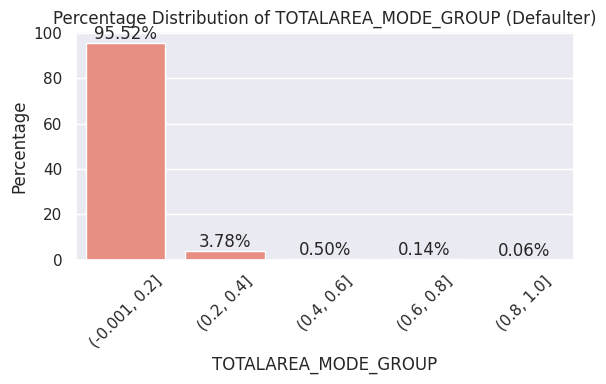

In [308]:
plot_percentage_distribution(combined_df, 'TOTALAREA_MODE_GROUP')

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>there is no siginificance impact for default</b></span>
</div>

## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:0;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 20px;border-style: solid;border-color: dark green;"> Previous Credit History </div>

In [309]:
pre_cre_col=['AMT_CREDIT_GROUP_PRE','AMT_ANNUITY_GROUP_PRE','AMT_APPLICATION_GROUP_PRE',
             'DOWNPAYMENT_PERCENTAGE_GROUP_PRE','DAYS_DECISION_RANGE_PRE','DAYS_FIRST_DRAWING_RANGE_PRE',
             'DAYS_FIRST_DUE_RANGE_PRE','DAYS_LAST_DUE_1ST_VERSION_RANGE_PRE','DAYS_LAST_DUE_RANGE_PRE','DAYS_TERMINATION_RANGE_PRE',
             'NFLAG_INSURED_ON_APPROVAL']

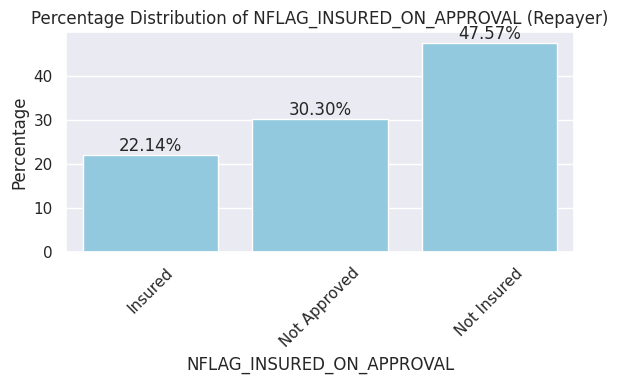

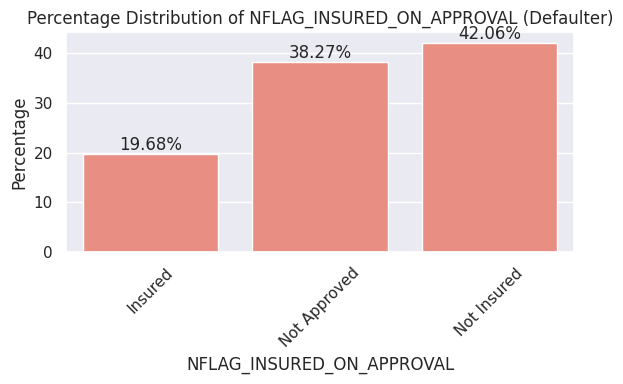

In [310]:
plot_percentage_distribution(combined_df, 'NFLAG_INSURED_ON_APPROVAL')

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>There are no significant insights regarding Insured types.</b></span>
        <br>
        <span style='color:green'><b>There is no significant insight on Insured types.</b></span>
    </span>    
</div>

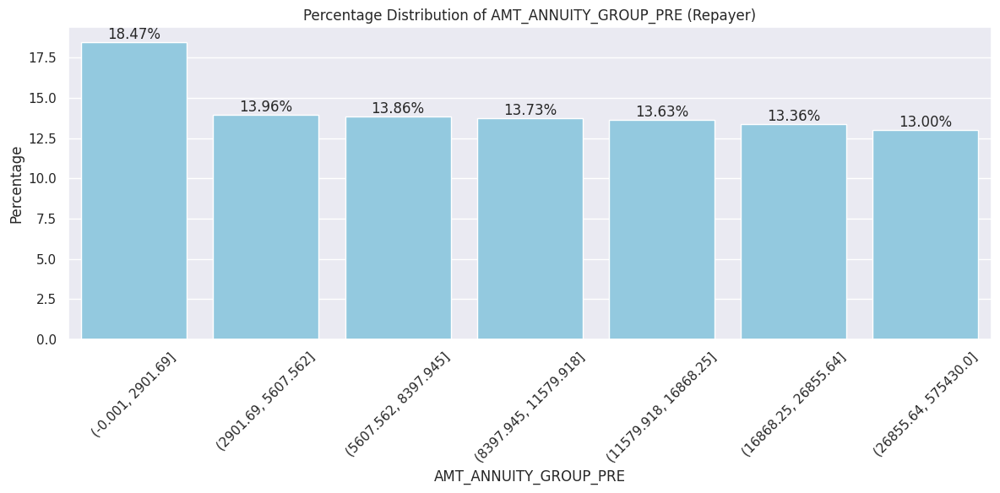

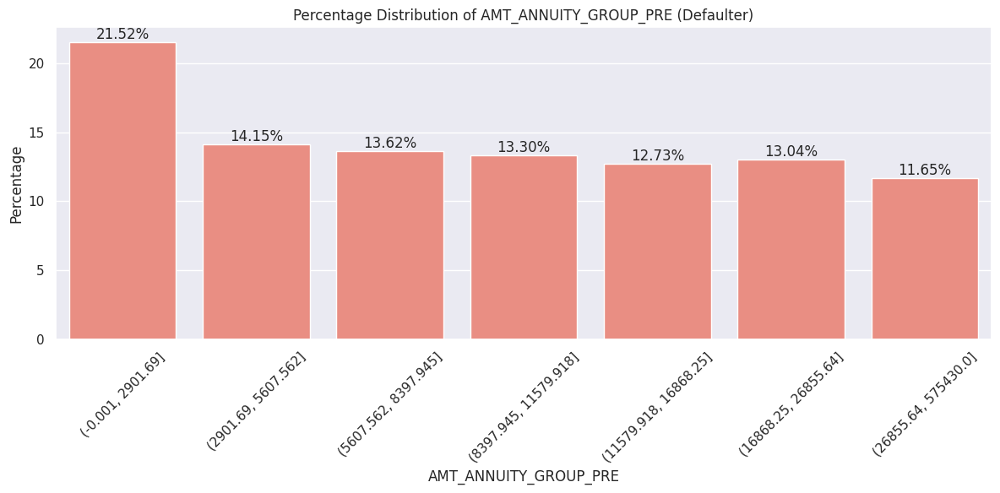

In [311]:
plot_percentage_distribution(combined_df, 'AMT_ANNUITY_GROUP_PRE', fig_size=(12, 6))

In [312]:
'''# Create interval objects
intervals = [pd.Interval(-0.001, 2901.69, closed='right'), pd.Interval(2901.69, 5607.562, closed='right')]
# Apply lambda function
combined_df['AMT_ANNUITY_GROUP_PRE'] = combined_df['AMT_ANNUITY_GROUP_PRE'].apply(lambda x: 2 if any(x in interval for interval in intervals) else 0)'''

"# Create interval objects\nintervals = [pd.Interval(-0.001, 2901.69, closed='right'), pd.Interval(2901.69, 5607.562, closed='right')]\n# Apply lambda function\ncombined_df['AMT_ANNUITY_GROUP_PRE'] = combined_df['AMT_ANNUITY_GROUP_PRE'].apply(lambda x: 2 if any(x in interval for interval in intervals) else 0)"

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>There are high chances of default when annuity amount is lower.</b></span>
        <br>
        <span style='color:green'><b>There are low chances of default when annuity amount is High.</b></span>
    </span>    
</div>

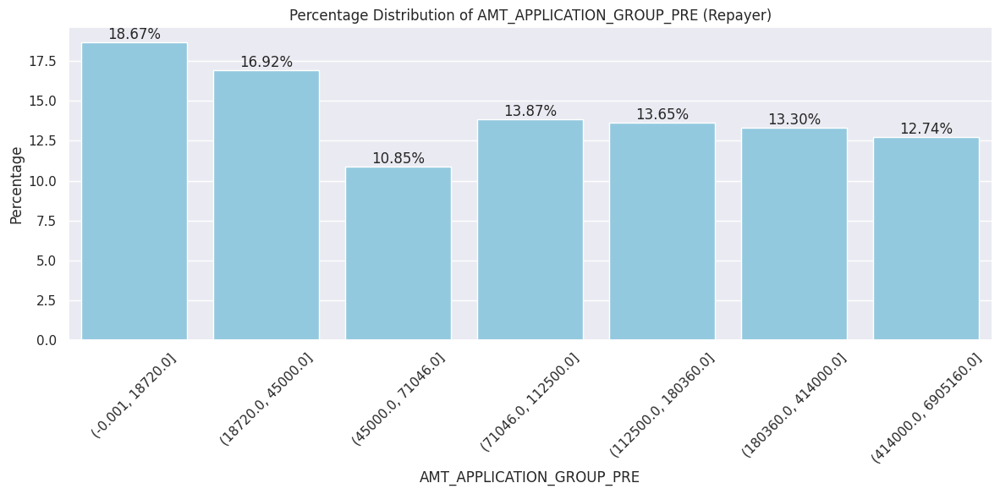

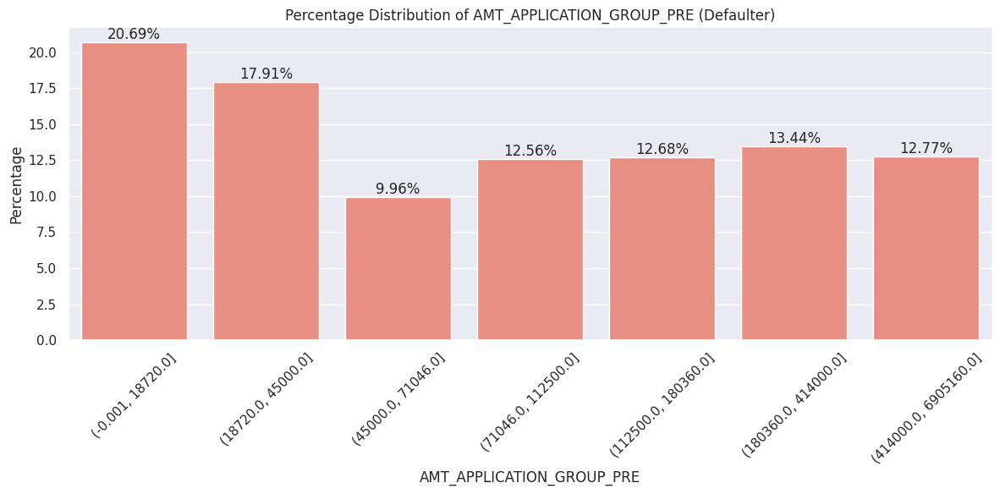

In [313]:
plot_percentage_distribution(combined_df, 'AMT_APPLICATION_GROUP_PRE',(12,6))

In [314]:
combined_df['AMT_APPLICATION_GROUP_PRE']=combined_df['AMT_APPLICATION_GROUP_PRE'].astype(str)
combined_df['AMT_APPLICATION_GROUP_PRE'].unique()

array(['(112500.0, 180360.0]', '(414000.0, 6905160.0]',
       '(180360.0, 414000.0]', '(45000.0, 71046.0]', '(18720.0, 45000.0]',
       '(-0.001, 18720.0]', '(71046.0, 112500.0]'], dtype=object)

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>There are less significant in default regarding Application Range below 45k.</b></span>
        <br>
        <span style='color:green'><b>There is no significant insight on Application Range.</b></span>
    </span>    
</div>

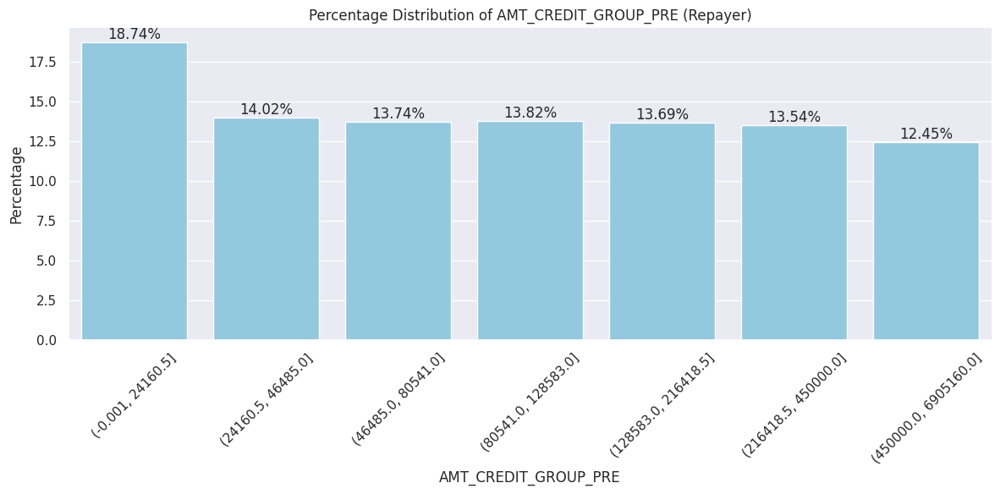

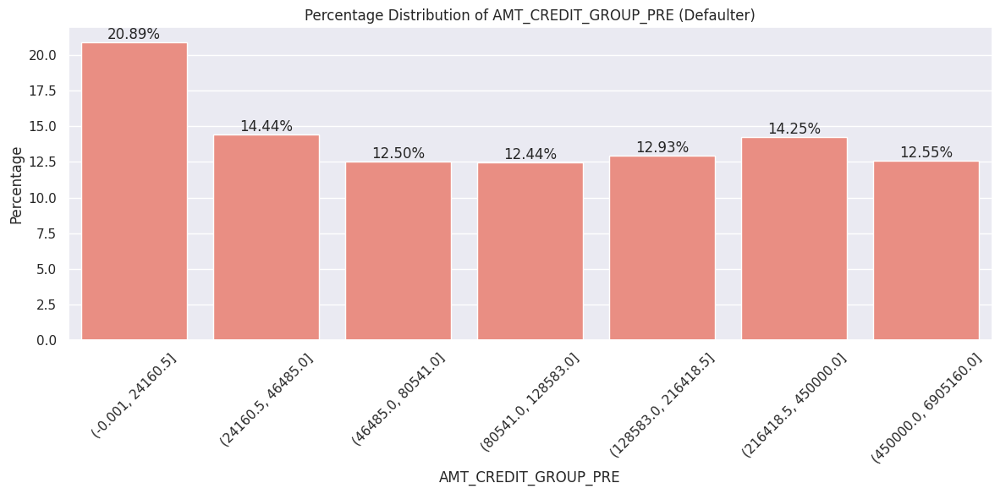

In [315]:
plot_percentage_distribution(combined_df, 'AMT_CREDIT_GROUP_PRE', fig_size=(12, 6))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>There is slight possible of default in the amount credit range of '45k' .</b></span>
        <br>
        <span style='color:green'><b>There is no significant insight on Previous Amount Credit Range.</b></span>
    </span>    
</div>

In [316]:
combined_df['AMT_CREDIT_GROUP_PRE']=combined_df['AMT_CREDIT_GROUP_PRE'].astype(str)
combined_df['AMT_CREDIT_GROUP_PRE'].unique()

array(['(128583.0, 216418.5]', '(450000.0, 6905160.0]',
       '(216418.5, 450000.0]', '(46485.0, 80541.0]', '(-0.001, 24160.5]',
       '(24160.5, 46485.0]', '(80541.0, 128583.0]'], dtype=object)

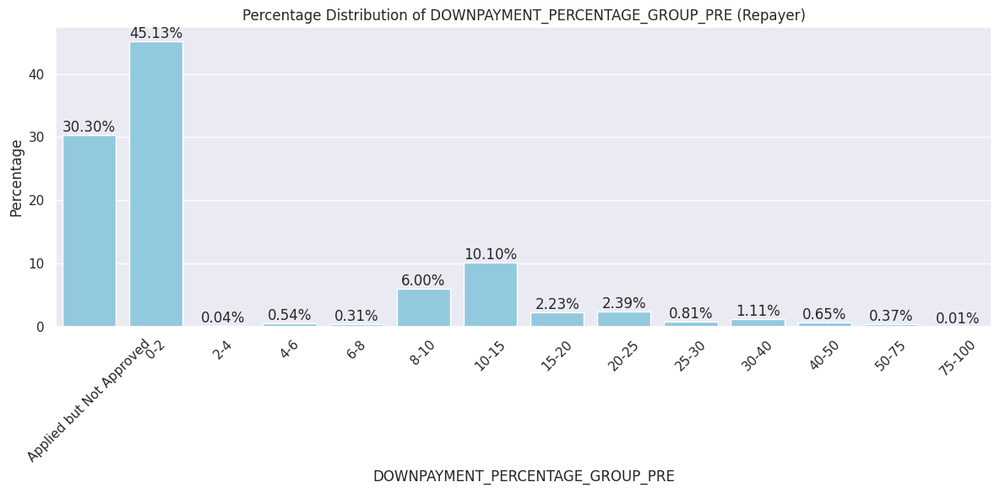

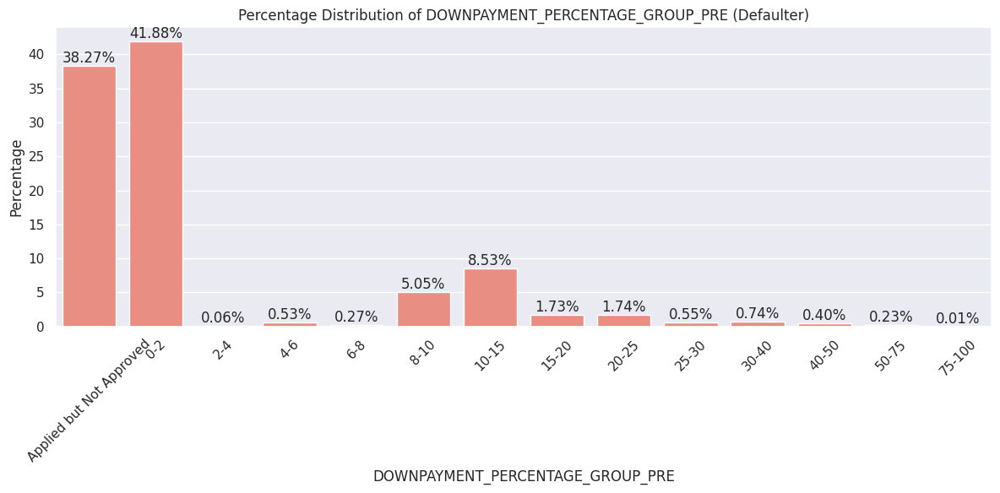

In [317]:
filtered_df=combined_df[combined_df['DAYS_FIRST_DUE_RANGE_PRE']!='Applied but Not Approved']
plot_percentage_distribution(filtered_df, 'DOWNPAYMENT_PERCENTAGE_GROUP_PRE',(12,6))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>There is slight possible of default in the Prev Down payment range of '0-2kk' .</b></span>
        <br>
        <span style='color:green'><b>There is no significant insight on Prev Down payment range.</b></span>
    </span>    
</div>

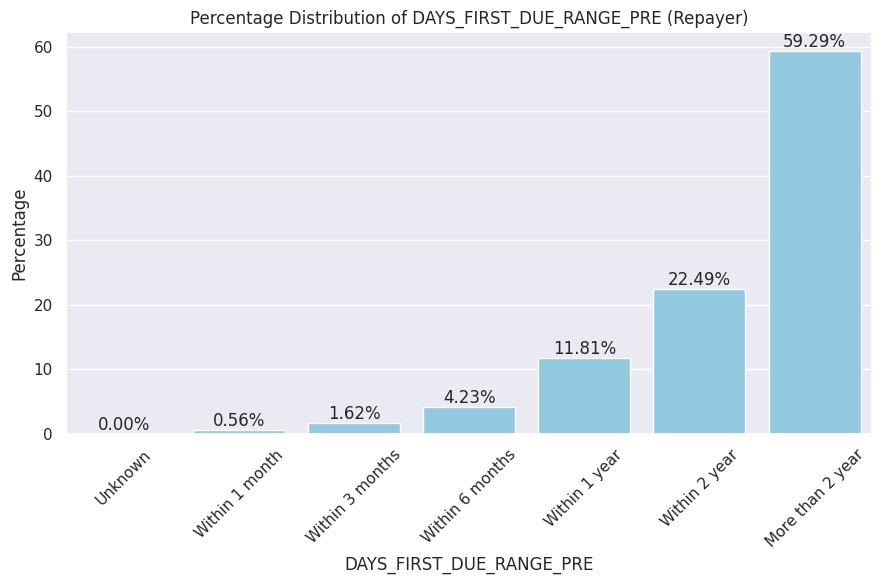

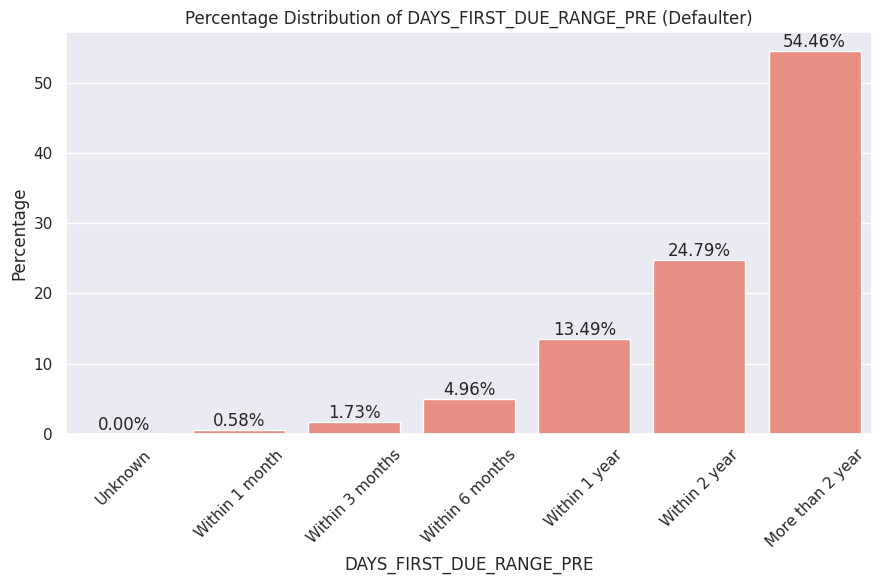

In [318]:
filtered_df=combined_df[combined_df['DAYS_FIRST_DUE_RANGE_PRE']!='Unknown']
plot_percentage_distribution(filtered_df, 'DAYS_FIRST_DUE_RANGE_PRE',(9,6))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>There is slight possible of default in the previous loan first due less than 2 year .</b></span>
        <br>
        <span style='color:green'><b>There is no significant insight on first Due range.</b></span>
    </span>    
</div>

In [319]:
#combined_df['AMT_CREDIT_GROUP_PRE']=combined_df['AMT_CREDIT_GROUP_PRE'].astype(str)
combined_df['DAYS_FIRST_DUE_RANGE_PRE'].unique()

['Within 2 year', 'More than 2 year', 'Within 6 months', 'Unknown', 'Within 1 year', 'Within 3 months', 'Within 1 month']
Categories (7, object): ['Unknown' < 'Within 1 month' < 'Within 3 months' < 'Within 6 months' < 'Within 1 year' < 'Within 2 year' < 'More than 2 year']

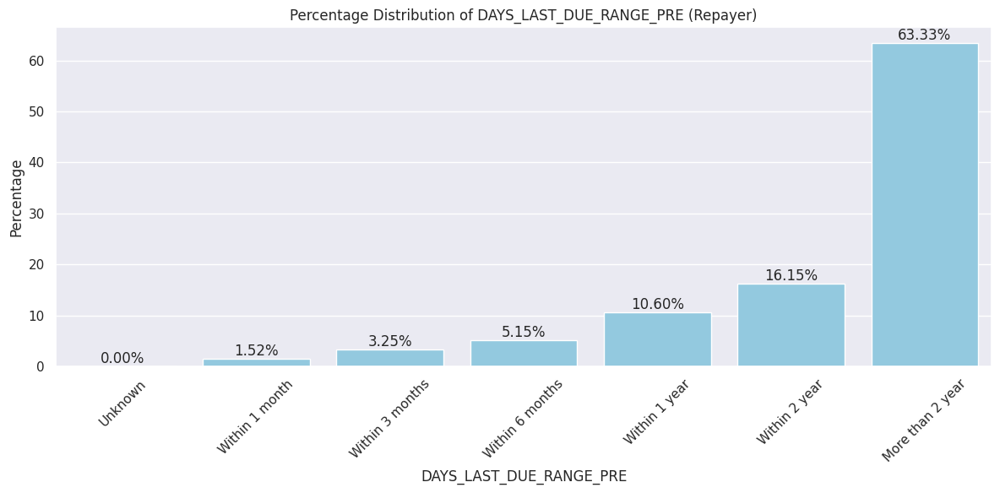

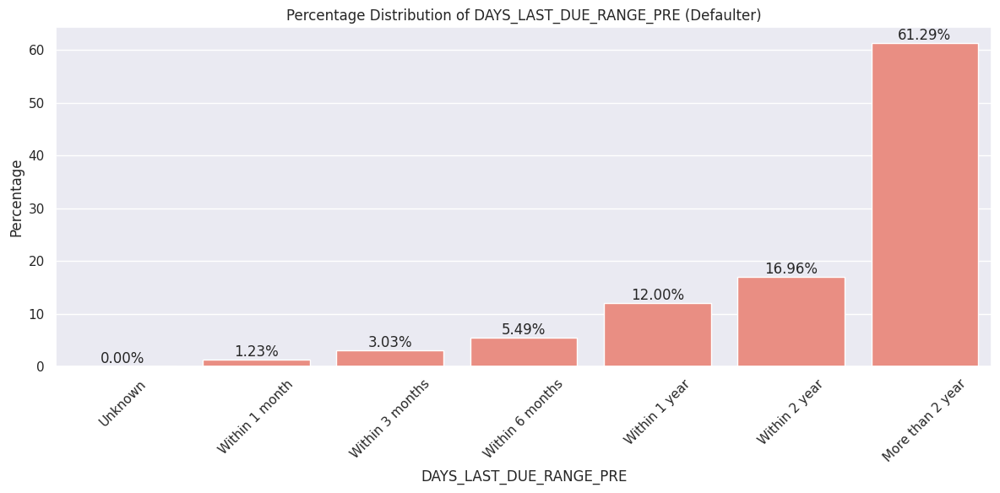

In [320]:
filtered_df=combined_df[combined_df['DAYS_LAST_DUE_RANGE_PRE']!='Unknown']
plot_percentage_distribution(filtered_df, 'DAYS_LAST_DUE_RANGE_PRE', fig_size=(12, 6))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>There is slight possible of default in the previous loan first due less than 2 year .</b></span>
        <br>
        <span style='color:green'><b>There is no significant insight on first Due range.</b></span>
    </span>    
</div>

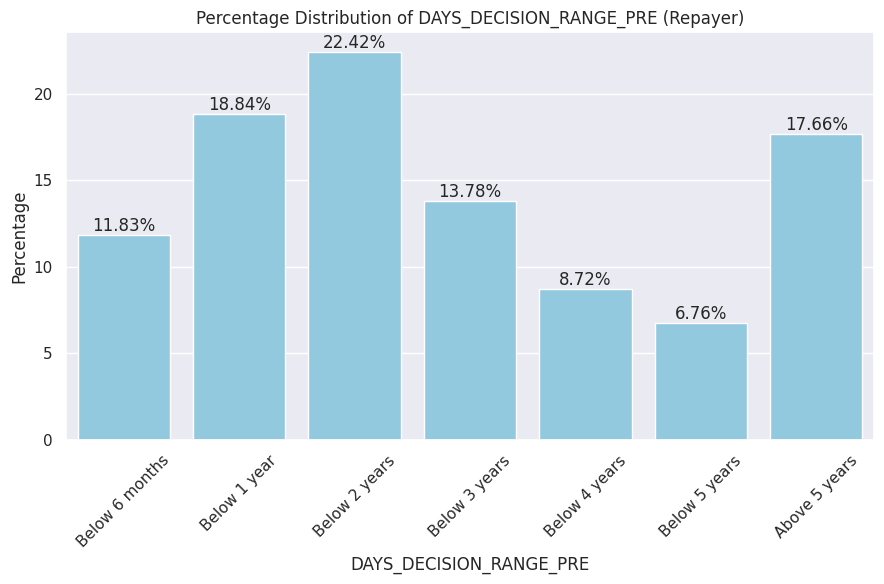

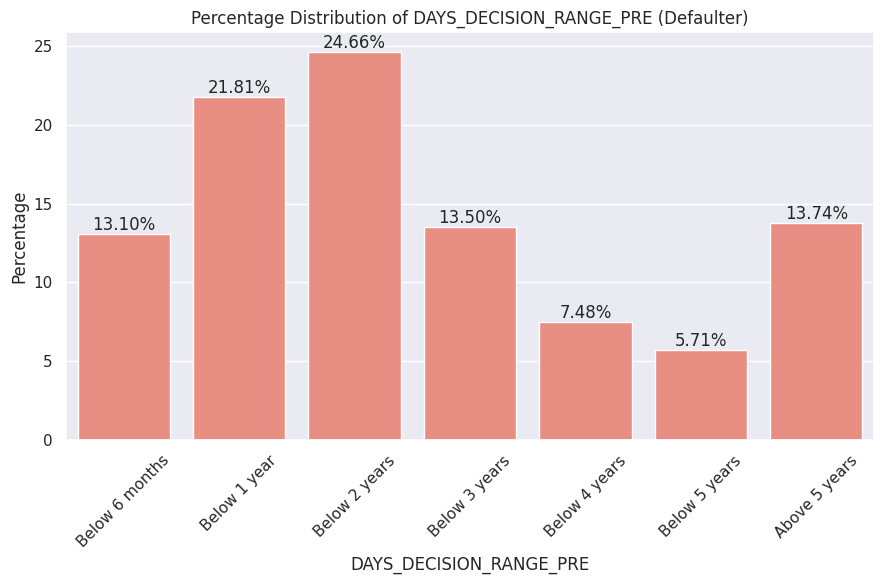

In [321]:
plot_percentage_distribution(combined_df, 'DAYS_DECISION_RANGE_PRE',(9,6))

In [322]:
combined_df['DAYS_DECISION_RANGE_PRE'].unique()

['Below 2 years', 'Below 3 years', 'Above 5 years', 'Below 1 year', 'Below 5 years', 'Below 4 years', 'Below 6 months']
Categories (7, object): ['Below 6 months' < 'Below 1 year' < 'Below 2 years' < 'Below 3 years' < 'Below 4 years' < 'Below 5 years' < 'Above 5 years']

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>There is high possible of default, in the Days Decision Range less than 2 year .</b></span>
        <br>
        <span style='color:green'><b>There is high possible of Repayment, in the Days Decision Range greater than 2 year ..</b></span>
    </span>    
</div>

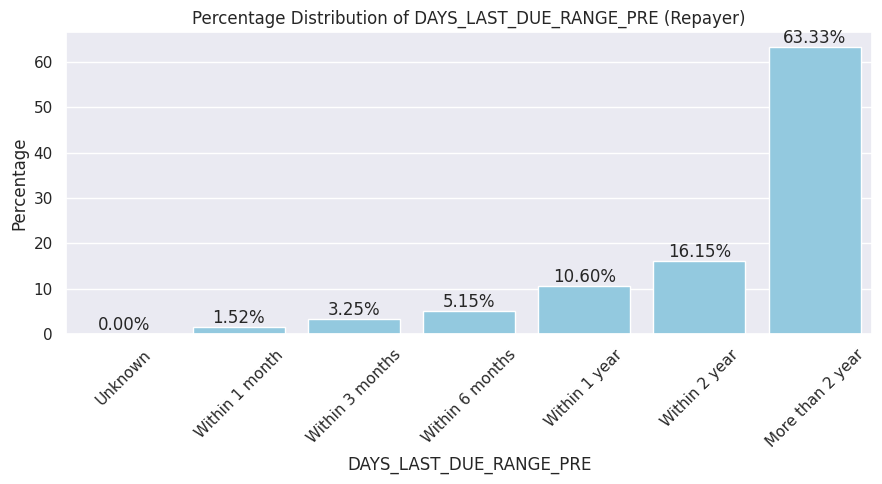

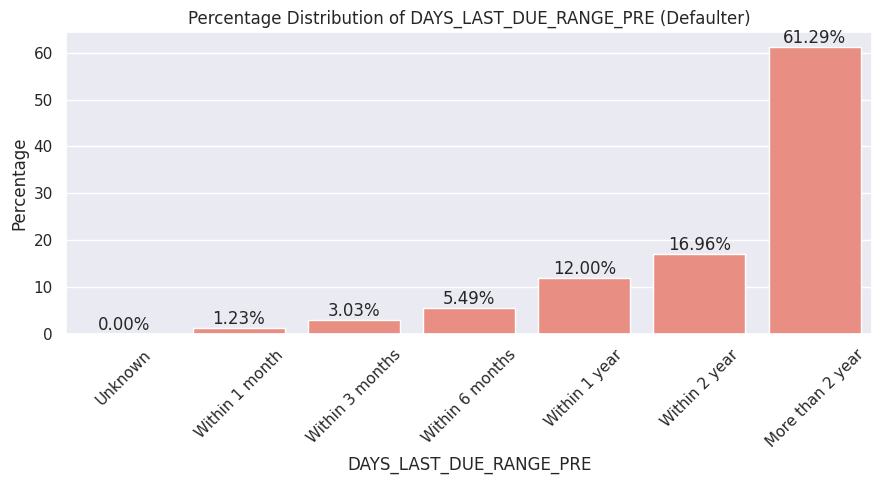

In [323]:
filtered_df=combined_df[combined_df['DAYS_LAST_DUE_RANGE_PRE']!='Unknown']
plot_percentage_distribution(filtered_df, 'DAYS_LAST_DUE_RANGE_PRE', fig_size=(9, 5))

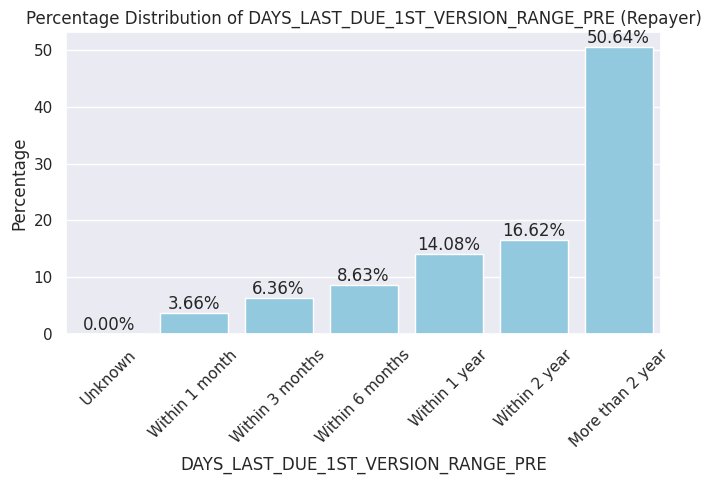

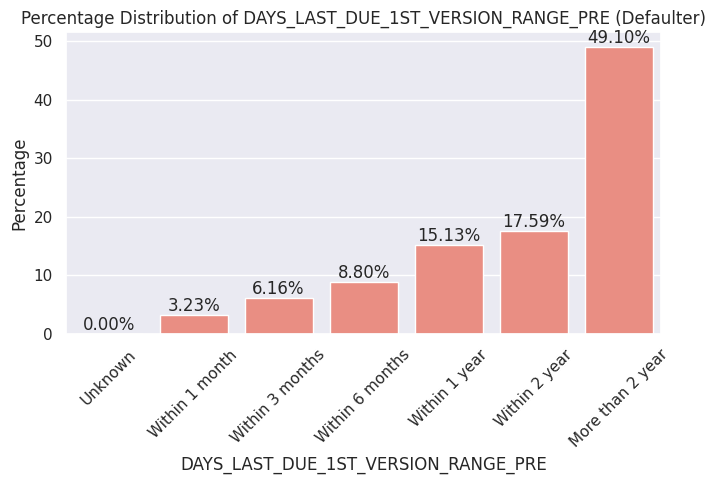

In [324]:
filtered_df=combined_df[combined_df['DAYS_LAST_DUE_1ST_VERSION_RANGE_PRE']!='Unknown']
plot_percentage_distribution(filtered_df, 'DAYS_LAST_DUE_1ST_VERSION_RANGE_PRE',(7,5))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>There is slight possible of default in the previous loan less than 1 year .</b></span>
        <br>
        <span style='color:green'><b>There is no significant insight on Last Due range.</b></span>
    </span>    
</div>

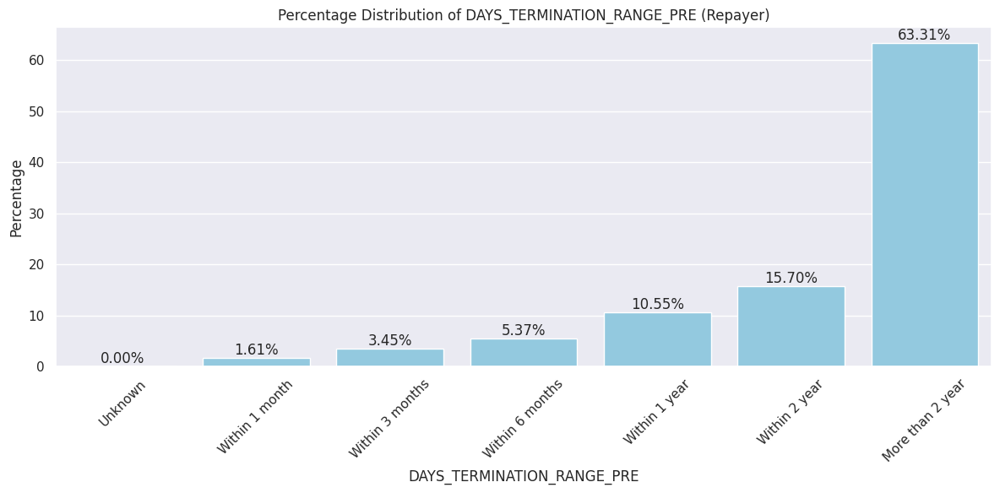

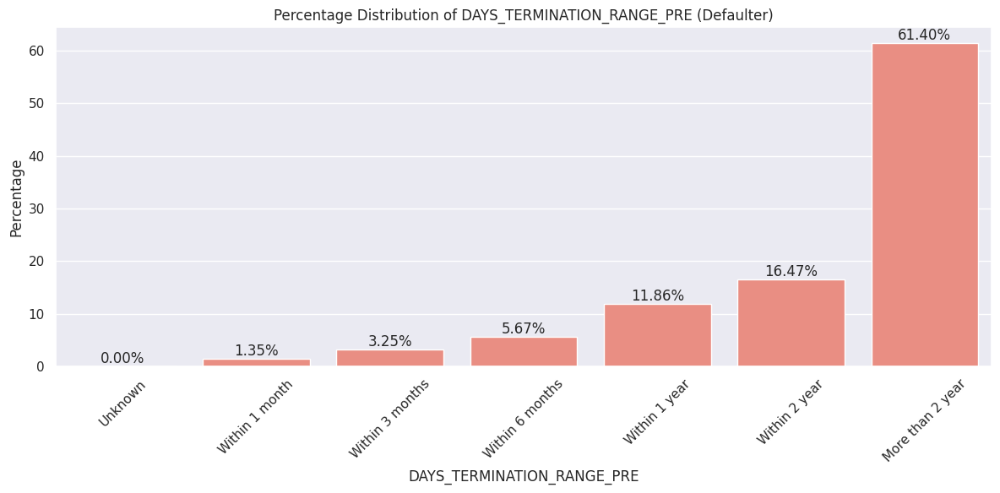

In [325]:
filtered_df=combined_df[combined_df['DAYS_TERMINATION_RANGE_PRE']!='Unknown']
plot_percentage_distribution(filtered_df, 'DAYS_TERMINATION_RANGE_PRE', fig_size=(12, 6))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>There are slight significant relation in days loan taken,days loan terminated is less than 2 year</b></span>
        <br>
            
</div>

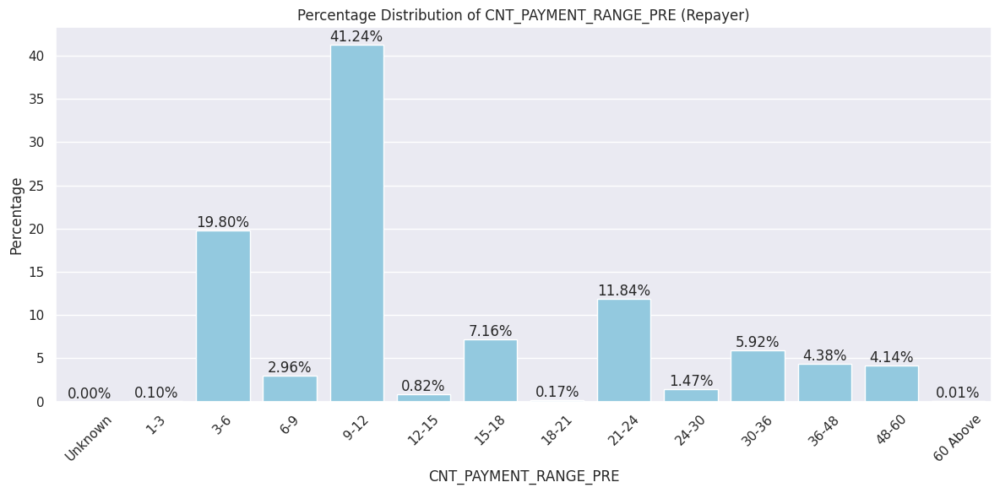

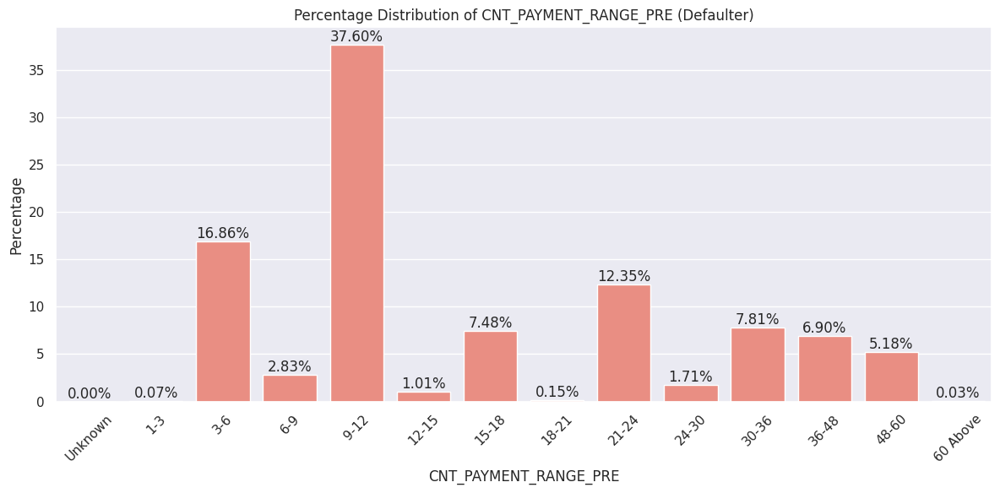

In [326]:
filtered_df=combined_df[combined_df['CNT_PAYMENT_RANGE_PRE']!='Unknown']
plot_percentage_distribution(filtered_df, 'CNT_PAYMENT_RANGE_PRE',(12,6))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>There is high possibility of default when tenure increses above(24 i.e 2years) </b></span>
        <br>
        <span style='color:green'><b>There is high possibility of Repayment when tenure below above 2years</b></span>
    </span>    
</div>

In [327]:
unique_values = combined_df['CNT_PAYMENT_RANGE_PRE'].unique().tolist()
print(unique_values)


['21-24', '9-12', '3-6', '36-48', 'Unknown', '15-18', '24-30', '6-9', '30-36', '48-60', '12-15', '18-21', '1-3', '60 Above']


## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:0;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 20px;border-style: solid;border-color: dark green;"> Contract Details-Previous </div>

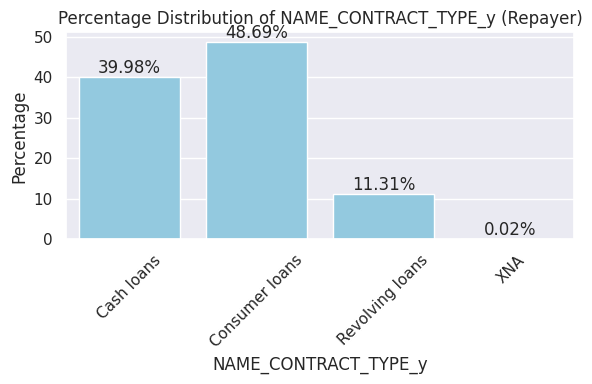

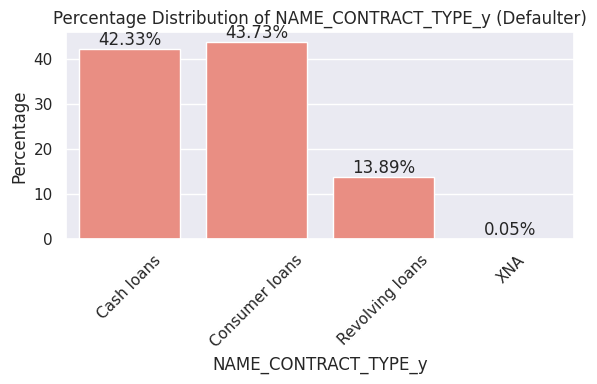

In [328]:
plot_percentage_distribution(combined_df, 'NAME_CONTRACT_TYPE_y')

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>The number of Defaulter Rate slightly increases for  Revolving and Cash Loans.</b></span>
        <br>
        <span style='color:green'><b>The number of Repayer Rate slightly increases for  Consumer Loans</b></span>
    </span>    
</div>

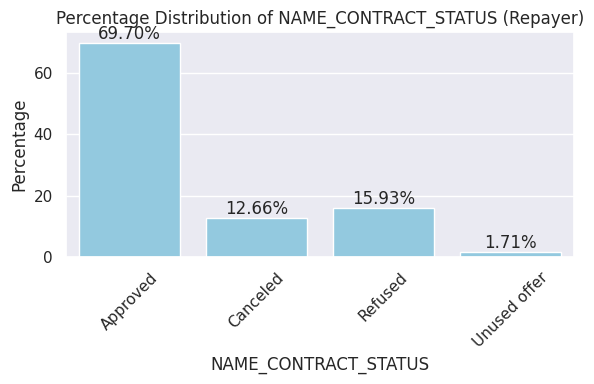

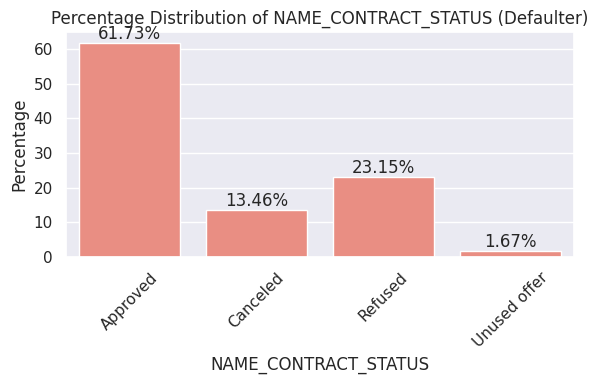

In [329]:
plot_percentage_distribution(combined_df, 'NAME_CONTRACT_STATUS', fig_size=(6, 4))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>The default rate is higher for the applicants previously refused.</b></span>
        <br>
        <span style='color:green'><b>The applicants previously approved pay correctly.</b></span>
    </span>    
</div>


## <div style="text-align: left; background-color:#CFD9F1 ; font-family: Trebuchet MS; color: #0A3399; padding: 15px; line-height:0;border-radius:1px; margin-bottom: 0em; text-align: center; font-size: 20px;border-style: solid;border-color: dark green;"> Credit Enquiries-Previous </div>

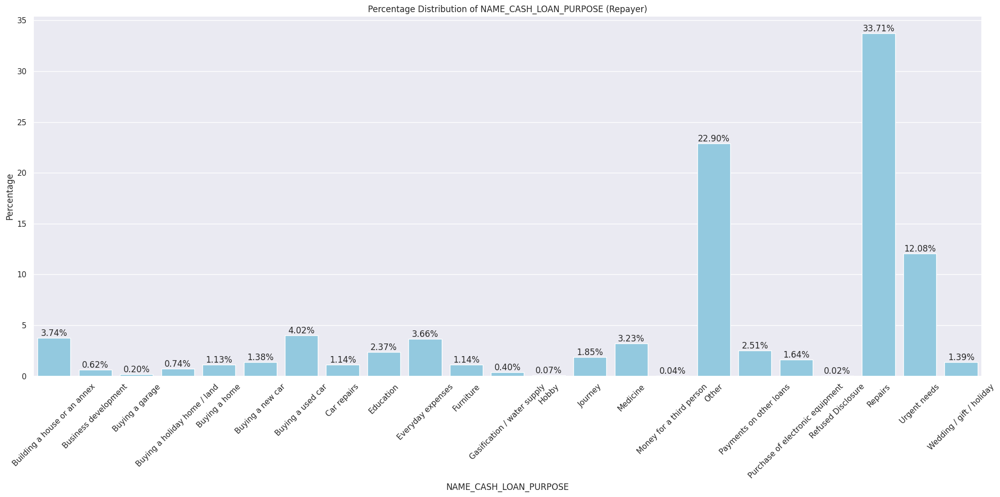

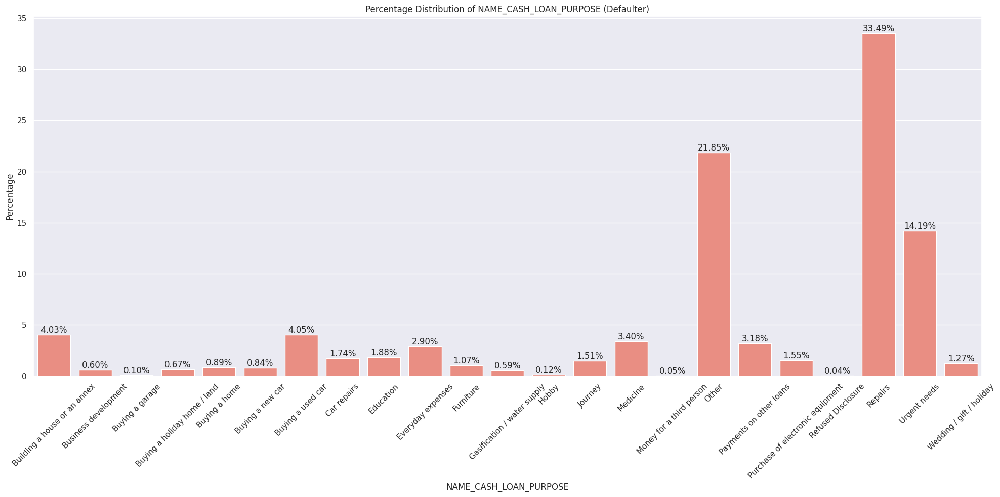

In [330]:
filtered_df = combined_df[(combined_df['NAME_CASH_LOAN_PURPOSE'] != 'Not Available') & (combined_df['NAME_CASH_LOAN_PURPOSE'] != 'Not Disclosed')]
plot_percentage_distribution(filtered_df, 'NAME_CASH_LOAN_PURPOSE', fig_size=(20, 10))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>The default rate is slightly higher for the purpose of 'Payments on other lon,'urgent Needs's.'</b></span>
        <br>
        <span style='color:green'><b>There is no significant difference for the purpose of the loan.</b></span>
    </span>    
</div>


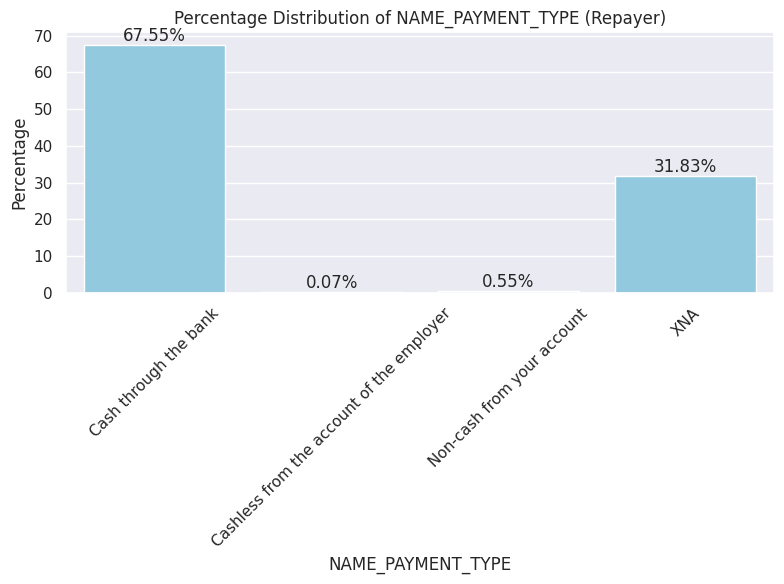

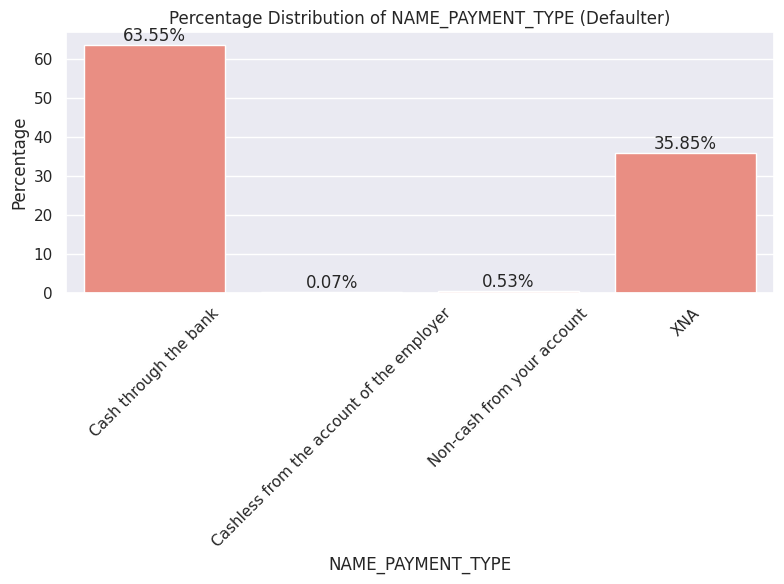

In [331]:
plot_percentage_distribution(combined_df, 'NAME_PAYMENT_TYPE',(8,6))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>There are no significant insights regarding payment typonly XNA shows default ratees.</b></span>
        <br>
        <span style='color:green'><b>There is no significant insight on payment types.</b></span>
    </span>    
</div>


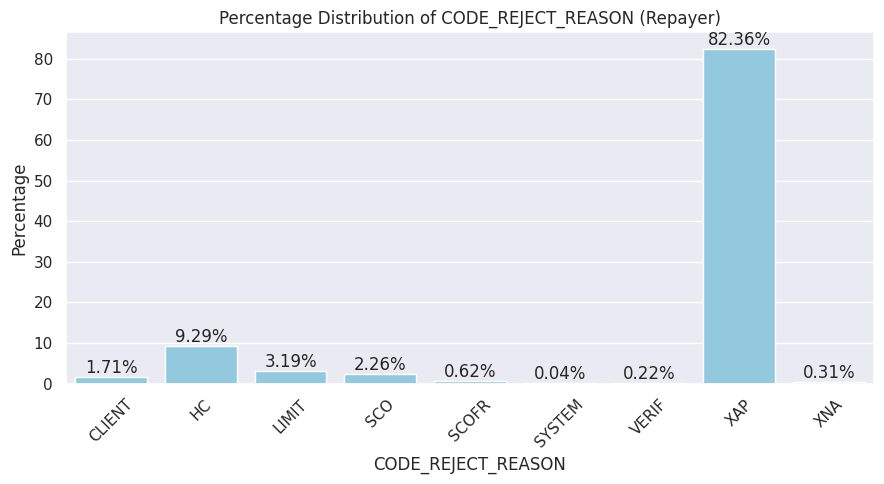

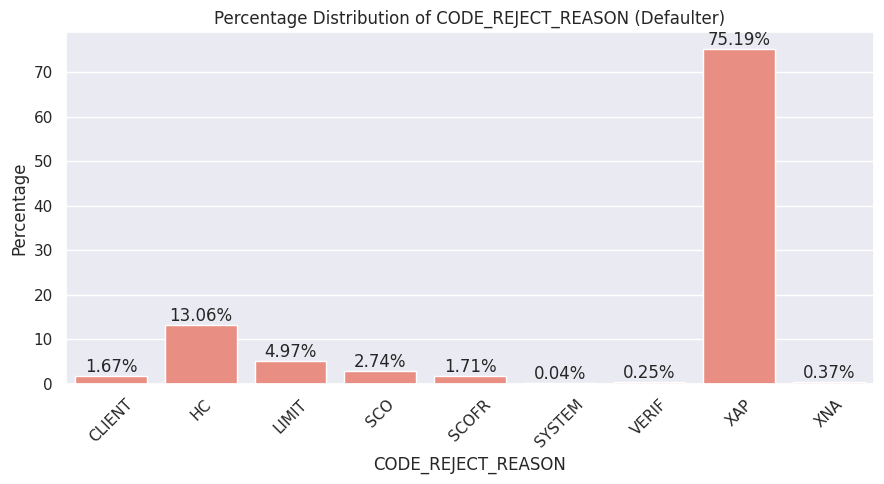

In [332]:
plot_percentage_distribution(combined_df, 'CODE_REJECT_REASON', fig_size=(9, 5))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>The previously rejected applicants based on the code HC & LIMIT show a higher default rate.</b></span>
        <br>
        <span style='color:green'><b>Previously rejected applicants based on the code XAP show better repayment.</b></span>
    </span>    
</div>

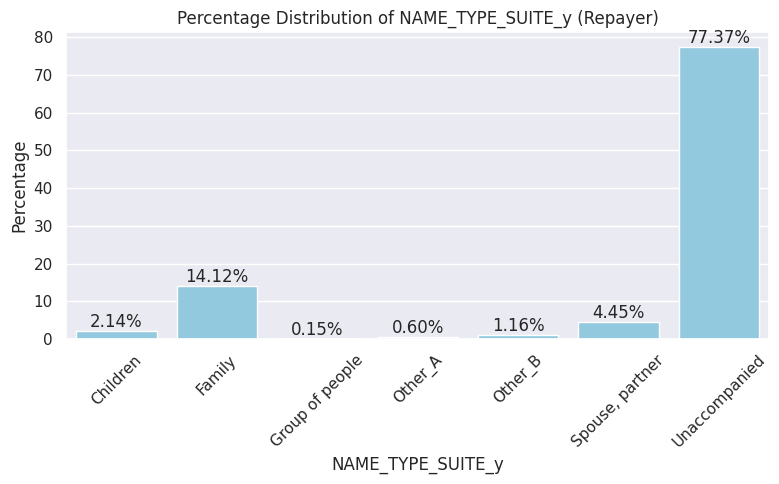

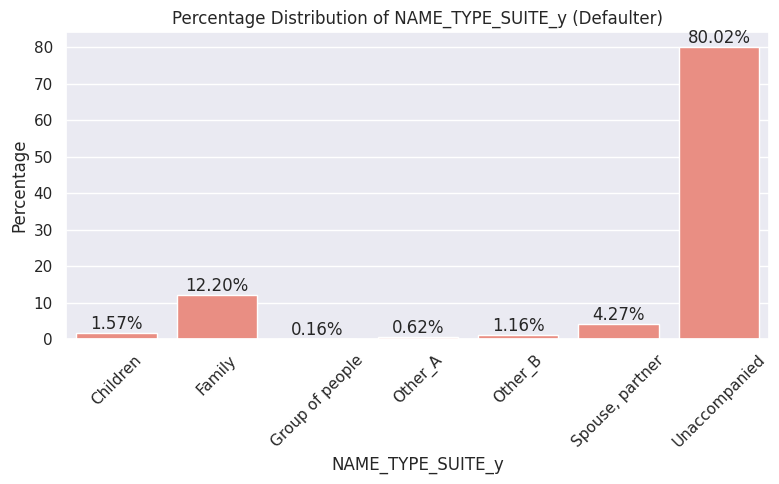

In [333]:
plot_percentage_distribution(combined_df, 'NAME_TYPE_SUITE_y',(8,5))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>The Loan taken as 'Unccompanied' shows higher default rate.</b></span>
        <br>
        <span style='color:green'><b>The loan taken with family and group of people shows better repayment</b></span>
    </span>    
</div>

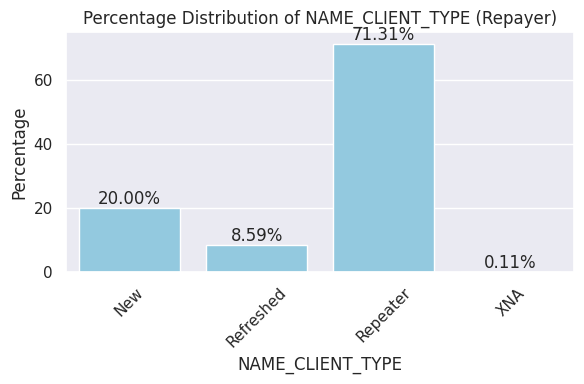

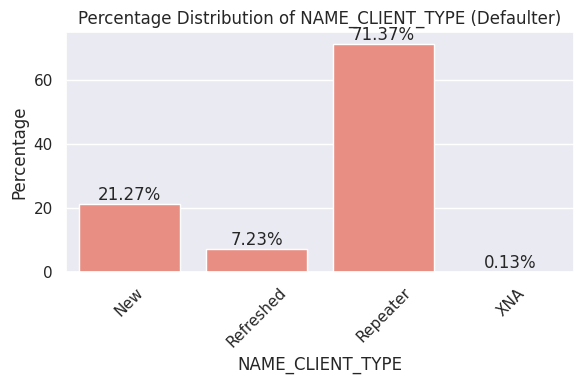

In [334]:
plot_percentage_distribution(combined_df, 'NAME_CLIENT_TYPE', fig_size=(6, 4))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>There are no significant insights regarding client types on previous history.</b></span>
        <br>
        <span style='color:green'><b>There is no significant insight on client types.</b></span>
    </span>    
</div>

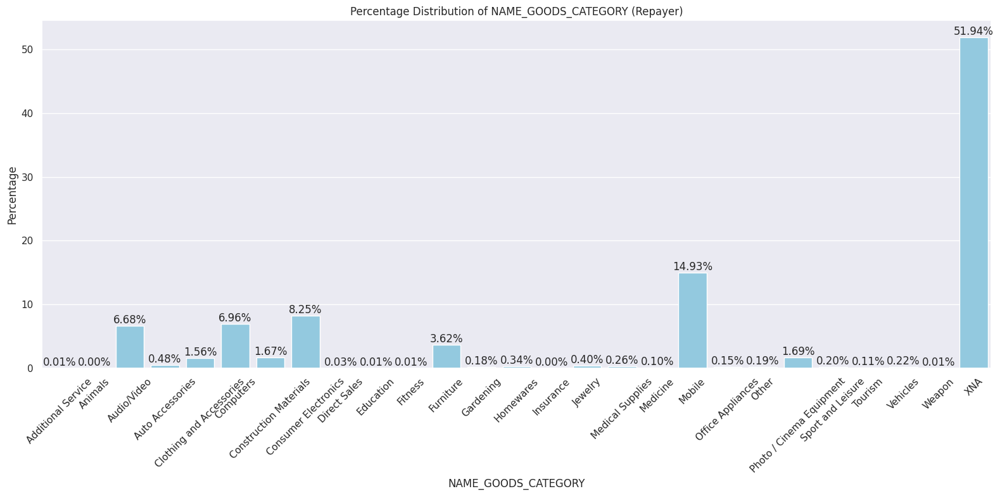

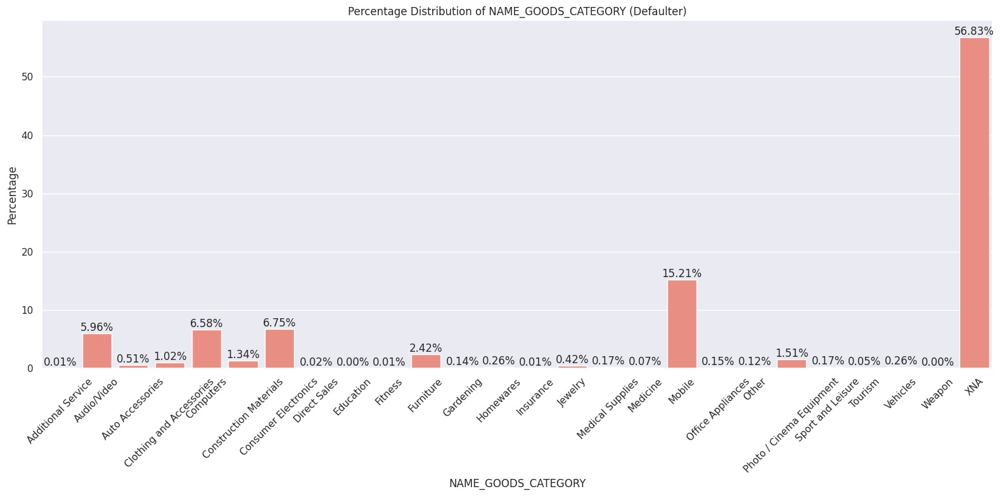

In [335]:
plot_percentage_distribution(combined_df, 'NAME_GOODS_CATEGORY',(16,8))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>There are no significant insights regarding Goods category on previous history.only XNA</b></span>
        <br>
        <span style='color:green'><b>There is no significant insight on Goods category types.</b></span>
    </span>    
</div>

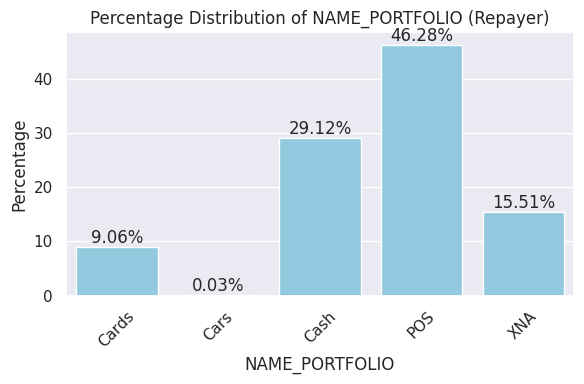

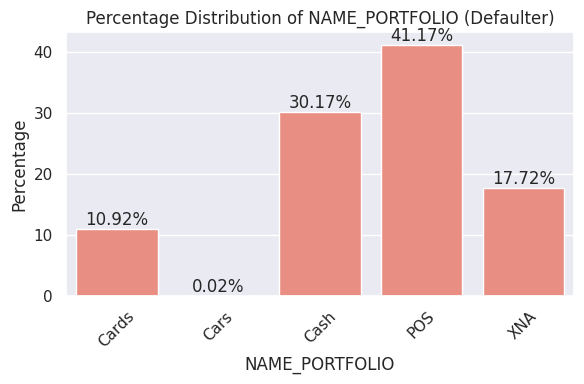

In [336]:
plot_percentage_distribution(combined_df, 'NAME_PORTFOLIO', fig_size=(6, 4))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>There are little significant in cards and cash payment regarding NAME_PORTFOLIO on previous history.</b></span>
        <br>
        <span style='color:green'><b>There is no significant insight on NAME_PORTFOLIO types.</b></span>
    </span>    
</div>

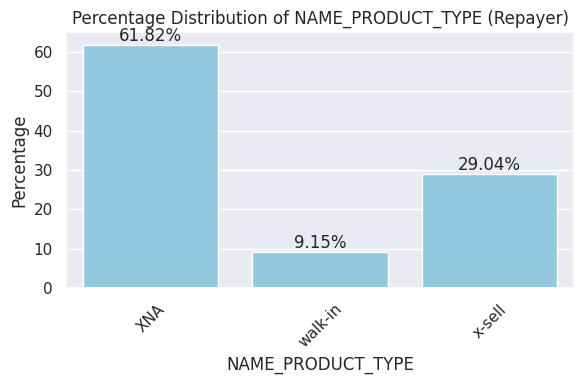

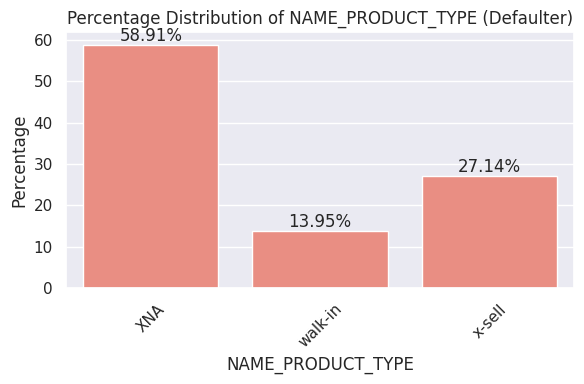

In [337]:
plot_percentage_distribution(combined_df, 'NAME_PRODUCT_TYPE')

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>There walkin type of product has higher default rate compared to others</b></span>
    </span>    
</div>

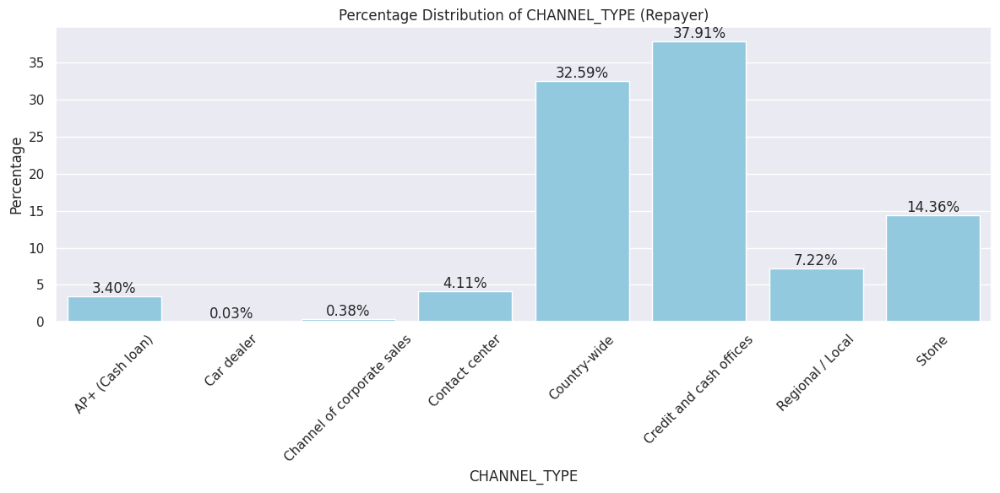

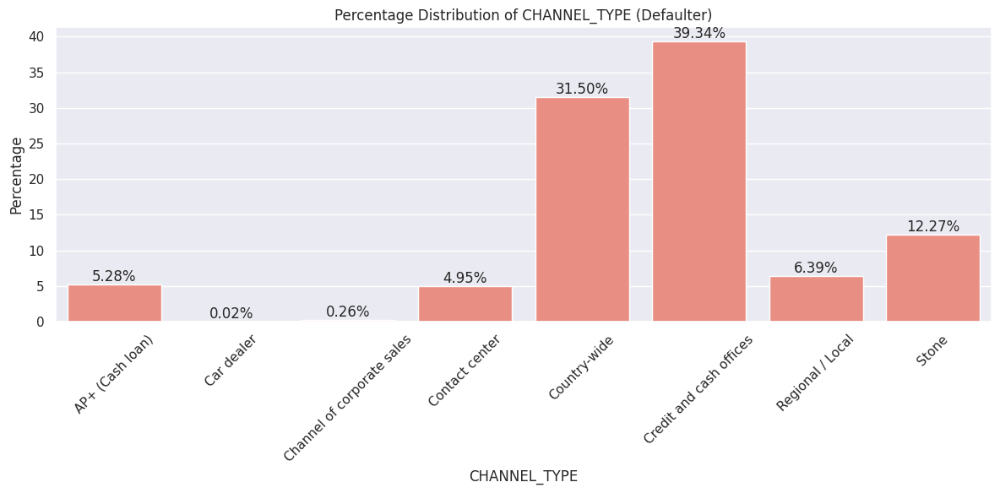

In [338]:
plot_percentage_distribution(combined_df, 'CHANNEL_TYPE', fig_size=(12, 6))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>The default rate is higher for AP+Cash loan channel type and credit & cash offices </b></span>
    </span>    
</div>

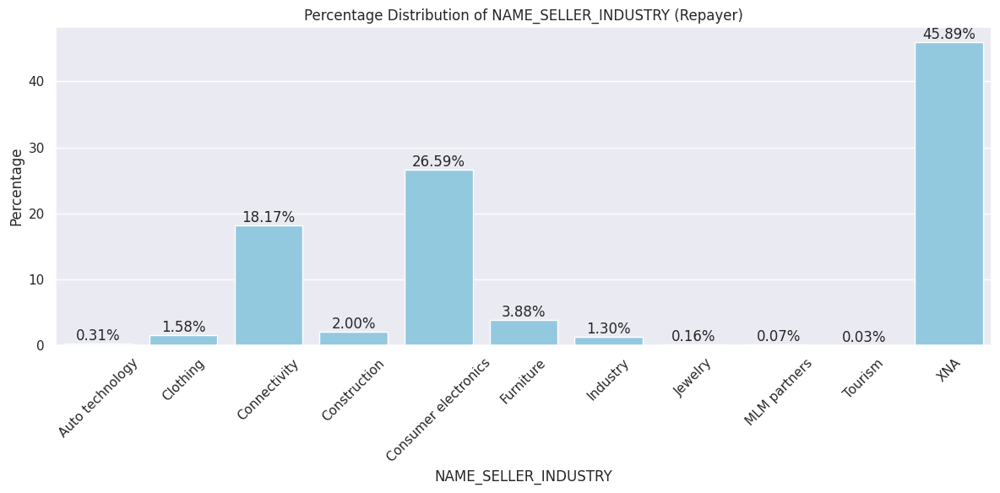

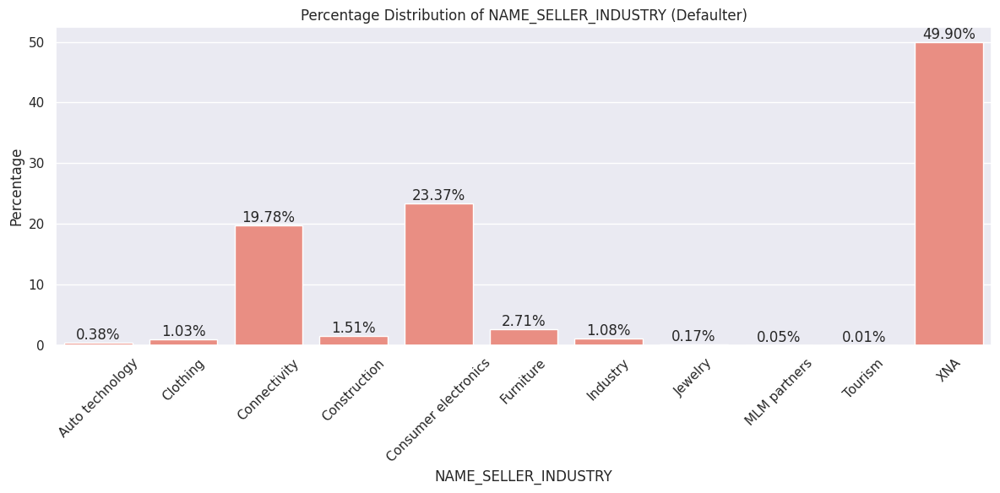

In [339]:
plot_percentage_distribution(combined_df, 'NAME_SELLER_INDUSTRY',(12,6))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>The default rate is higher for seller industry XNA.</b></span>
    </span>    
</div>

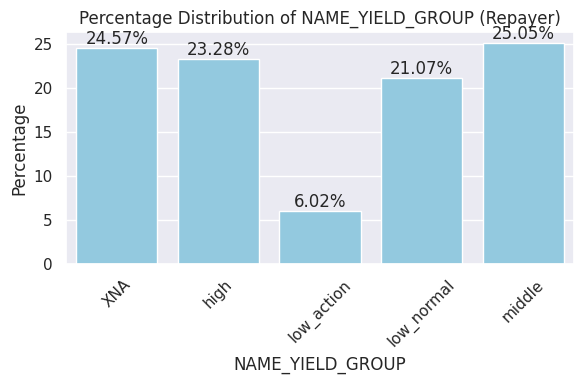

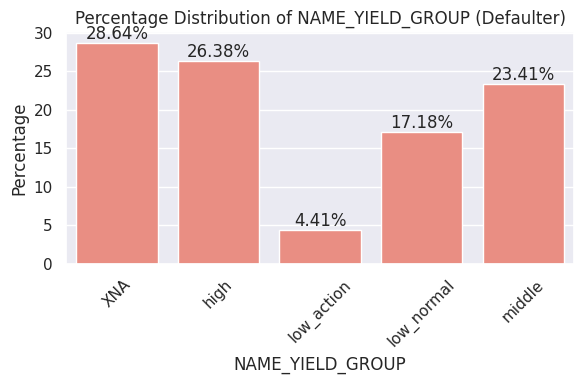

In [340]:
plot_percentage_distribution(combined_df, 'NAME_YIELD_GROUP', fig_size=(6, 4))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>There are chances of high default for XNA and high yield Group.</b></span>
</div>

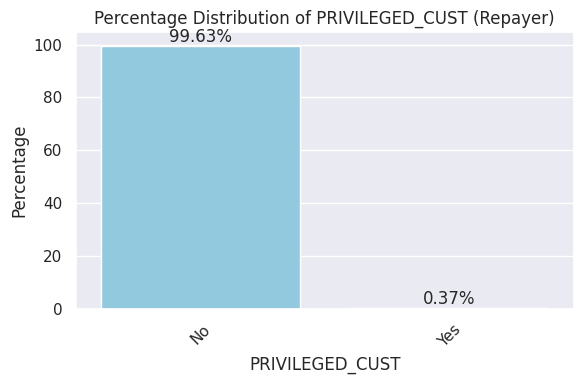

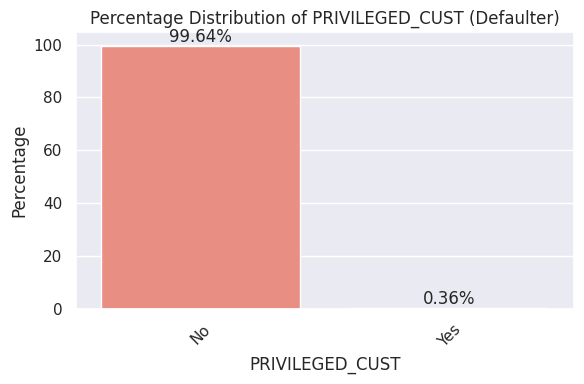

In [341]:
plot_percentage_distribution(combined_df, 'PRIVILEGED_CUST', fig_size=(6, 4))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>There are no previliged customer category on previous history.</b></span>
        <br>
        <span style='color:green'><b>There is no significant insight on previliged customer category  types.</b></span>
    </span>    
</div>

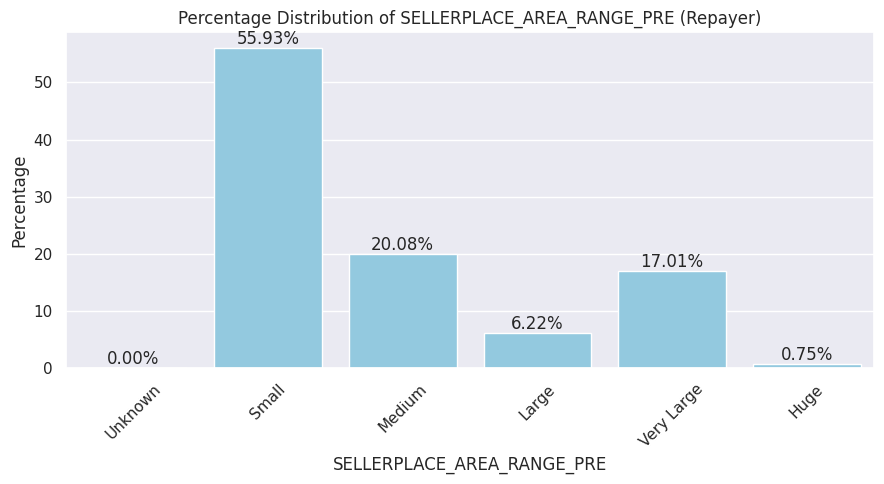

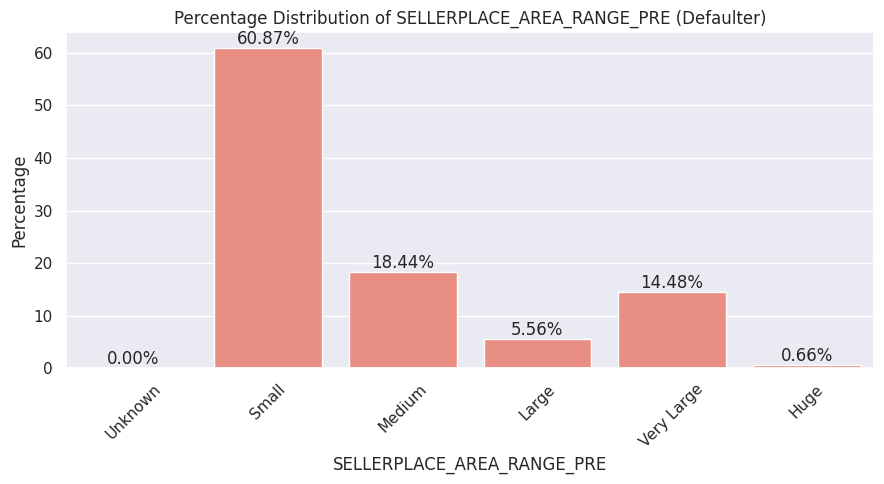

In [342]:
filtered_df=combined_df[combined_df['SELLERPLACE_AREA_RANGE_PRE']!='Unknown']
plot_percentage_distribution(filtered_df, 'SELLERPLACE_AREA_RANGE_PRE', fig_size=(9, 5))

<div class="alert alert-block alert-info">
    <span style='font-family:Georgia'>
        <b>Inferences: </b> <br>
        <span style='color:blue'><b>The default rate when loan seller area is small.</b></span>
    </span>    
</div>

<div id="custom-header" style="padding: 0px; color: white; margin: 0; font-size: 22px; font-family: 'Times New Roman', Times, serif; text-align: center; display: fill; border-radius: 10px; background-color: #6D214F; overflow: hidden; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);">
    <b> Feature Engineering </b>
</div>

### Previous Credit Enquiries

In [343]:
combined_df['NAME_CONTRACT_STATUS']=combined_df['NAME_CONTRACT_STATUS'].apply(lambda x: 1 if x =='Canceled' or
                                                                                  x =='Refused'  else 0)
combined_df['NAME_CONTRACT_TYPE_y']=combined_df['NAME_CONTRACT_TYPE_y'].apply(lambda x: 1 if x =='Cash loans' or
                                                                                  x =='Revolving loans'  else 0)
combined_df['NAME_CASH_LOAN_PURPOSE']=combined_df['NAME_CASH_LOAN_PURPOSE'].apply(lambda x: 1 if x =='Payments on other loans' or
                                                                                  x =='Urgent needs' or x =='Medicine' else 0)
combined_df['NAME_PAYMENT_TYPE']=combined_df['NAME_PAYMENT_TYPE'].apply(lambda x: 1 if x =='XNA' else 0)
combined_df['CODE_REJECT_REASON'] = combined_df['CODE_REJECT_REASON'].apply(lambda x: 2 if x == 'HC' or x == 'LIMIT' else (1 if x == 'SCO' or x == 'SCOFR' else 0))
combined_df['NAME_GOODS_CATEGORY']=combined_df['NAME_GOODS_CATEGORY'].apply(lambda x: 1 if x =='XNA' else 0)
combined_df['NAME_TYPE_SUITE_y'] = combined_df['NAME_TYPE_SUITE_y'].apply(lambda x: 1 if x == 'unaccompanied' else 0)
combined_df['NAME_CLIENT_TYPE'] = combined_df['NAME_CLIENT_TYPE'].apply(lambda x: 1 if x == 'New' else 0)
combined_df['NAME_PORTFOLIO'] = combined_df['NAME_PORTFOLIO'].apply(lambda x: 1 if x == 'Cards' or x=='Cash' else 0)
combined_df['NAME_PRODUCT_TYPE'] = combined_df['NAME_PRODUCT_TYPE'].apply(lambda x: 1 if x == 'walk-in' or x=='Cash' else 0)
combined_df['CHANNEL_TYPE'] = combined_df['CHANNEL_TYPE'].apply(lambda x: 1 if x == 'AP+ (Cash loan)' or x=='Contact center' or x=='Credit and cash offices' else 0)
combined_df['NAME_SELLER_INDUSTRY'] = combined_df['NAME_SELLER_INDUSTRY'].apply(lambda x: 1 if x == 'XNA' else 0)
combined_df['NAME_YIELD_GROUP'] = combined_df['NAME_YIELD_GROUP'].apply(lambda x: 1 if x == 'XNA' or x=='high' else 0)
combined_df['SELLERPLACE_AREA_RANGE_PRE'] = combined_df['SELLERPLACE_AREA_RANGE_PRE'].apply(lambda x: 1 if x == 'Small' else 0)
combined_df['Prev_credit_Enq_rating'] = combined_df[['NAME_CONTRACT_STATUS', 'NAME_CONTRACT_TYPE_y', 'NAME_CASH_LOAN_PURPOSE',
                                          'NAME_PAYMENT_TYPE', 'CODE_REJECT_REASON', 'NAME_GOODS_CATEGORY',
                                          'NAME_TYPE_SUITE_y', 'NAME_CLIENT_TYPE', 'NAME_PORTFOLIO',
                                          'NAME_PRODUCT_TYPE', 'CHANNEL_TYPE', 'NAME_SELLER_INDUSTRY',
                                          'NAME_YIELD_GROUP', 'SELLERPLACE_AREA_RANGE_PRE']].sum(axis=1)


### Previous Credit History:

In [344]:
# Create interval objects
interval_aagp = [pd.Interval(-0.001, 2901.69, closed='right'), pd.Interval(2901.69, 5607.562, closed='right')]
# Apply lambda function
combined_df['AMT_ANNUITY_GROUP_PRE'] = combined_df['AMT_ANNUITY_GROUP_PRE'].apply(lambda x: 2 if any(x in interval for interval in interval_aagp) else 0)
combined_df['AMT_APPLICATION_GROUP_PRE']=combined_df['AMT_APPLICATION_GROUP_PRE'].apply(lambda x: 1 if x =='(-0.001, 18720.0]' or
                                                                                  x =='(18720.0, 45000.0]'  else 0)
combined_df['AMT_CREDIT_GROUP_PRE']=combined_df['AMT_CREDIT_GROUP_PRE'].apply(lambda x: 1 if x =='(-0.001, 24160.5]' or
                                                                                  x =='(24160.5, 46485.0]'  else 0)

combined_df['DAYS_FIRST_DUE_RANGE_PRE']=combined_df['DAYS_FIRST_DUE_RANGE_PRE'].apply(lambda x: 1 if x =='Within 1 month' or
                                                                                  x== 'Within 3 months' or x== 'Within 6 months' or x== 'Within 1 year'
                                                                                  or x== 'Within 2 year'  else 0)
combined_df['DAYS_DECISION_RANGE_PRE']=combined_df['DAYS_DECISION_RANGE_PRE'].apply(lambda x: 1 if x =='Below 6 months' or
                                                                                    x=='Below 1 year' or x== 'Below 2 years'  else 0)
combined_df['DAYS_TERMINATION_RANGE_PRE']=combined_df['DAYS_TERMINATION_RANGE_PRE'].apply(lambda x: 1 if x =='Within 1 month' or
                                                                                  x== 'Within 3 months' or x== 'Within 6 months' or x== 'Within 1 year'
                                                                                  or x== 'Within 2 year'  else 0)
combined_df['CNT_PAYMENT_RANGE_PRE']=combined_df['CNT_PAYMENT_RANGE_PRE'].apply(lambda x: 1 if x =='21-24' or x== '36-48'
                                                                                          or x== '24-30' or x== '30-36' or x=='48-60'
                                                                                          or x== '60 Above'  else 0)

# Select columns to be summed
columns_to_sum = ['AMT_ANNUITY_GROUP_PRE', 'AMT_APPLICATION_GROUP_PRE', 'AMT_CREDIT_GROUP_PRE',
                  'DAYS_FIRST_DUE_RANGE_PRE', 'DAYS_DECISION_RANGE_PRE', 'DAYS_TERMINATION_RANGE_PRE',
                  'CNT_PAYMENT_RANGE_PRE']

# Sum selected columns along rows
combined_df['Prev_credit_His_rating'] = combined_df[columns_to_sum].sum(axis=1)

In [345]:
doc_col = ['FLAG_DOCUMENT_' + str(i) for i in range(2, 22)]
combined_df['Docu_cou'] = combined_df[doc_col].sum(axis=1)
combined_df['Docu_coun_rating'] = combined_df['Docu_cou'].apply(lambda x: 2 if x == 0 else (1 if x ==1 else 0))

In [346]:
combined_df['CODE_GENDER']=combined_df['CODE_GENDER'].apply(lambda x: 1 if x =='M'   else 0)
combined_df['FLAG_OWN_REALTY']=combined_df['FLAG_OWN_REALTY'].apply(lambda x: 0 if x =='Y'   else 1)
combined_df['FLAG_OWN_CAR']=combined_df['FLAG_OWN_CAR'].apply(lambda x: 0 if x =='Y'   else 1)
combined_df['CNT_CHILDREN_GROUP']=combined_df['CNT_CHILDREN_GROUP'].astype(str)
combined_df['CNT_CHILDREN_GROUP']=combined_df['CNT_CHILDREN_GROUP'].apply(lambda x: 0 if x =='(-0.001, 1.0]'   else 1)
combined_df['CNT_FAM_MEMBERS_GROUP']=combined_df['CNT_FAM_MEMBERS_GROUP'].astype(str)
combined_df['CNT_FAM_MEMBERS_GROUP']=combined_df['CNT_FAM_MEMBERS_GROUP'].apply(lambda x: 1 if x =='(2.0, 3.0]' or  x=='(3.0, 20.0]'  else 0)
combined_df['NAME_HOUSING_TYPE']=combined_df['NAME_HOUSING_TYPE'].apply(lambda x: 1 if x =='Rented apartment' or  x=='With parents' or x=='Municipal apartment' else 0)
combined_df['NAME_FAMILY_STATUS']=combined_df['NAME_FAMILY_STATUS'].apply(lambda x: 1 if x =='Single / not married' or  x=='Civil marriage'  else 0)
combined_df['AGE_GROUP']=combined_df['AGE_GROUP'].astype(str)
combined_df['AGE_GROUP']=combined_df['AGE_GROUP'].apply(lambda x: 1 if x =='(20.999, 30.8]' or  x=='(30.8, 40.6]'  else 0)
per_col=['AGE_GROUP','NAME_FAMILY_STATUS','NAME_HOUSING_TYPE','CNT_FAM_MEMBERS_GROUP','CNT_CHILDREN_GROUP','FLAG_OWN_CAR','FLAG_OWN_REALTY'
         ,'CODE_GENDER']
combined_df['Per_rating']=combined_df[per_col].sum(axis=1)

In [347]:
combined_df['AMT_CREDIT_GROUP']=combined_df['AMT_CREDIT_GROUP'].astype(str)
combined_df['AMT_GOODS_PRICE_GROUP']=combined_df['AMT_GOODS_PRICE_GROUP'].astype(str)
combined_df['INCOME_GROUP']=combined_df['INCOME_GROUP'].apply(lambda x: 2 if x=='Low'  or x=='Medium-Low' else( 1 if x =='Very Low' else 0))
combined_df['AMT_CREDIT_GROUP']=combined_df['AMT_CREDIT_GROUP'].apply(lambda x: 1 if x =='(306306.0, 432000.0]' or
                                                              x=='(432000.0, 513531.0]' or x=='(513531.0, 604152.0]'  else 0)
combined_df['AMT_ANNUITY_GROUP']=combined_df['AMT_ANNUITY_GROUP'].apply(lambda x: 1 if x =='Medium-Low' or  x=='Medium'   else 0)
combined_df['AMT_GOODS_PRICE_GROUP']=combined_df['AMT_GOODS_PRICE_GROUP'].apply(lambda x: 1 if x =='(270000.0, 373500.0]' or
                                                                                x=='(373500.0, 450000.0]'  else 0)
inc_col=['INCOME_GROUP','AMT_CREDIT_GROUP','AMT_ANNUITY_GROUP','AMT_GOODS_PRICE_GROUP']
combined_df['income_rating']=combined_df[inc_col].sum(axis=1)

In [348]:
combined_df['YEARS_EMPLOYED_GROUP']=combined_df['YEARS_EMPLOYED_GROUP'].apply(lambda x: 2 if x =='<1' or x== '1-5'  else 0)
combined_df['NAME_INCOME_TYPE']=combined_df['NAME_INCOME_TYPE'].apply(lambda x: 1 if x =='Working' or
                                                                                  x== 'Unemployed'  else 0)
combined_df['NAME_EDUCATION_TYPE']=combined_df['NAME_EDUCATION_TYPE'].apply(lambda x: 0 if x =='Academic degree'  else 2)
combined_df['OCCUPATION_TYPE'] = combined_df['OCCUPATION_TYPE'].apply(lambda x: 1 if x in ['Laborers', 'Drivers',
                                                                                           'Sales staff', 'Cleaning staff', 'Security staff',
                                                                                           'Cooking staff', 'Waiters/barmen staff',
                                                                                           'Low-skill Laborers', 'Realty agents'] else 0)

work_col=['YEARS_EMPLOYED_GROUP','NAME_INCOME_TYPE','NAME_EDUCATION_TYPE','OCCUPATION_TYPE']
combined_df['Work_rating']=combined_df[work_col].sum(axis=1)

In [349]:
combined_df['Resid_rating'] = (combined_df['REGION_RATING_CLIENT'] + combined_df['REGION_RATING_CLIENT_W_CITY']) // 2

In [350]:
combined_df['DAYS_LAST_PHONE_CHANGE_GROUP']=combined_df['DAYS_LAST_PHONE_CHANGE_GROUP'].astype(str)
combined_df['Contact_rating']=combined_df['DAYS_LAST_PHONE_CHANGE_GROUP'].apply(lambda x: 1 if x =='(-0.001, 161.0]' or
                                                                                  x== '(161.0, 546.0]' or x== '(546.0, 1060.0]' else 0)

In [351]:
combined_df['Credit_Enq_week']=combined_df['AMT_REQ_CREDIT_BUREAU_HOUR']+combined_df['AMT_REQ_CREDIT_BUREAU_DAY']+combined_df['AMT_REQ_CREDIT_BUREAU_WEEK']
combined_df['Credit_Enq_Month']=combined_df['AMT_REQ_CREDIT_BUREAU_HOUR']+combined_df['AMT_REQ_CREDIT_BUREAU_DAY']+combined_df['AMT_REQ_CREDIT_BUREAU_WEEK']+combined_df['AMT_REQ_CREDIT_BUREAU_MON']
combined_df['Credit_Enq_qrt']=combined_df['Credit_Enq_Month']+combined_df['AMT_REQ_CREDIT_BUREAU_QRT']
combined_df['Credit_Enq_yr']=combined_df['Credit_Enq_qrt']+combined_df['AMT_REQ_CREDIT_BUREAU_YEAR']
combined_df['Credit_Enq_week']=combined_df['Credit_Enq_week'].apply(lambda x: 1 if x>1 else 0)
combined_df['Credit_Enq_Month']=combined_df['Credit_Enq_Month'].apply(lambda x: 1 if x>4 else 0)
combined_df['Credit_Enq_qrt']=combined_df['Credit_Enq_qrt'].apply(lambda x: 1 if x>8 else 0)
combined_df['Credit_Enq_yr']=combined_df['Credit_Enq_yr'].apply(lambda x: 1 if x>12 else 0)
cred_bur_col=['Credit_Enq_week','Credit_Enq_Month','Credit_Enq_qrt','Credit_Enq_yr']
combined_df['Credit_Bur_Enq_rating']=combined_df[cred_bur_col].sum(axis=1)

In [352]:
soc_col=['OBS_30_CNT_SOCIAL_CIRCLE_GROUP','DEF_30_CNT_SOCIAL_CIRCLE_GROUP','OBS_60_CNT_SOCIAL_CIRCLE_GROUP',
         'DEF_60_CNT_SOCIAL_CIRCLE_GROUP']
for col in soc_col:
    combined_df[col]=combined_df[col].astype(str)
    combined_df[col] = combined_df[col].apply(lambda x: 0 if x =='(-0.501, 1.5]' else 1 )
combined_df['Soc_Cir_rating'] = combined_df[soc_col].sum(axis=1)

In [353]:
comb_col=combined_df.columns
req_col=['Soc_Cir_rating','Credit_Bur_Enq_rating','Contact_rating','Resid_rating','Work_rating',
         'income_rating','Per_rating','Docu_coun_rating','Prev_credit_His_rating','Prev_credit_Enq_rating','TARGET']
columns_to_drop = [col for col in comb_col if col not in req_col]
combined_df.drop(columns=columns_to_drop,inplace=True)

In [354]:
combined_df.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 1281589 entries, 0 to 1281588
Data columns (total 11 columns):
 #   Column                  Non-Null Count    Dtype
---  ------                  --------------    -----
 0   TARGET                  1281589 non-null  int64
 1   Prev_credit_Enq_rating  1281589 non-null  int64
 2   Prev_credit_His_rating  1281589 non-null  int64
 3   Docu_coun_rating        1281589 non-null  int64
 4   Per_rating              1281589 non-null  int64
 5   income_rating           1281589 non-null  int64
 6   Work_rating             1281589 non-null  int64
 7   Resid_rating            1281589 non-null  int64
 8   Contact_rating          1281589 non-null  int64
 9   Credit_Bur_Enq_rating   1281589 non-null  int64
 10  Soc_Cir_rating          1281589 non-null  int64
dtypes: int64(11)
memory usage: 117.3 MB


In [355]:
combined_df.sample(n=30)

,TARGET,Prev_credit_Enq_rating,Prev_credit_His_rating,Docu_coun_rating,Per_rating,income_rating,Work_rating,Resid_rating,Contact_rating,Credit_Bur_Enq_rating,Soc_Cir_rating
603787,0,9,0,1,0,1,2,2,0,0,0
35724,0,7,2,2,3,4,6,2,0,0,0
373499,0,7,5,1,1,3,6,2,1,0,0
312198,0,2,2,1,1,4,5,2,0,0,2
372503,0,1,5,1,3,3,6,2,1,0,0
1254489,0,0,4,1,1,3,6,2,1,0,0
857811,0,1,5,1,2,3,4,3,0,0,0
1010916,1,0,1,1,2,0,6,2,1,0,2
588887,0,9,2,1,1,4,4,2,1,0,0
783447,0,8,1,1,1,1,4,2,1,0,4


<div id="custom-header" style="padding: 0px; color: white; margin: 0; font-size: 22px; font-family: 'Times New Roman', Times, serif; text-align: center; display: fill; border-radius: 10px; background-color: #6D214F; overflow: hidden; box-shadow: 0 4px 8px rgba(0, 0, 0, 0.1);">
    <b>  Data Modelling </b>
</div>

In [356]:
#Machine learning libraries
from imblearn.over_sampling import SMOTE
from imblearn.under_sampling import RandomUnderSampler
from sklearn.model_selection import GridSearchCV
from sklearn.utils import resample
from sklearn.preprocessing import StandardScaler
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.ensemble import RandomForestClassifier, GradientBoostingClassifier
from sklearn.tree import DecisionTreeClassifier
from sklearn.svm import SVC
from sklearn.neighbors import KNeighborsClassifier
from sklearn.metrics import (
    accuracy_score, precision_score, recall_score, f1_score,
    roc_auc_score, classification_report, confusion_matrix
)

## Extracting Target and Features

In [357]:
#Target variable (target)
y = combined_df['TARGET']
#Features (excluding the target variable)
X = combined_df.drop(columns='TARGET')

In [358]:
print('Shape of Target:', y.shape)
print('Shape of X:', X.shape)

Shape of Target: (1281589,)
Shape of X: (1281589, 10)


## Data Splitting and Resampling

In [361]:
# Split the data into training, validation, and testing sets (stratified)
X_temp, X_test, y_temp, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.2, random_state=42, stratify=y_temp)

# Apply downsampling to the training data
undersampler = RandomUnderSampler(random_state=42)
X_train_resampled, y_train_resampled = undersampler.fit_resample(X_train, y_train)

# List of classifiers to consider for hyperparameter tuning
classifiers = {
    'Random Forest': RandomForestClassifier(random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42)
}

# Dictionary to store best models
best_models = {}

In [362]:
# Perform hyperparameter tuning for each classifier
for name, classifier in classifiers.items():
    # Define hyperparameters grid
    param_grid = {}
    if name == 'Random Forest':
        param_grid = {
            'n_estimators': [100, 200, 300],
            'max_depth': [5, 10, 20, None],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
            'bootstrap': [True, False]
        }
    elif name == 'Gradient Boosting':
        param_grid = {
            'n_estimators': [50, 100, 200],
            'learning_rate': [0.1, 0.05, 0.01],
            'max_depth': [3, 5, 10],
            'min_samples_split': [2, 5, 10],
            'min_samples_leaf': [1, 2, 4],
            'subsample': [0.8, 0.9, 1.0]
        }

    # Perform GridSearchCV with 5-fold cross-validation
    grid_search = GridSearchCV(classifier, param_grid, cv=5, scoring='f1', n_jobs=-1)
    grid_search.fit(X_train_resampled, y_train_resampled)

    # Get the best model
    best_model = grid_search.best_estimator_
    best_models[name] = best_model


KeyboardInterrupt: 

In [ ]:
# Train and evaluate the best models
score_list = []
for name, model in best_models.items():
    # Train the model
    model.fit(X_train_resampled, y_train_resampled)

    # Make predictions on the validation set
    y_val_pred = model.predict(X_val)
    y_val_prob = model.predict_proba(X_val)[:, 1]

    # Make predictions on the test set
    y_test_pred = model.predict(X_test)

    # Evaluation metrics for validation set
    Accuracy_val = round(accuracy_score(y_val, y_val_pred), 4)
    Precision_val = round(precision_score(y_val, y_val_pred), 4)
    Recall_val = round(recall_score(y_val, y_val_pred), 4)
    F1_Score_val = round(f1_score(y_val, y_val_pred), 4)
    ROC_AUC_Score_val = round(roc_auc_score(y_val, y_val_prob), 4)

    # Evaluation metrics for test set
    Accuracy_test = round(accuracy_score(y_test, y_test_pred), 4)
    Precision_test = round(precision_score(y_test, y_test_pred), 4)
    Recall_test = round(recall_score(y_test, y_test_pred), 4)
    F1_Score_test = round(f1_score(y_test, y_test_pred), 4)
    ROC_AUC_Score_test = round(roc_auc_score(y_test, y_test_pred), 4)

    score_list.append({
        'Classifier_Name': name,
        'Accuracy_val': Accuracy_val,
        'Precision_val': Precision_val,
        'Recall_val': Recall_val,
        'F1_Score_val': F1_Score_val,
        'ROC_AUC_Score_val': ROC_AUC_Score_val,
        'Accuracy_test': Accuracy_test,
        'Precision_test': Precision_test,
        'Recall_test': Recall_test,
        'F1_Score_test': F1_Score_test,
        'ROC_AUC_Score_test': ROC_AUC_Score_test
    })

    print(f"\n{40*'='}\n{name}\n{40*'='}")
    print("Validation Accuracy:", Accuracy_val)
    print("Classification Report:\n", classification_report(y_val, y_val_pred))
    print("Test Accuracy: ", Accuracy_test)
    print("Test Classification Report:\n", classification_report(y_test, y_test_pred))

model_score_df = pd.DataFrame(score_list)


In [363]:
#Split the data into training, validation, and testing sets (stratified)
X_temp, X_test, y_temp, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)
#Further split the temporary set into validation and test sets
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.2, random_state=42, stratify=y_temp)
#Apply only to the training data
under_sampler = RandomUnderSampler(random_state=42)
X_train_resampled, y_train_resampled = under_sampler.fit_resample(X_train, y_train)
#Apply feature scaling using StandardScaler
scaler = StandardScaler()
#Fit and transform the scaler on training data
X_train_resampled_scaled = scaler.fit_transform(X_train_resampled)
#Transform the validation and test data using the same scaler
X_val_scaled = scaler.transform(X_val)
X_test_scaled = scaler.transform(X_test)
#Get the shape of each training, validation, and testing set
#List of variable names
variable_names = ['X_train_resampled_scaled', 'X_val_scaled', 'X_test_scaled', 'y_train_resampled', 'y_val', 'y_test']
#Iterate through the variable names and print their shapes
for var_name in variable_names:
    var = locals()[var_name]  # Access the variable by its name
    print(f"Shape of {var_name}: {var.shape}")


Shape of X_train_resampled_scaled: (139216, 10)
Shape of X_val_scaled: (205055, 10)
Shape of X_test_scaled: (256318, 10)
Shape of y_train_resampled: (139216,)
Shape of y_val: (205055,)
Shape of y_test: (256318,)


In [ ]:

# Split the data into training, validation, and testing sets (stratified)
X_temp, X_test, y_temp, y_test = train_test_split(X, y, test_size=0.2, random_state=42, stratify=y)

# Further split the temporary set into validation and test sets
X_train, X_val, y_train, y_val = train_test_split(X_temp, y_temp, test_size=0.2, random_state=42, stratify=y_temp)

# Apply only to the training data
under_sampler = RandomUnderSampler(random_state=42)
X_train_resampled, y_train_resampled = under_sampler.fit_resample(X_train, y_train)

# Get the shape of each training, validation, and testing set
variable_names = ['X_train_resampled', 'X_val', 'X_test', 'y_train_resampled', 'y_val', 'y_test']

# Iterate through the variable names and print their shapes
for var_name in variable_names:
    var = locals()[var_name]  # Access the variable by its name
    print(f"Shape of {var_name}: {var.shape}")

In [ ]:
#List of classifiers to consider
classifiers = {
    'Logistic Regression': LogisticRegression(random_state=42),
    'Random Forest': RandomForestClassifier(random_state=42),
    'Gradient Boosting': GradientBoostingClassifier(random_state=42),
    'Support Vector Classifier': SVC(probability=True, random_state=42)
}

score_list = []

#Train and evaluate each classifier
for name, classifier in classifiers.items():
    #Train the model
    classifier.fit(X_train_resampled, y_train_resampled)
    #Make predictions on the validation set
    y_val_pred = classifier.predict(X_val_scaled)
    y_val_prob = classifier.predict_proba(X_val_scaled)[:, 1]

    #Make predictions on the test set
    y_test_pred = classifier.predict(X_test_scaled)
    #Evaluation metrics for validation set
    Accuracy_val = round(accuracy_score(y_val, y_val_pred), 4)
    Precision_val = round(precision_score(y_val, y_val_pred), 4)
    Recall_val = round(recall_score(y_val, y_val_pred), 4)
    F1_Score_val = round(f1_score(y_val, y_val_pred), 4)
    ROC_AUC_Score_val = round(roc_auc_score(y_val, y_val_prob), 4)

    #Evaluation metrics for test set
    Accuracy_test = round(accuracy_score(y_test, y_test_pred), 4)
    Precision_test = round(precision_score(y_test, y_test_pred), 4)
    Recall_test = round(recall_score(y_test, y_test_pred), 4)
    F1_Score_test = round(f1_score(y_test, y_test_pred), 4)
    ROC_AUC_Score_test = round(roc_auc_score(y_test, y_test_pred), 4)

    score_list.append({
        'Classifier_Name': name,
        'Accuracy_val': Accuracy_val,
        'Precision_val': Precision_val,
        'Recall_val': Recall_val,
        'F1_Score_val': F1_Score_val,
        'ROC_AUC_Score_val': ROC_AUC_Score_val,
        'Accuracy_test': Accuracy_test,
        'Precision_test': Precision_test,
        'Recall_test': Recall_test,
        'F1_Score_test': F1_Score_test,
        'ROC_AUC_Score_test': ROC_AUC_Score_test
    })

    print(f"\n{40*'='}\n{name}\n{40*'='}")
    print("Validation Accuracy:", Accuracy_val)
    print("Classification Report:\n", classification_report(y_val, y_val_pred))
    print("Test Accuracy: ", Accuracy_test)
    print("Test Classification Report:\n", classification_report(y_test, y_test_pred))

model_score_df = pd.DataFrame(score_list)

In [ ]:
#Function to display importance features of model in sorted way
def display_feature_importance(title,model_rf, X_train_resampled):
    #Get feature importances from the model
    feature_importance = model_rf.feature_importances_
    #Create a DataFrame to store feature names and importances
    feature_importance_df = pd.DataFrame({'Feature': X_train_resampled.columns, 'Importance': feature_importance})
    #Sort the DataFrame by importance in descending order
    feature_importance_df = feature_importance_df.sort_values(by='Importance', ascending=False)
    #Plot the sorted feature importances
    plt.figure(figsize=(12, 8))
    sns.barplot(x='Importance', y='Feature', data=feature_importance_df)
    plt.title(f'Feature Importance -{title} Classifier')
    plt.show()

In [ ]:
model_rf=RandomForestClassifier(random_state=42)
model_rf.fit(X_train_resampled_scaled, y_train_resampled)
y_val_pred_rf = model_rf.predict(X_val_scaled)
y_val_prob_rf = model_rf.predict_proba(X_val_scaled)[:, 1]
#Make predictions on the test set
y_test_pred_rf = model_rf.predict(X_test_scaled)
#Display important features
title='Random Forest'
display_feature_importance(title,model_rf,X_train_resampled)

In [ ]:
model_dtc=DecisionTreeClassifier(random_state=42)
model_dtc.fit(X_train_resampled_scaled, y_train_resampled)
y_val_pred_dtc = model_dtc.predict(X_val_scaled)
y_val_prob_dtc = model_dtc.predict_proba(X_val_scaled)[:, 1]
#Make predictions on the test set
y_test_pred_dtc = model_dtc.predict(X_test_scaled)
#Display important features
title='Decision Tree'
display_feature_importance(title,model_dtc,X_train_resampled)

<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; font-family: 'Times New Roman', Times, serif; text-align:left">

<h3 align="lefAt"><font color=brown>💬 Inference:</font></h3>
The following features showed significant associations with loan paying capabilities:<br>

- **NAME_EDUCATION_TYPE**: Clients with Academic degrees exhibit lower default rates.
- **NAME_INCOME_TYPE**: Students and businessmen show a negligible default rate.
- **REGION_RATING_CLIENT**: Clients rated as 'RATING 1' demonstrate a safer repayment behavior.
- **ORGANIZATION_TYPE**: Clients associated with Trade Types 4 and 5, and Industry Type 8, exhibit default rates of less than 3%.
- **DAYS_BIRTH**: Individuals above the age of 50 display a lower probability of defaulting.
- **DAYS_EMPLOYED**: Clients with over 40 years of experience demonstrate a default rate of less than 1%.
- **AMT_INCOME_TOTAL**: Applicants with incomes exceeding 700,000 show a lower likelihood of default.
- **NAME_CASH_LOAN_PURPOSE**: Loans utilized for hobbies or purchasing a garage tend to have higher repayment rates.
- **CNT_CHILDREN**: Clients with zero to two children tend to repay their loans reliably.
    
<br></div>

<div style="border-radius:10px; border:#808080 solid; padding: 15px; background-color: ##F0E68C ; font-size:100%; font-family: 'Times New Roman', Times, serif; text-align:left">

<h3 align="lefAt"><font color=brown>💬 Inference:</font></h3>

The following features showed significant associations with loan paying difficulties:<br>
- **CODE_GENDER**: Men exhibit a relatively higher default rate.
- **NAME_FAMILY_STATUS**: Individuals in civil marriages or single individuals demonstrate higher default rates.
- **NAME_EDUCATION_TYPE**: Applicants with Lower Secondary & Secondary education levels.
- **NAME_INCOME_TYPE**: Clients on Maternity leave or unemployed individuals tend to default more frequently.
- **REGION_RATING_CLIENT**: Residents in Rating 3 regions exhibit the highest default rates.
- **OCCUPATION_TYPE**: Avoidance of Low-skill Laborers, Drivers, Waiters/Barmen staff, Security staff, Laborers, and Cooking staff due to significantly high default rates.
- **ORGANIZATION_TYPE**: Organizations with the highest percentage of non-repaid loans include Transport: type 3 (16%), Industry: type 13 (13.5%), Industry: type 8 (12.5%), and Restaurants (<12%). Self-employed individuals also display a relatively high defaulting rate, warranting caution in loan approval or offering higher interest rates to mitigate risk.
- **DAYS_BIRTH**: Caution advised for younger individuals aged 20-40 due to higher default probabilities.
- **DAYS_EMPLOYED**: Applicants with less than 5 years of employment tenure exhibit higher default rates.
- **CNT_CHILDREN & CNT_FAM_MEMBERS**: Clients with 9 or more children display a 100% default rate, suggesting rejection of their applications.
- **AMT_GOODS_PRICE**: Default rates increase notably when the credit amount exceeds 3 million.
<br></div>

The following attributes indicate that people from these categories tend to default. However, due to the number of people and the loan amounts involved, the bank could consider providing loans with higher interest rates to mitigate any default risk, thus preventing potential business losses:

- NAME_HOUSING_TYPE: A significant number of loan applications are from individuals living in Rented apartments or with parents. Offering loans to this demographic could mitigate potential losses if any of them default.
- AMT_CREDIT: Applicants seeking loans ranging from 300,000 to 600,000 tend to default more frequently than others. Implementing higher interest rates specifically for this credit range could be ideal.
- AMT_INCOME: With 90% of applications having a total income of less than 300,000, and a high probability of defaulting, offering loans with higher interest rates compared to other income categories could be prudent.
- CNT_CHILDREN & CNT_FAM_MEMBERS: Clients with 4 to 8 children exhibit a very high default rate. Consequently, imposing higher interest rates on their loans could be necessary.
- NAME_CASH_LOAN_PURPOSE: Loans taken for the purpose of Repairs demonstrate the highest default rate. Additionally, a significant number of applications with the purpose of repair have been rejected or refused by the client in previous applications. This indicates that repairs are perceived as high risk by the bank. Therefore, in the future, the bank could continue to apply a cautious approach, either by rejecting such applications or by offering loans with very high interest rates that may not be feasible for the clients, leading to refusal of the loan.
